In [3]:
import pandas as pd

# Load dataset
df = pd.read_csv('Dataset_PLN3Train.csv')

# Basic info
print(df.shape)
print(df.columns)
df.head()

(3611, 29)
Index(['Similarity Score_105', 'Similarity Score_414', 'Similarity Score_417',
       'Similarity Score_422', 'Similarity Score_430', 'Variance', 'Skewness',
       'Kurtosis', 'Compactness', 'FD_Mag2', 'FD_Mag3', 'FD_Mag4', 'FD_Mag5',
       'FD_Mag6', 'FD_Mag7', 'FD_Mag8', 'FD_Mag9', 'FD_Mag10', 'FD_Mag11',
       'FD_Mag12', 'FD_Mag13', 'FD_Mag14', 'FD_Mag15', 'FD_Mag16', 'FD_Mag17',
       'FD_Mag18', 'FD_Mag19', 'FD_Mag20', 'Label'],
      dtype='object')


,Similarity Score_105,Similarity Score_414,Similarity Score_417,Similarity Score_422,Similarity Score_430,Variance,Skewness,Kurtosis,Compactness,FD_Mag2,...,FD_Mag12,FD_Mag13,FD_Mag14,FD_Mag15,FD_Mag16,FD_Mag17,FD_Mag18,FD_Mag19,FD_Mag20,Label
0,87.426526,84.686062,86.477799,87.727795,91.409775,4460.035,0.387025,1.895137,22.67492,0.340285,...,0.001762,0.000318,0.001468,0.000789,0.001344,0.000153,0.000919,0.000578,0.001191,RRII 105
1,90.361731,89.404247,83.719696,90.296421,88.617717,5286.169,0.379934,1.864128,21.47012,0.338051,...,0.000910,0.000969,0.001716,0.000206,0.000810,0.000639,0.001125,0.000416,0.000721,RRII 105
2,81.643652,76.174753,69.977517,76.974401,75.143046,2847.299,0.409568,1.902731,19.98477,0.279513,...,0.000957,0.000579,0.001279,0.000507,0.000916,0.000220,0.000807,0.000635,0.000879,RRII 105
3,90.537608,90.127673,84.844919,91.214102,89.876914,5344.984,0.400722,1.855467,23.44722,0.333938,...,0.001727,0.001084,0.001904,0.000125,0.000588,0.000764,0.001329,0.000373,0.000575,RRII 105
4,91.088664,89.420742,84.730041,91.003625,90.033626,4731.874,0.421140,1.905724,20.53608,0.342864,...,0.000925,0.001054,0.001570,0.000151,0.000707,0.000692,0.000923,0.000389,0.000617,RRII 105


In [4]:
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder

# Encode class labels
X = df.drop('Label', axis=1)
y = LabelEncoder().fit_transform(df['Label'])

# ANOVA F-test
f_values, _ = f_classif(X, y)
f_df = pd.DataFrame({'Feature': X.columns, 'F_score': f_values})
f_df.sort_values(by='F_score', ascending=False)

,Feature,F_score
9,FD_Mag2,631.252766
8,Compactness,202.748387
11,FD_Mag4,200.508427
1,Similarity Score_414,162.730920
2,Similarity Score_417,133.273929
6,Skewness,131.827559
14,FD_Mag7,119.605467
3,Similarity Score_422,97.352294
4,Similarity Score_430,89.145502
7,Kurtosis,85.410017


In [5]:
import numpy as np

f_scores = np.array([764.29, 268.22, 217.98, 205.66, 167.08, 153.70, 146.16, 122.36, 105.52, 83.06, 62.62, 36.09, 29.09, 27.22, 22.97, 21.53, 19.47, 17.89, 15.76, 11.48, 10.93, 8.57, 6.70, 6.59, 5.72, 4.74, 2.56, 2.44])
cumulative = np.cumsum(f_scores) / np.sum(f_scores)

for i, cum_val in enumerate(cumulative):
    print(f"Top {i+1} features cover {cum_val*100:.2f}% of total F-score")

Top 1 features cover 30.01% of total F-score
Top 2 features cover 40.55% of total F-score
Top 3 features cover 49.11% of total F-score
Top 4 features cover 57.18% of total F-score
Top 5 features cover 63.75% of total F-score
Top 6 features cover 69.78% of total F-score
Top 7 features cover 75.52% of total F-score
Top 8 features cover 80.33% of total F-score
Top 9 features cover 84.47% of total F-score
Top 10 features cover 87.73% of total F-score
Top 11 features cover 90.19% of total F-score
Top 12 features cover 91.61% of total F-score
Top 13 features cover 92.75% of total F-score
Top 14 features cover 93.82% of total F-score
Top 15 features cover 94.72% of total F-score
Top 16 features cover 95.57% of total F-score
Top 17 features cover 96.33% of total F-score
Top 18 features cover 97.04% of total F-score
Top 19 features cover 97.65% of total F-score
Top 20 features cover 98.11% of total F-score
Top 21 features cover 98.53% of total F-score
Top 22 features cover 98.87% of total F-sco

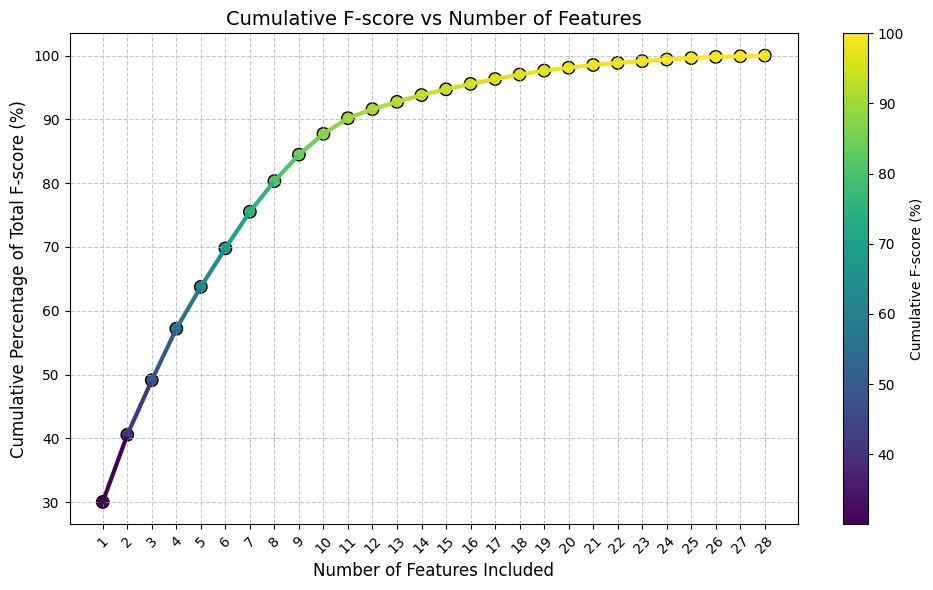

In [6]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Your data
data = {
    'Feature': [
        'FD_Mag2', 'FD_Mag4', 'Similarity Score_414', 'Similarity Score_417', 'Compactness',
        'Similarity Score_422', 'Similarity Score_430', 'FD_Mag7', 'Skewness', 'Kurtosis',
        'Similarity Score_105', 'FD_Mag9', 'FD_Mag3', 'FD_Mag5', 'FD_Mag6', 'FD_Mag13',
        'FD_Mag11', 'FD_Mag17', 'FD_Mag15', 'Variance', 'FD_Mag10', 'FD_Mag8',
        'FD_Mag12', 'FD_Mag19', 'FD_Mag14', 'FD_Mag18', 'FD_Mag16', 'FD_Mag20'
    ],
    'F_score': [
        764.286505, 268.219203, 217.976255, 205.657351, 167.0817,
        153.703942, 146.158729, 122.355619, 105.516909, 83.063463,
        62.617785, 36.094122, 29.08935, 27.217653, 22.969171, 21.528545,
        19.46563, 17.892227, 15.762653, 11.483887, 10.926623, 8.573792,
        6.698659, 6.58552, 5.721034, 4.735761, 2.560063, 2.445164
    ]
}

df = pd.DataFrame(data)
df_sorted = df.sort_values(by='F_score', ascending=False).reset_index(drop=True)

# Calculate cumulative sum and cumulative percentage
df_sorted['Cumulative_F'] = df_sorted['F_score'].cumsum()
total_F = df_sorted['F_score'].sum()
df_sorted['Cumulative_Percent'] = 100 * df_sorted['Cumulative_F'] / total_F

x = df_sorted.index + 1
y = df_sorted['Cumulative_Percent']

# Normalize cumulative percentages for colormap
norm = mcolors.Normalize(vmin=y.min(), vmax=y.max())
cmap = cm.viridis  # You can try 'plasma', 'inferno', 'magma' etc.

colors = cmap(norm(y))

plt.figure(figsize=(10,6))

# Plot colored points with gradient
for i in range(len(x)-1):
    plt.plot(x[i:i+2], y[i:i+2], color=colors[i], linewidth=3)

# Scatter plot for points with color gradient
sc = plt.scatter(x, y, c=y, cmap=cmap, norm=norm, edgecolor='k', s=80)

plt.colorbar(sc, label='Cumulative F-score (%)')

plt.xticks(np.arange(1, len(df_sorted) + 1, step=1), rotation=45)
plt.xlabel('Number of Features Included', fontsize=12)
plt.ylabel('Cumulative Percentage of Total F-score (%)', fontsize=12)
plt.title('Cumulative F-score vs Number of Features', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [7]:
import pandas as pd
import numpy as np
import joblib
import optuna
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif

# ----------------------------------------
# 1. Load and Preprocess Dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")

X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Feature selection (top 21 features using ANOVA F-score)
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# 2. Hyperparameter Tuning with Optuna
# ----------------------------------------
def objective(trial):
    C = trial.suggest_loguniform('C', 10, 200)
    gamma = trial.suggest_loguniform('gamma', 0.001, 0.01)
    kernel = trial.suggest_categorical('kernel', ['rbf', 'poly', 'sigmoid'])

    model = SVC(C=C, gamma=gamma, kernel=kernel, probability=True)
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy')

    return scores.mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, timeout=300)

print("🔍 Best trial:")
print(study.best_trial)

best_params = study.best_params
print("✅ Best Hyperparameters:", best_params)

# ----------------------------------------
# 3. Cross-validation with Best Parameters to Get Mean & Std Dev
# ----------------------------------------
best_svm = SVC(**best_params, probability=True)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_svm, X_train, y_train, cv=cv, scoring='accuracy')

print(f"\n📈 Cross-validation Mean Accuracy: {cv_scores.mean():.4f}")
print(f"📊 Cross-validation Std. Deviation: {cv_scores.std():.4f}")

# ----------------------------------------
# 4. Train Final Model on Full Training Data
# ----------------------------------------
best_svm.fit(X_train, y_train)

# Save model and preprocessors
joblib.dump(best_svm, "best_svm_optuna_model.pkl")
joblib.dump(le, "label_encoder.pkl")
joblib.dump(scaler, "scaler.pkl")
joblib.dump(top21_features, "top21_features.pkl")

# ----------------------------------------
# 5. Evaluation on Test Data
# ----------------------------------------
y_pred = best_svm.predict(X_test)

print(f"\n✅ Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


[I 2025-08-22 00:04:43,760] A new study created in memory with name: no-name-d4f83b46-80da-4355-8f73-0384c52b698c
C:\Users\lenovo\AppData\Local\Temp\ipykernel_23340\1225464663.py:41: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 10, 200)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_23340\1225464663.py:42: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  gamma = trial.suggest_loguniform('gamma', 0.001, 0.01)
[I 2025-08-22 00:04:51,624] Trial 0 finished with value: 0.7340767482444095 and parameters: {'C': 130.6017694518769, 'gamma': 0.00482232340573358, 'kernel': 'rbf'}. Best is trial 0 with value: 0.7340767482444095.
C:\Users\lenovo\AppData

🔍 Best trial:
FrozenTrial(number=24, state=1, values=[0.7389312336209843], datetime_start=datetime.datetime(2025, 8, 22, 0, 7, 34, 357141), datetime_complete=datetime.datetime(2025, 8, 22, 0, 7, 43, 801617), params={'C': 171.70137707688252, 'gamma': 0.0074027003591652886, 'kernel': 'rbf'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'C': FloatDistribution(high=200.0, log=True, low=10.0, step=None), 'gamma': FloatDistribution(high=0.01, log=True, low=0.001, step=None), 'kernel': CategoricalDistribution(choices=('rbf', 'poly', 'sigmoid'))}, trial_id=24, value=None)
✅ Best Hyperparameters: {'C': 171.70137707688252, 'gamma': 0.0074027003591652886, 'kernel': 'rbf'}

📈 Cross-validation Mean Accuracy: 0.7389
📊 Cross-validation Std. Deviation: 0.0193

✅ Test Accuracy: 0.7870

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.89      0.92      0.91       146
    RRII 414       0.75      0.66      0.70       146
    R

C:\Users\lenovo\miniconda3\Lib\site-packages\kaleido\__init__.py:14: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




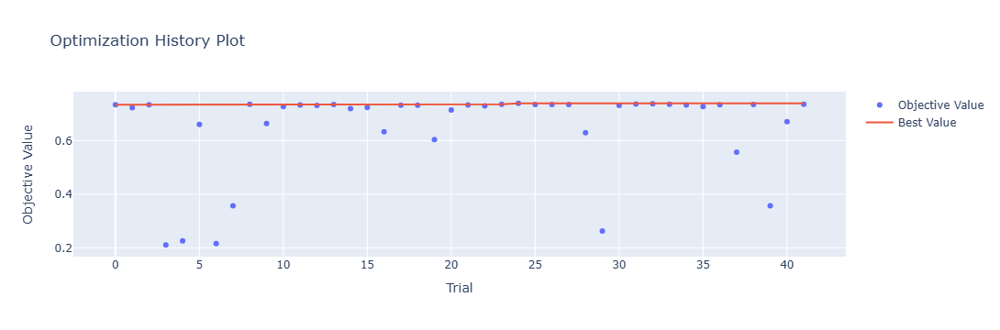

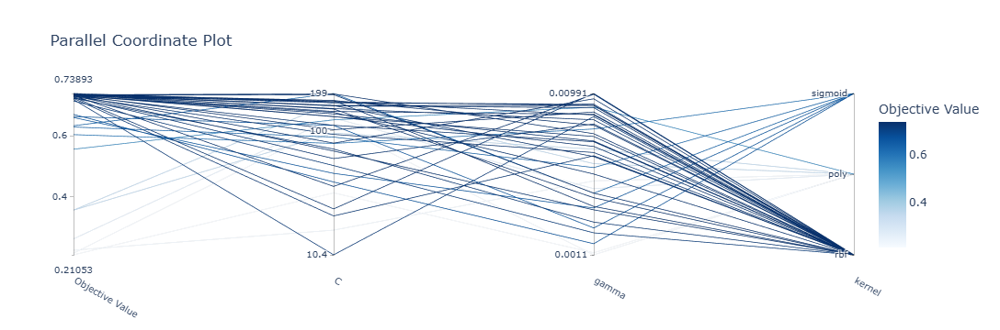

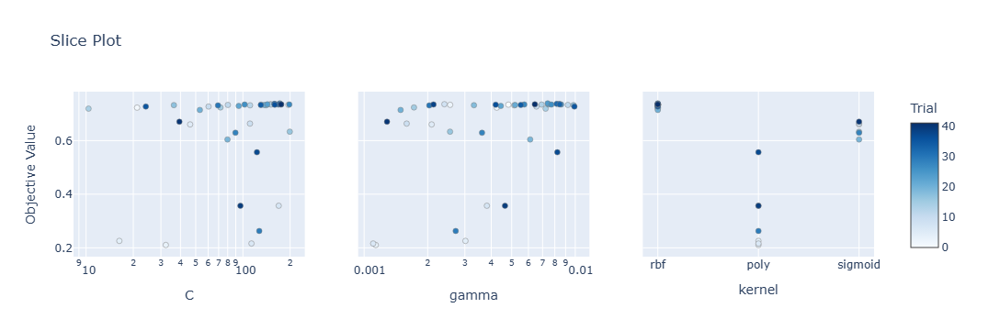

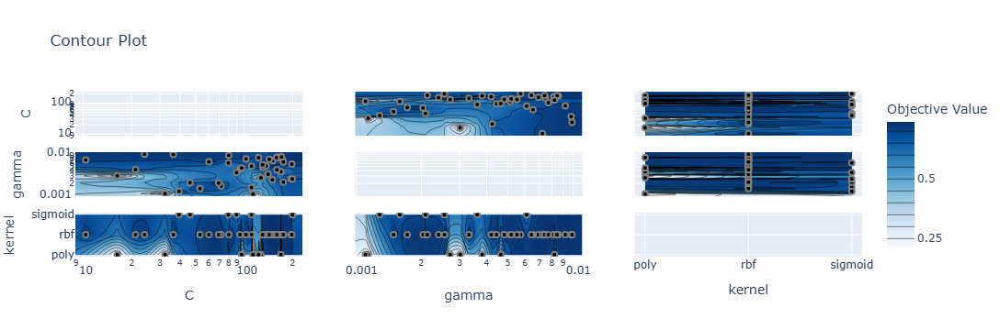

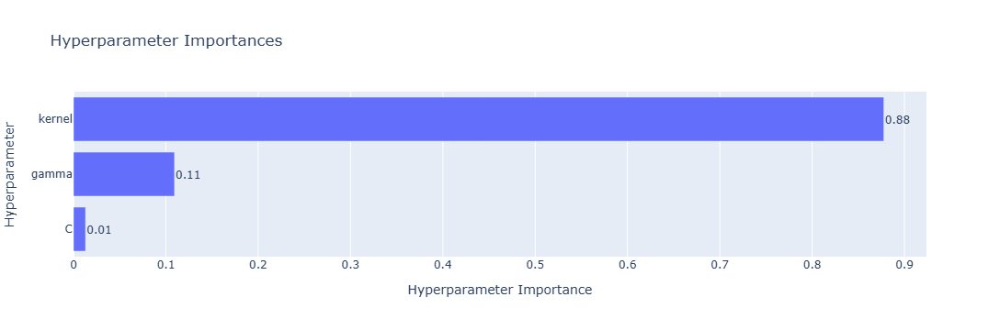

C:\Users\lenovo\AppData\Local\Temp\ipykernel_23340\459632367.py:26: ExperimentalWarning:

plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.



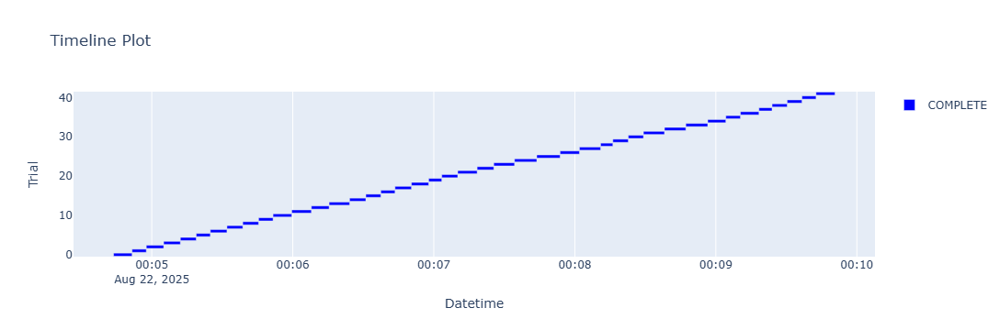

[W 2025-08-22 00:10:42,154] You need to set up the pruning feature to utilize `plot_intermediate_values()`


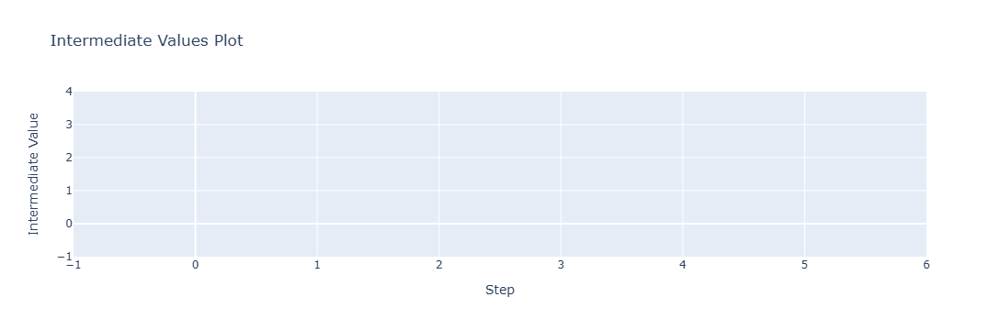

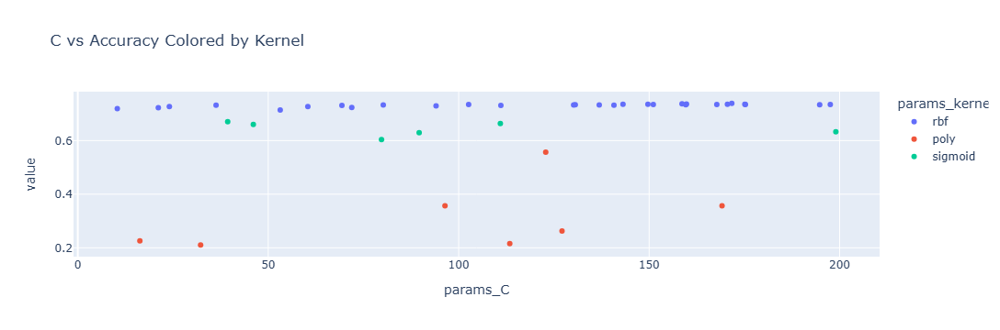

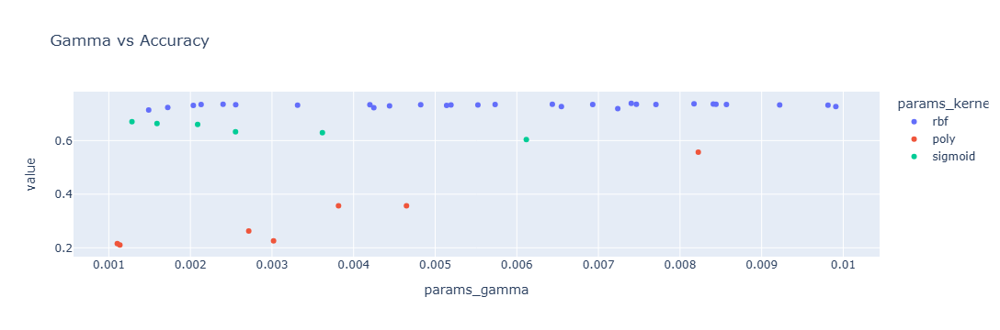

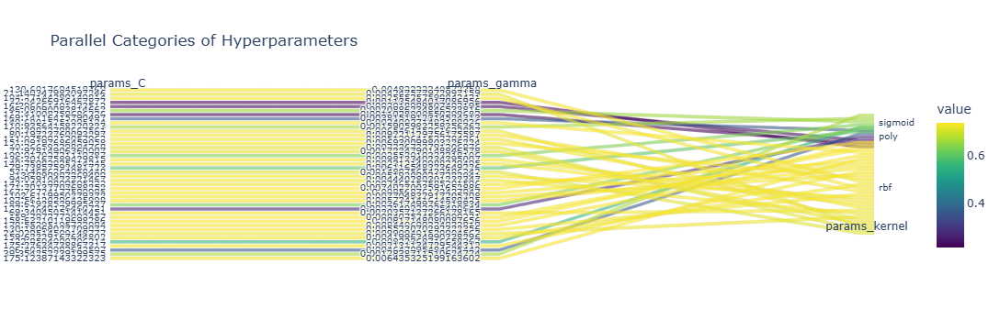

In [8]:
import optuna.visualization as vis
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# ===========================
# Built-in Optuna Visualizations
# ===========================

# 1. Optimization History
vis.plot_optimization_history(study).show()

# 2. Parallel Coordinate Plot
vis.plot_parallel_coordinate(study).show()

# 3. Slice Plot
vis.plot_slice(study).show()

# 4. Contour Plot (2D hyperparameter interactions)
vis.plot_contour(study).show()

# 5. Hyperparameter Importance
vis.plot_param_importances(study).show()

# 6. Trial Duration Plot
vis.plot_timeline(study).show()

# 7. Optimization Convergence
vis.plot_intermediate_values(study).show()  # Only works if intermediate values are reported

# ===========================
# Optional: Custom Plot – Param vs Accuracy
# ===========================
df_trials = study.trials_dataframe(attrs=("number", "value", "params", "duration"))

# Example: Scatter of C vs Accuracy
fig = px.scatter(df_trials, x="params_C", y="value", color="params_kernel",
                 title="C vs Accuracy Colored by Kernel")
fig.show()

# Example: Gamma vs Accuracy
fig = px.scatter(df_trials, x="params_gamma", y="value", color="params_kernel",
                 title="Gamma vs Accuracy")
fig.show()

# ===========================
# Optional: Parallel Categories (Categorical + Numeric View)
# ===========================
from plotly.express import parallel_categories

parallel_categories(
    df_trials,
    dimensions=["params_C", "params_gamma", "params_kernel"],
    color="value",
    color_continuous_scale=px.colors.sequential.Viridis,
    title="Parallel Categories of Hyperparameters",
).show()

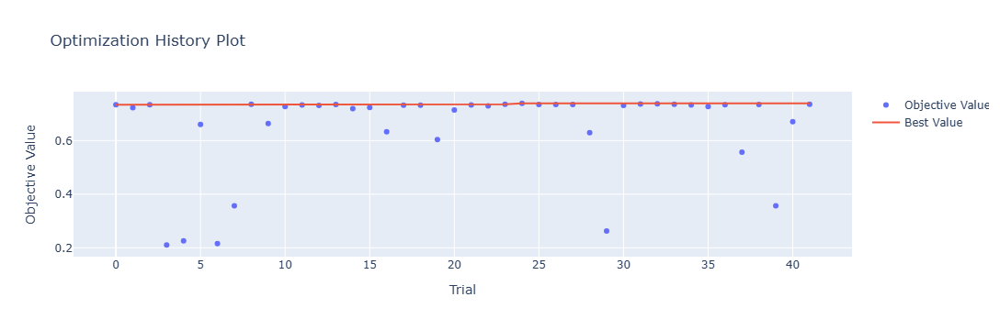

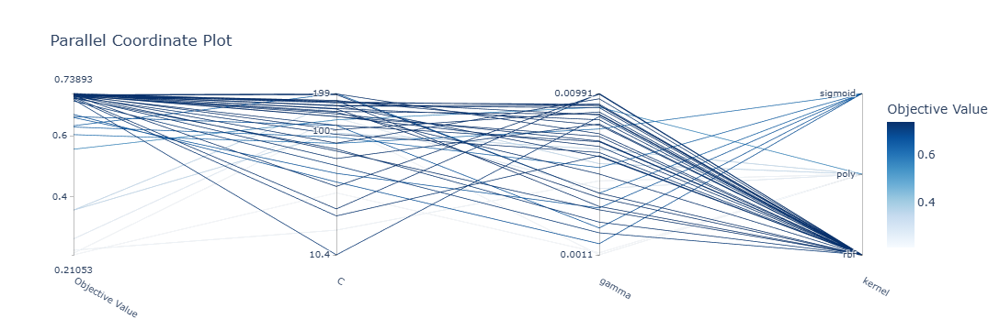

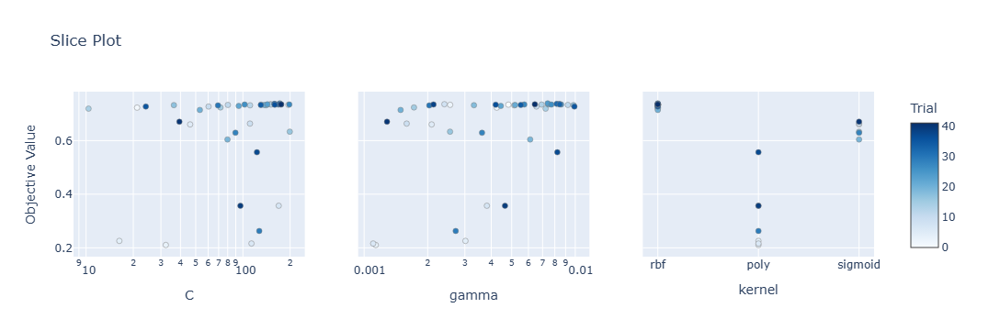

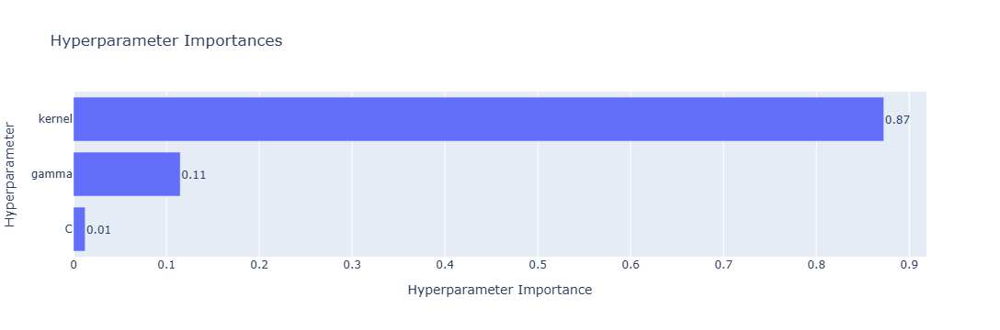

C:\Users\lenovo\AppData\Local\Temp\ipykernel_23340\1347429495.py:33: ExperimentalWarning:

plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.



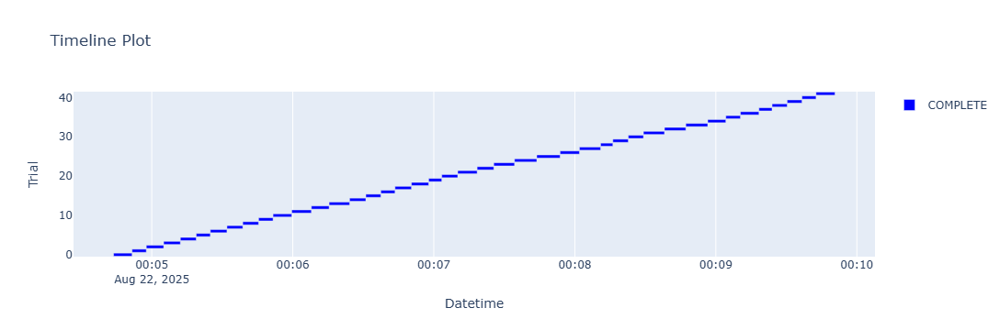

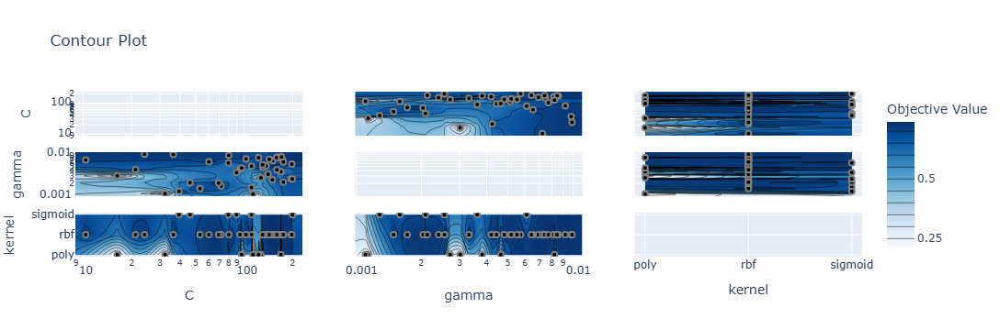

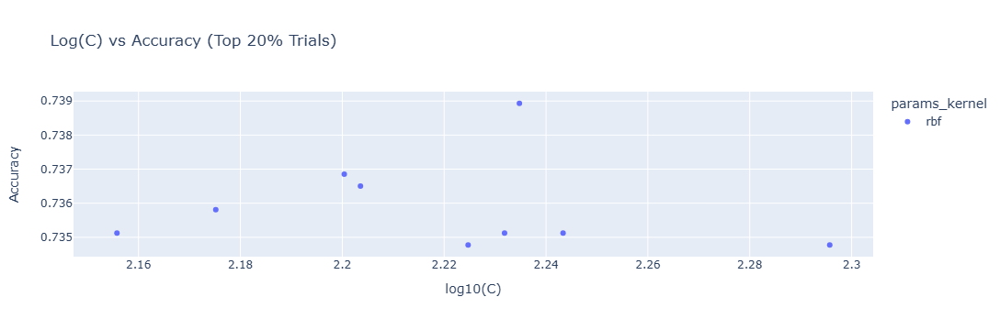

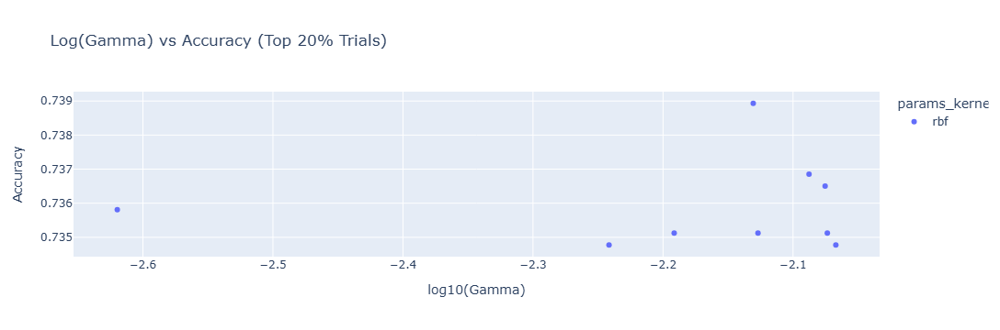

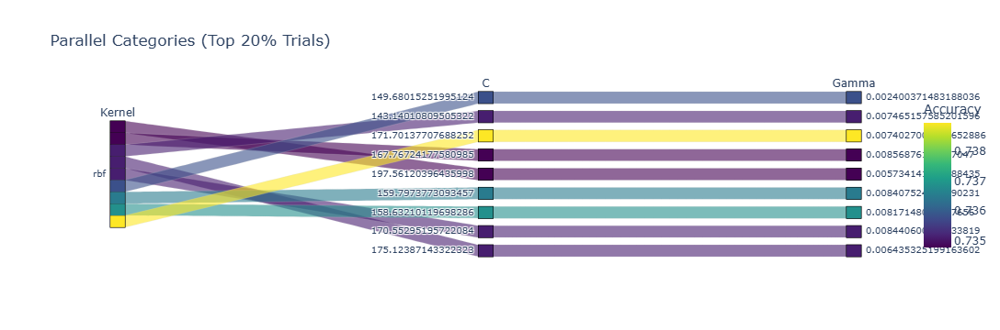

In [9]:
import optuna.visualization as vis
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt

# ===============================
# Get trials as DataFrame
# ===============================
df_trials = study.trials_dataframe(attrs=("number", "value", "params", "duration"))

# Convert params to float
df_trials["params_C"] = df_trials["params_C"].astype(float)
df_trials["params_gamma"] = df_trials["params_gamma"].astype(float)

# Add log scale columns
df_trials["log_C"] = np.log10(df_trials["params_C"])
df_trials["log_gamma"] = np.log10(df_trials["params_gamma"])

# ===============================
# Filter Top Trials (Top 20%)
# ===============================
threshold = df_trials["value"].quantile(0.8)
df_top = df_trials[df_trials["value"] >= threshold]

# ===============================
# Built-in Optuna Visualizations
# ===============================
vis.plot_optimization_history(study).show()
vis.plot_parallel_coordinate(study).show()
vis.plot_slice(study).show()
vis.plot_param_importances(study).show()
vis.plot_timeline(study).show()
vis.plot_contour(study).show()

# ===============================
# Custom: C vs Accuracy (log scale)
# ===============================
fig = px.scatter(
    df_top,
    x="log_C",
    y="value",
    color="params_kernel",
    title="Log(C) vs Accuracy (Top 20% Trials)",
    labels={"log_C": "log10(C)", "value": "Accuracy"},
)
fig.show()

# ===============================
# Custom: Gamma vs Accuracy (log scale)
# ===============================
fig = px.scatter(
    df_top,
    x="log_gamma",
    y="value",
    color="params_kernel",
    title="Log(Gamma) vs Accuracy (Top 20% Trials)",
    labels={"log_gamma": "log10(Gamma)", "value": "Accuracy"},
)
fig.show()

# ===============================
# Optional: Parallel Categories Plot
# ===============================
import plotly.express as px

fig = px.parallel_categories(
    df_top,
    dimensions=["params_kernel", "params_C", "params_gamma"],
    color="value",
    color_continuous_scale=px.colors.sequential.Viridis,
    labels={
        "params_kernel": "Kernel",
        "params_C": "C",
        "params_gamma": "Gamma",
        "value": "Accuracy"
    },
    title="Parallel Categories (Top 20% Trials)"
)
fig.show()

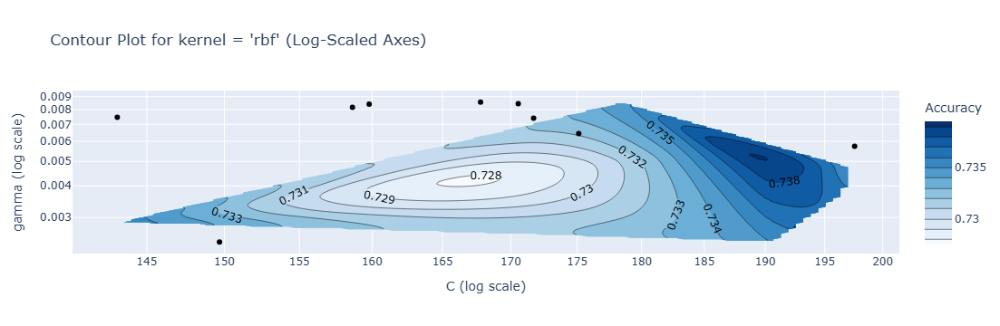

In [10]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Extract and prepare trial data
df = study.trials_dataframe(attrs=("number", "value", "params"))
df = df.dropna()

# Convert to correct types
df["C"] = df["params_C"].astype(float)
df["gamma"] = df["params_gamma"].astype(float)
df["kernel"] = df["params_kernel"]
df["log_C"] = np.log10(df["C"])
df["log_gamma"] = np.log10(df["gamma"])
df["accuracy"] = df["value"]

# Filter top 20% trials
threshold = df["accuracy"].quantile(0.8)
df_top = df[df["accuracy"] >= threshold]

# List of kernels
kernels = df_top["kernel"].unique()

# Generate contour plot for each kernel
for k in kernels:
    df_kernel = df_top[df_top["kernel"] == k]

    if len(df_kernel) < 5:
        print(f"Skipping kernel '{k}' due to insufficient data.")
        continue

    # Grid
    grid_x, grid_y = np.mgrid[
        df_kernel["log_C"].min():df_kernel["log_C"].max():100j,
        df_kernel["log_gamma"].min():df_kernel["log_gamma"].max():100j
    ]

    # Interpolation
    grid_z = griddata(
        (df_kernel["log_C"], df_kernel["log_gamma"]),
        df_kernel["accuracy"],
        (grid_x, grid_y),
        method="cubic"
    )

    # Plot
    fig = go.Figure()

    fig.add_trace(go.Contour(
        z=grid_z,
        x=10**grid_x[:, 0],
        y=10**grid_y[0, :],
        colorscale='Blues',
        contours=dict(showlabels=True),
        colorbar=dict(title='Accuracy'),
        hovertemplate='C=%{x:.2f}<br>gamma=%{y:.5f}<br>accuracy=%{z:.4f}<extra></extra>'
    ))

    fig.add_trace(go.Scatter(
        x=df_kernel["C"],
        y=df_kernel["gamma"],
        mode='markers',
        marker=dict(color='black', size=6),
        name='Trials'
    ))

    fig.update_layout(
        title=f"Contour Plot for kernel = '{k}' (Log-Scaled Axes)",
        xaxis=dict(title='C (log scale)', type='log'),
        yaxis=dict(title='gamma (log scale)', type='log'),
        height=600
    )

    fig.show()

In [11]:
import pandas as pd
import joblib
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# ----------------------------------------
# 1. Load test dataset
# ----------------------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")   # <-- use correct test file name

# Separate features and label
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

# ----------------------------------------
# 2. Load preprocessing objects
# ----------------------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")   # <-- load SVM instead of RF
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")       # feature subset used in training

# ----------------------------------------
# 3. Preprocess test data
# ----------------------------------------
X_test_selected = X_test_raw[top_features]           # select top 21 features
X_test_scaled = scaler.transform(X_test_selected)    # apply scaling
y_test_encoded = le.transform(y_test_raw)            # encode labels

# ----------------------------------------
# 4. Predict and evaluate
# ----------------------------------------
y_pred = svm_model.predict(X_test_scaled)

print(f"\n✅ SVM Accuracy: {accuracy_score(y_test_encoded, y_pred):.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test_encoded, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_pred))


✅ SVM Accuracy: 0.7780

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.87      0.94      0.91       200
    RRII 414       0.73      0.79      0.76       200
    RRII 417       0.85      0.84      0.85       200
    RRII 422       0.65      0.62      0.64       200
    RRII 430       0.78      0.69      0.73       200

    accuracy                           0.78      1000
   macro avg       0.78      0.78      0.78      1000
weighted avg       0.78      0.78      0.78      1000


🧩 Confusion Matrix:
 [[189   6   1   4   0]
 [ 12 157   7  19   5]
 [  8  15 169   3   5]
 [  8  25  12 125  30]
 [  0  12   9  41 138]]


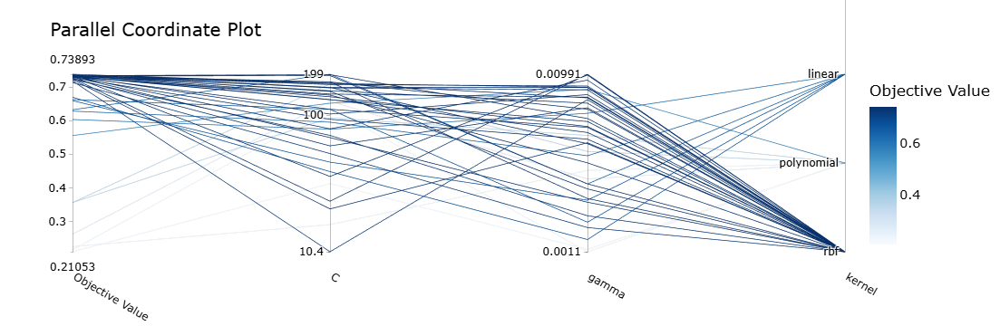

In [12]:
import optuna.visualization as vis
import plotly.graph_objects as go

# === Base plot ===
fig3 = vis.plot_parallel_coordinate(study)
fig3.update_layout(font=dict(color='black', size=16))

# === Fix categorical axis (kernel) ===
# Suppose your kernel choices are ["linear", "poly", "rbf", "sigmoid"]
# Replace them with clearer labels:
kernel_labels = {
    0: "rbf",
    1: "polynomial",   # instead of "poly"
    2: "linear",
    3: "sigmoid"
}

# Update the axis for 'kernel'
for dim in fig3.data[0].dimensions:
    if dim['label'] == 'kernel':
        dim['tickvals'] = list(kernel_labels.keys())
        dim['ticktext'] = list(kernel_labels.values())

# === Make ticks readable ===
fig3.update_layout(
    margin=dict(l=80, r=80, t=80, b=80),
    font=dict(size=14),
)

fig3.show()

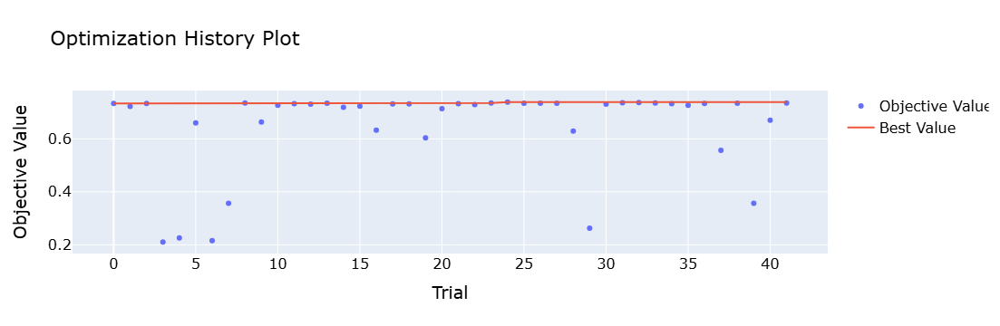

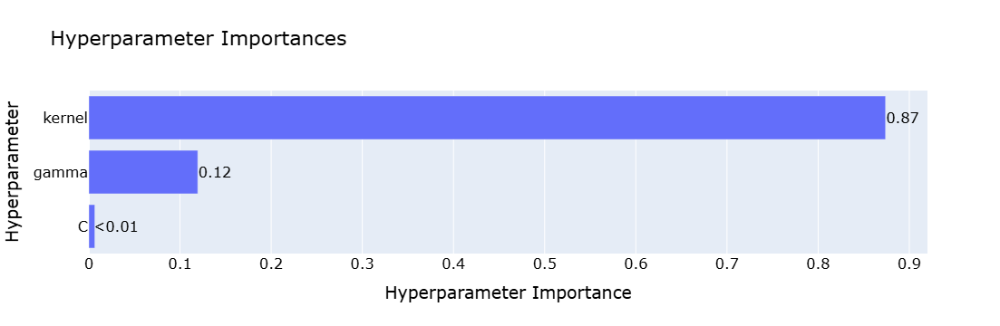

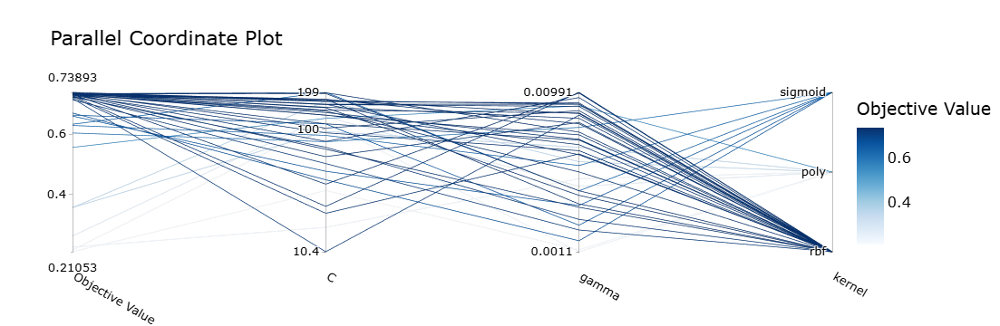

In [13]:
import optuna.visualization as vis

fig1 = vis.plot_optimization_history(study)
fig1.update_layout(font=dict(color='black', size=16))
fig1.show()

fig2 = vis.plot_param_importances(study)
fig2.update_layout(font=dict(color='black', size=16))
fig2.show()

fig3 = vis.plot_parallel_coordinate(study)
fig3.update_layout(font=dict(color='black', size=16))
fig3.show()

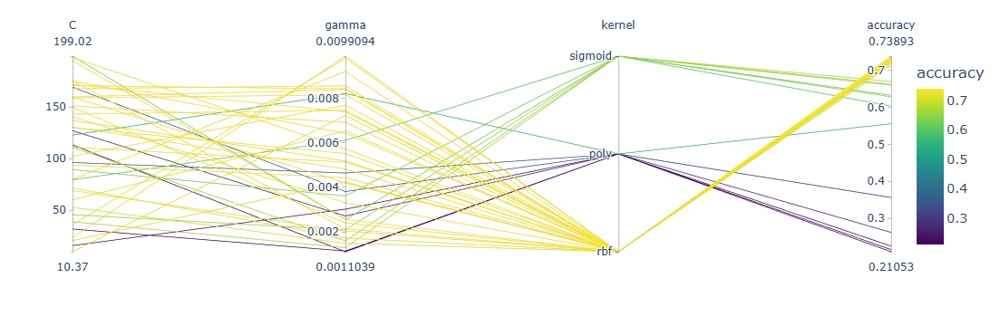

In [15]:
import pandas as pd
import plotly.express as px

# Extract parameters and values into a DataFrame
records = []
for trial in study.trials:
    # For safety, ensure all params exist in the trial (sometimes they can be missing)
    params = trial.params
    params['accuracy'] = trial.value
    records.append(params)

df_trials = pd.DataFrame(records)

# Fix categorical encoding for kernel
kernel_map = {'rbf': 0, 'poly': 1, 'sigmoid': 2}
df_trials['kernel_code'] = df_trials['kernel'].map(kernel_map)

# Plot parallel coordinates, including kernel as categorical axis
fig = px.parallel_coordinates(
    df_trials,
    dimensions=['C', 'gamma', 'kernel_code', 'accuracy'],
    color='accuracy',
    color_continuous_scale=px.colors.sequential.Viridis,
    labels={'kernel_code': 'kernel'}
)

# Update axis tick labels for kernel_code to show kernel names
fig.update_layout(
    font=dict(size=14)
)

fig.update_traces(
    dimensions=[
        dict(label='C', values=df_trials['C']),
        dict(label='gamma', values=df_trials['gamma']),
        dict(
            label='kernel',
            values=df_trials['kernel_code'],
            tickvals=[0,1,2],
            ticktext=['rbf', 'poly', 'sigmoid']
        ),
        dict(label='accuracy', values=df_trials['accuracy'])
    ]
)

fig.show()

In [16]:
import pandas as pd
import numpy as np
import joblib
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif

# ----------------------------------------
# 1. Load and preprocess dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")  # Update if needed
X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Feature selection: Top 21 using ANOVA F-score
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# 2. Define Optuna Objective Function
# ----------------------------------------
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 300),
        'max_depth': trial.suggest_int('max_depth', 5, 30),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'random_state': 42
    }

    rf = RandomForestClassifier(**params)
    score = cross_val_score(rf, X_train, y_train, cv=5, scoring='accuracy').mean()
    return score

# ----------------------------------------
# 3. Run Optuna Study
# ----------------------------------------
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30, timeout=300)

# Print best trial
print("🔍 Best trial:")
print(study.best_trial)

# ----------------------------------------
# 4. Train and Evaluate Best RF Model
# ----------------------------------------
best_params = study.best_params
best_params['random_state'] = 42

rf_best = RandomForestClassifier(**best_params)
rf_best.fit(X_train, y_train)

# Save model and preprocessing
joblib.dump(rf_best, "best_random_forest_model.pkl")
joblib.dump(le, "label_encoder.pkl")
joblib.dump(scaler, "scaler.pkl")
joblib.dump(top21_features, "top21_features.pkl")
print("📦 Best Random Forest model and preprocessing pipeline saved.")

# Evaluation
y_pred_rf = rf_best.predict(X_test)
print(f"\n✅ RF Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}")
print("\n📊 RF Classification Report:\n", classification_report(y_test, y_pred_rf, target_names=le.classes_))
print("\n🧩 RF Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))

[I 2025-08-22 00:15:12,232] A new study created in memory with name: no-name-cdc05513-12b8-42a0-85cf-5e27660e9805
[I 2025-08-22 00:15:23,205] Trial 0 finished with value: 0.7240295526917058 and parameters: {'n_estimators': 187, 'max_depth': 29, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': True}. Best is trial 0 with value: 0.7240295526917058.
[I 2025-08-22 00:15:29,840] Trial 1 finished with value: 0.7191804645193789 and parameters: {'n_estimators': 124, 'max_depth': 18, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': True}. Best is trial 0 with value: 0.7240295526917058.
[I 2025-08-22 00:15:43,590] Trial 2 finished with value: 0.7022098552949572 and parameters: {'n_estimators': 237, 'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': 'log2', 'bootstrap': False}. Best is trial 0 with value: 0.7240295526917058.
[I 2025-08-22 00:15:57,796] Trial 3 finished with value: 0.7288774414853106

🔍 Best trial:
FrozenTrial(number=13, state=1, values=[0.7351034164302892], datetime_start=datetime.datetime(2025, 8, 22, 0, 18, 3, 656218), datetime_complete=datetime.datetime(2025, 8, 22, 0, 18, 27, 926248), params={'n_estimators': 292, 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'bootstrap': False}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=300, log=False, low=100, step=1), 'max_depth': IntDistribution(high=30, log=False, low=5, step=1), 'min_samples_split': IntDistribution(high=10, log=False, low=2, step=1), 'min_samples_leaf': IntDistribution(high=5, log=False, low=1, step=1), 'max_features': CategoricalDistribution(choices=('sqrt', 'log2')), 'bootstrap': CategoricalDistribution(choices=(True, False))}, trial_id=13, value=None)
📦 Best Random Forest model and preprocessing pipeline saved.

✅ RF Accuracy: 0.7441

📊 RF Classification Report:
               precision    recall 


📈 Visualizing Optuna tuning results for Random Forest...


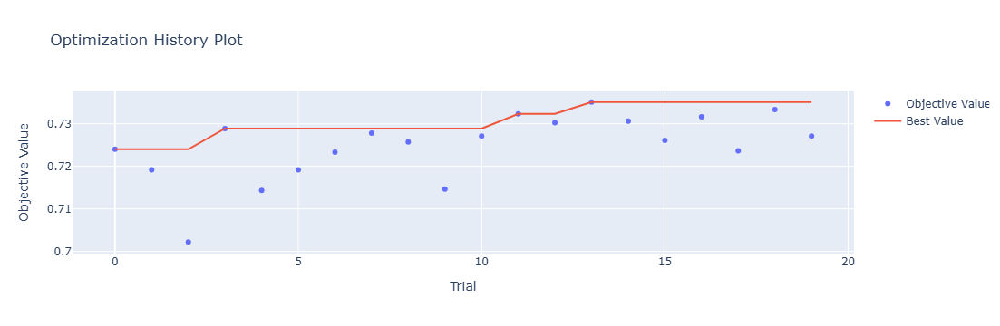

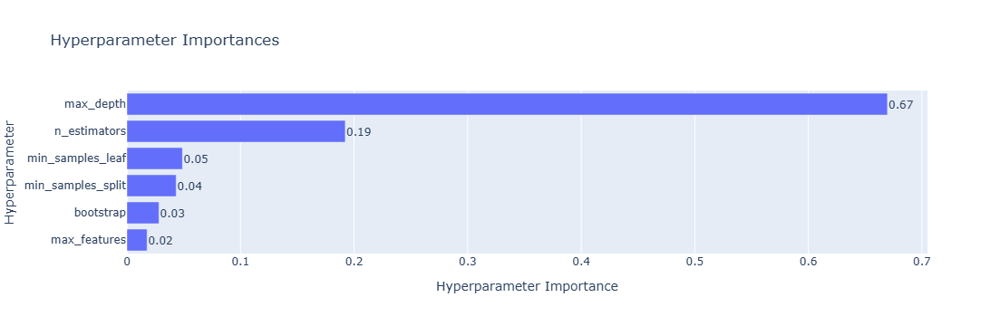

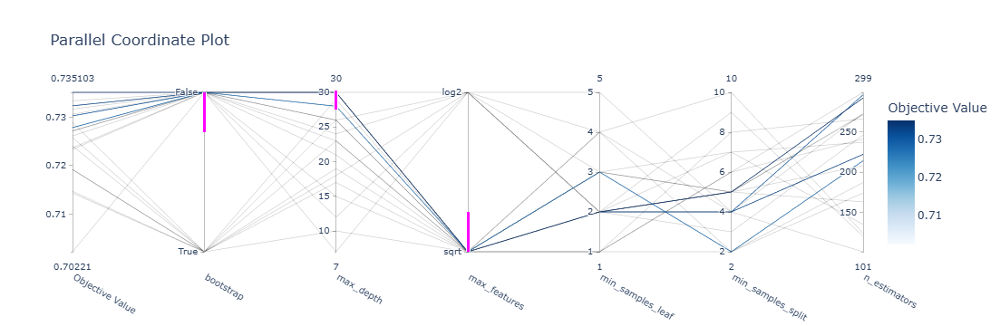

In [17]:
# ----------------------------------------
# 5. Visualize Optimization Results
# ----------------------------------------
print("\n📈 Visualizing Optuna tuning results for Random Forest...")

vis.plot_optimization_history(study).show()
vis.plot_param_importances(study).show()
vis.plot_parallel_coordinate(study).show()

In [18]:
import pandas as pd
import joblib
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# ----------------------------------------
# 1. Load test dataset
# ----------------------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")

# Separate features and label
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

# ----------------------------------------
# 2. Load preprocessing objects
# ----------------------------------------
rf_model = joblib.load("best_random_forest_model.pkl")
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")  # or the name used during saving

# ----------------------------------------
# 3. Preprocess test data
# ----------------------------------------
X_test_selected = X_test_raw[top_features]           # select top features
X_test_scaled = scaler.transform(X_test_selected)    # apply scaling
y_test_encoded = le.transform(y_test_raw)            # encode labels

# ----------------------------------------
# 4. Predict and evaluate
# ----------------------------------------
y_pred = rf_model.predict(X_test_scaled)

print(f"\n✅ Random Forest Accuracy: {accuracy_score(y_test_encoded, y_pred):.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test_encoded, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_pred))


✅ Random Forest Accuracy: 0.7610

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.81      0.94      0.87       200
    RRII 414       0.72      0.72      0.72       200
    RRII 417       0.79      0.87      0.83       200
    RRII 422       0.66      0.56      0.61       200
    RRII 430       0.80      0.71      0.76       200

    accuracy                           0.76      1000
   macro avg       0.76      0.76      0.76      1000
weighted avg       0.76      0.76      0.76      1000


🧩 Confusion Matrix:
 [[187   9   2   2   0]
 [ 28 144   8  19   1]
 [  8   9 174   2   7]
 [  8  33  19 113  27]
 [  0   6  16  35 143]]


In [27]:
import xgboost
print(xgboost.__version__)

2.1.1


[I 2025-08-22 00:21:17,308] A new study created in memory with name: no-name-d170b766-fba2-49b0-a463-5b99a4e6532a
C:\Users\lenovo\miniconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[00:21:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\lenovo\miniconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[00:21:17] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\lenovo\miniconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[00:21:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\lenovo\miniconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[00:21:18] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\lenovo\mi

🔍 Best trial:
FrozenTrial(number=20, state=1, values=[0.7628066661469358], datetime_start=datetime.datetime(2025, 8, 22, 0, 22, 33, 692671), datetime_complete=datetime.datetime(2025, 8, 22, 0, 22, 47, 800214), params={'n_estimators': 262, 'max_depth': 8, 'learning_rate': 0.0655579140583233, 'subsample': 0.666636931854247, 'colsample_bytree': 0.9626585674567758, 'gamma': 0.016398254208344967, 'reg_alpha': 0.041023723028558556, 'reg_lambda': 0.8369059759384525}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=300, log=False, low=100, step=1), 'max_depth': IntDistribution(high=12, log=False, low=3, step=1), 'learning_rate': FloatDistribution(high=0.3, log=False, low=0.01, step=None), 'subsample': FloatDistribution(high=1.0, log=False, low=0.6, step=None), 'colsample_bytree': FloatDistribution(high=1.0, log=False, low=0.6, step=None), 'gamma': FloatDistribution(high=5.0, log=False, low=0.0, step=None), 'reg_alpha': FloatDistributi

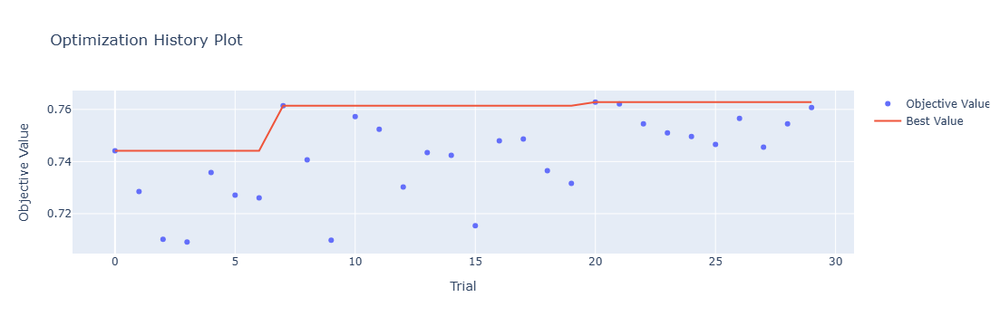

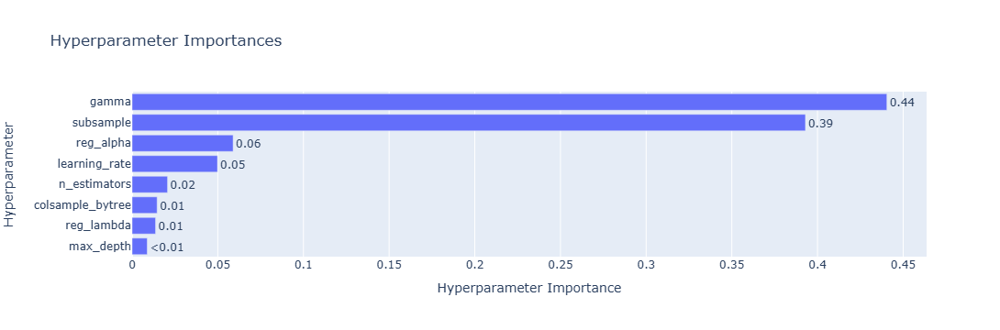

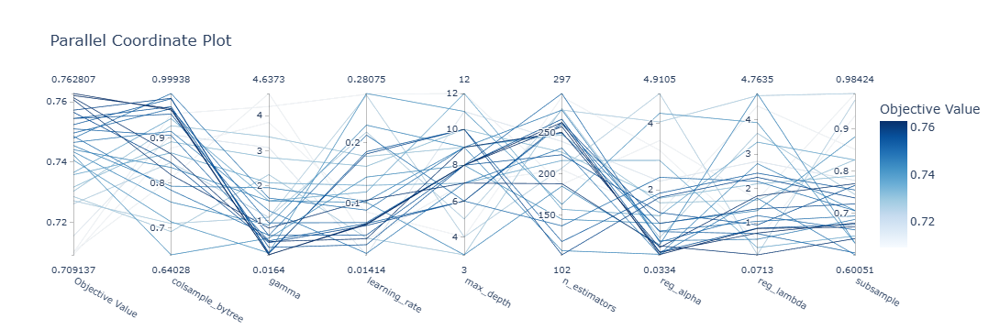

In [19]:
import pandas as pd
import numpy as np
import joblib
import optuna
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif

# ----------------------------------------
# 1. Load and preprocess dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Feature selection: top 21 ANOVA F-scores
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# 2. Define Optuna objective function
# ----------------------------------------
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 300),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
        'use_label_encoder': False,
        'eval_metric': 'mlogloss',
        'random_state': 42
    }

    model = XGBClassifier(**params)
    score = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy').mean()
    return score

# ----------------------------------------
# 3. Run Optuna study
# ----------------------------------------
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30, timeout=300)  # Tune n_trials or timeout as needed

print("🔍 Best trial:")
print(study.best_trial)

# ----------------------------------------
# 4. Train best XGBoost model
# ----------------------------------------
best_params = study.best_params
best_params.update({
    'use_label_encoder': False,
    'eval_metric': 'mlogloss',
    'random_state': 42
})

xgb_best = XGBClassifier(**best_params)
xgb_best.fit(X_train, y_train)

# Save model and preprocessing pipeline
joblib.dump(xgb_best, "best_xgboost_model.pkl")
joblib.dump(le, "label_encoder.pkl")
joblib.dump(scaler, "scaler.pkl")
joblib.dump(top21_features, "top21_features.pkl")
print("📦 Best XGBoost model and preprocessing pipeline saved.")

# ----------------------------------------
# 5. Evaluate on test set
# ----------------------------------------
y_pred_xgb = xgb_best.predict(X_test)

print(f"\n✅ XGB Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")
print("\n📊 XGB Classification Report:\n", classification_report(y_test, y_pred_xgb, target_names=le.classes_))
print("\n🧩 XGB Confusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb))

# ----------------------------------------
# 5. Visualize Optimization Results
# ----------------------------------------
print("\n📈 Visualizing Optuna tuning results for Random Forest...")

vis.plot_optimization_history(study).show()
vis.plot_param_importances(study).show()
vis.plot_parallel_coordinate(study).show()


📈 Visualizing Optuna tuning results for XGBoost...


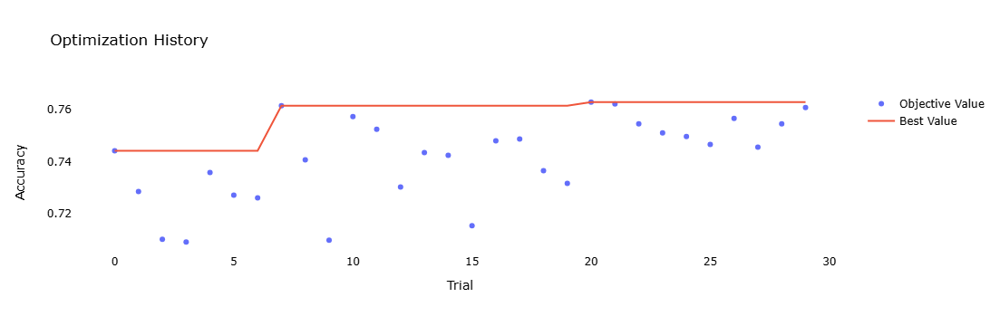

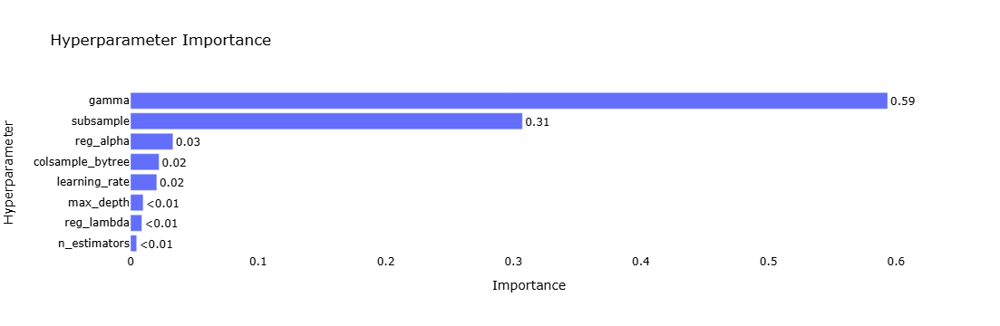


📏 Standard Deviation of Hyperparameters:
colsample_bytree: 0.0980
gamma: 1.3368
learning_rate: 0.0813
max_depth: 2.4410
n_estimators: 56.6799
reg_alpha: 1.3891
reg_lambda: 1.3719
subsample: 0.1126


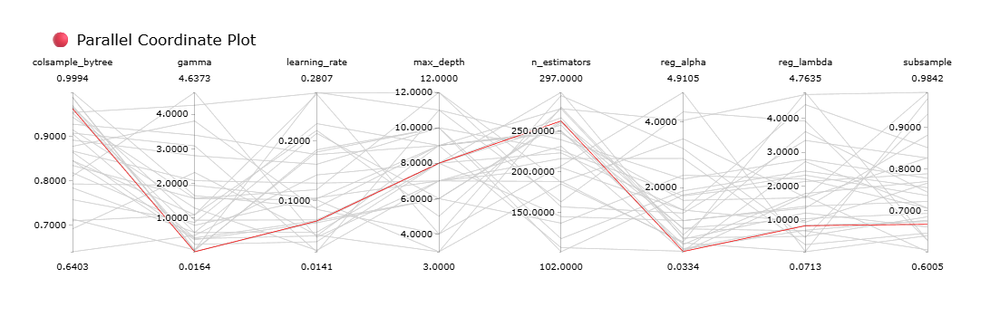

In [20]:
# ----------------------------------------
# 6. Visualize Optimization Results (Improved for Journal)
# ----------------------------------------
print("\n📈 Visualizing Optuna tuning results for XGBoost...")

# Optimization History
fig_opt = vis.plot_optimization_history(study)
fig_opt.update_layout(
    title="Optimization History",
    font=dict(color='black'),
    title_font=dict(color='black'),
    xaxis=dict(title='Trial', titlefont=dict(color='black'), tickfont=dict(color='black')),
    yaxis=dict(title='Accuracy', titlefont=dict(color='black'), tickfont=dict(color='black')),
    plot_bgcolor='white',
)
fig_opt.show()

# Hyperparameter Importances
fig_imp = vis.plot_param_importances(study)
fig_imp.update_layout(
    title="Hyperparameter Importance",
    font=dict(color='black'),
    title_font=dict(color='black'),
    xaxis=dict(title='Importance', titlefont=dict(color='black'), tickfont=dict(color='black')),
    yaxis=dict(title='Hyperparameter', titlefont=dict(color='black'), tickfont=dict(color='black')),
    plot_bgcolor='white',
)
fig_imp.show()

# ----------------------------------------
# 7. Enhanced Parallel Coordinate Plot (Highlight Best Trial in Red)
# ----------------------------------------

# Convert Optuna study to DataFrame
df_trials = study.trials_dataframe(attrs=('number', 'value', 'params', 'state'))
df_trials = df_trials[df_trials['state'] == 'COMPLETE']

# Identify best trial number
best_trial_num = study.best_trial.number
df_trials['is_best'] = df_trials['number'] == best_trial_num

# Create color column: 1 for best trial, 0 for others
df_trials['highlight'] = df_trials['is_best'].astype(int)

# Extract parameter columns
param_cols = [col for col in df_trials.columns if col.startswith('params_')]

# Print standard deviation of each hyperparameter
print("\n📏 Standard Deviation of Hyperparameters:")
for col in param_cols:
    std_val = df_trials[col].std()
    print(f"{col.replace('params_', '')}: {std_val:.4f}")

# Prepare plot dimensions
dimensions = []
for col in param_cols:
    label = col.replace('params_', '')
    values = df_trials[col].values
    dimensions.append(
        dict(
            label=label,
            values=values,
            range=[min(values), max(values)],
            tickformat=".4f"  # Optional: for consistent decimal formatting
        )
    )

# Plot with best trial in red, others in light gray
fig = go.Figure(data=go.Parcoords(
    line=dict(
        color=df_trials['highlight'],
        colorscale=[[0, 'lightgray'], [1, 'red']],
        showscale=False
    ),
    dimensions=dimensions
))

fig.update_layout(
    title="🔴 Parallel Coordinate Plot",
    font=dict(color='black'),
    plot_bgcolor='white',
    paper_bgcolor='white',
    title_font=dict(color='black')
)
fig.show()


📈 Visualizing Optuna tuning results for XGBoost...


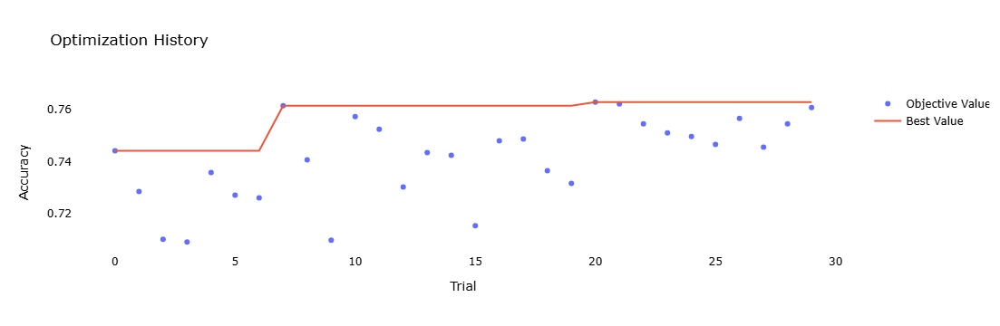

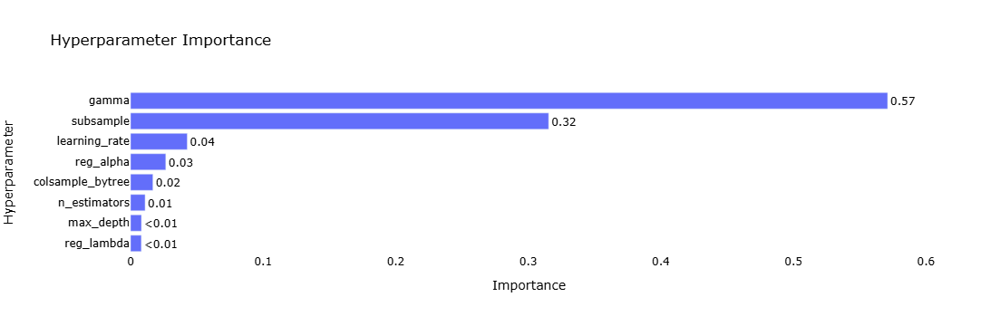


📏 Standard Deviation of Hyperparameters:
colsample_bytree: 0.10
gamma: 1.34
learning_rate: 0.08
max_depth: 2.44
n_estimators: 56.68
reg_alpha: 1.39
reg_lambda: 1.37
subsample: 0.11


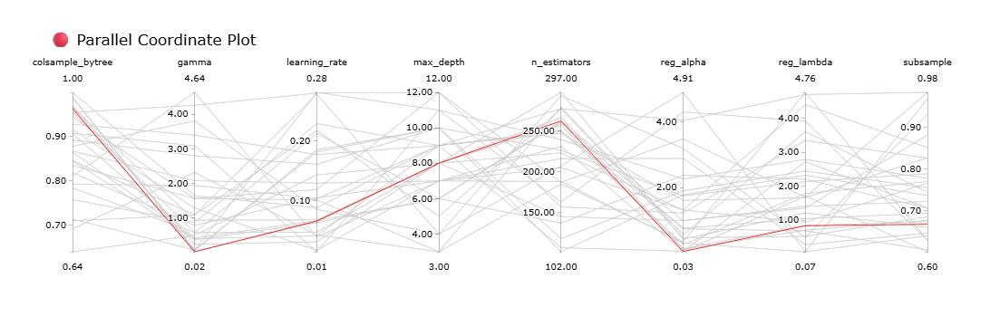

In [24]:
# ----------------------------------------
# 6. Visualize Optimization Results (Improved for Journal)
# ----------------------------------------
print("\n📈 Visualizing Optuna tuning results for XGBoost...")

# Optimization History
fig_opt = vis.plot_optimization_history(study)
fig_opt.update_layout(
    title="Optimization History",
    font=dict(color='black'),
    title_font=dict(color='black'),
    xaxis=dict(title='Trial', titlefont=dict(color='black'), tickfont=dict(color='black')),
    yaxis=dict(title='Accuracy', titlefont=dict(color='black'), tickfont=dict(color='black')),
    plot_bgcolor='white',
)
fig_opt.show()

# Hyperparameter Importances
fig_imp = vis.plot_param_importances(study)
fig_imp.update_layout(
    title="Hyperparameter Importance",
    font=dict(color='black'),
    title_font=dict(color='black'),
    xaxis=dict(title='Importance', titlefont=dict(color='black'), tickfont=dict(color='black')),
    yaxis=dict(title='Hyperparameter', titlefont=dict(color='black'), tickfont=dict(color='black')),
    plot_bgcolor='white',
)
fig_imp.show()

# ----------------------------------------
# 7. Enhanced Parallel Coordinate Plot (Highlight Best Trial in Red)
# ----------------------------------------

# Convert Optuna study to DataFrame
df_trials = study.trials_dataframe(attrs=('number', 'value', 'params', 'state'))
df_trials = df_trials[df_trials['state'] == 'COMPLETE']

# Identify best trial number
best_trial_num = study.best_trial.number
df_trials['is_best'] = df_trials['number'] == best_trial_num

# Create color column: 1 for best trial, 0 for others
df_trials['highlight'] = df_trials['is_best'].astype(int)

# Extract parameter columns
param_cols = [col for col in df_trials.columns if col.startswith('params_')]

# Print standard deviation of each hyperparameter
print("\n📏 Standard Deviation of Hyperparameters:")
for col in param_cols:
    std_val = df_trials[col].std()
    print(f"{col.replace('params_', '')}: {std_val:.2f}")

# Prepare plot dimensions
dimensions = []
for col in param_cols:
    label = col.replace('params_', '')
    values = df_trials[col].values
    dimensions.append(
        dict(
            label=label,
            values=values,
            range=[min(values), max(values)],
            tickformat=".2f"  # Optional: for consistent decimal formatting
        )
    )

# Plot with best trial in red, others in light gray
fig = go.Figure(data=go.Parcoords(
    line=dict(
        color=df_trials['highlight'],
        colorscale=[[0, 'lightgray'], [1, 'red']],
        showscale=False
    ),
    dimensions=dimensions
))

fig.update_layout(
    title="🔴 Parallel Coordinate Plot",
    font=dict(color='black'),
    plot_bgcolor='white',
    paper_bgcolor='white',
    title_font=dict(color='black')
)
fig.show()

In [22]:
import pandas as pd
import joblib
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load test data
df_test = pd.read_csv("Dataset_PLN3Test.csv")

# Load saved preprocessing and model objects
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top21_features = joblib.load("top21_features.pkl")
model = joblib.load("best_xgboost_model.pkl")

# Select features
X_test = df_test[top21_features]

# Scale features
X_test_scaled = scaler.transform(X_test)

# Assuming the test labels are present in 'Label' column for evaluation
y_test = le.transform(df_test['Label'])

# Predict with the loaded model
y_pred = model.predict(X_test_scaled)

# Evaluation
print(f"Test Accuracy: {accuracy_score(y_test, y_pred):.4f}\n")
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Test Accuracy: 0.7860

Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.83      0.94      0.89       200
    RRII 414       0.74      0.75      0.75       200
    RRII 417       0.86      0.86      0.86       200
    RRII 422       0.69      0.62      0.66       200
    RRII 430       0.79      0.74      0.77       200

    accuracy                           0.79      1000
   macro avg       0.78      0.79      0.78      1000
weighted avg       0.78      0.79      0.78      1000

Confusion Matrix:
 [[189   7   1   3   0]
 [ 26 150   6  14   4]
 [  6  10 173   3   8]
 [  6  28  13 125  28]
 [  0   7   9  35 149]]


In [23]:
import pprint
print("\n✅ Best Trial Parameters:")
pprint.pprint(study.best_trial.params)


✅ Best Trial Parameters:
{'colsample_bytree': 0.9626585674567758,
 'gamma': 0.016398254208344967,
 'learning_rate': 0.0655579140583233,
 'max_depth': 8,
 'n_estimators': 262,
 'reg_alpha': 0.041023723028558556,
 'reg_lambda': 0.8369059759384525,
 'subsample': 0.666636931854247}


[I 2025-08-22 00:29:40,096] A new study created in memory with name: no-name-9d9307f5-52f5-4d31-9cba-9a9b93df30f3
[I 2025-08-22 00:30:10,646] Trial 0 finished with value: 0.7326884673739003 and parameters: {'n_estimators': 84, 'learning_rate': 0.09902901740896065, 'max_depth': 10}. Best is trial 0 with value: 0.7326884673739003.
[I 2025-08-22 00:31:46,667] Trial 1 finished with value: 0.73926406121629 and parameters: {'n_estimators': 231, 'learning_rate': 0.35779710524040154, 'max_depth': 12}. Best is trial 1 with value: 0.73926406121629.
[I 2025-08-22 00:32:19,652] Trial 2 finished with value: 0.6863240841244236 and parameters: {'n_estimators': 124, 'learning_rate': 1.104090918582885, 'max_depth': 16}. Best is trial 1 with value: 0.73926406121629.
[I 2025-08-22 00:32:22,643] Trial 3 finished with value: 0.6437065600019191 and parameters: {'n_estimators': 89, 'learning_rate': 0.3316088536170164, 'max_depth': 16}. Best is trial 1 with value: 0.73926406121629.
[I 2025-08-22 00:32:57,854]

🔍 Best Trial:
FrozenTrial(number=1, state=1, values=[0.73926406121629], datetime_start=datetime.datetime(2025, 8, 22, 0, 30, 10, 647568), datetime_complete=datetime.datetime(2025, 8, 22, 0, 31, 46, 667381), params={'n_estimators': 231, 'learning_rate': 0.35779710524040154, 'max_depth': 12}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=300, log=False, low=50, step=1), 'learning_rate': FloatDistribution(high=2.0, log=False, low=0.01, step=None), 'max_depth': IntDistribution(high=20, log=False, low=1, step=1)}, trial_id=1, value=None)
💾 Saved: best_adaboost_model.pkl and preprocessing pipeline

✅ AdaBoost Accuracy: 0.7718

📊 AdaBoost Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.93      0.93      0.93       146
    RRII 414       0.75      0.67      0.71       146
    RRII 417       0.75      0.85      0.80       144
    RRII 422       0.69      0.60      0.64       147
   

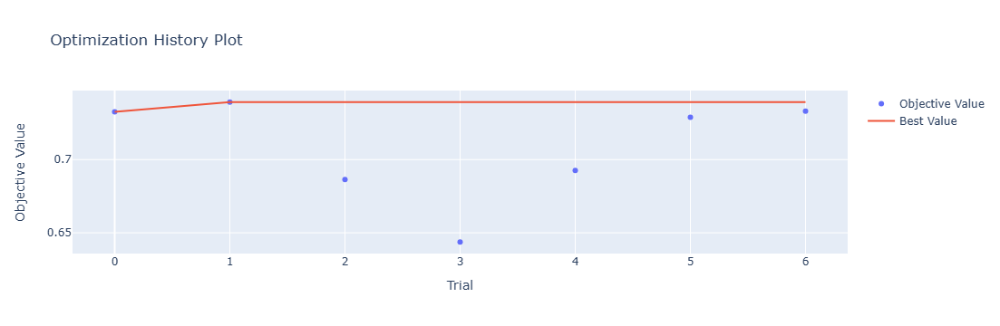

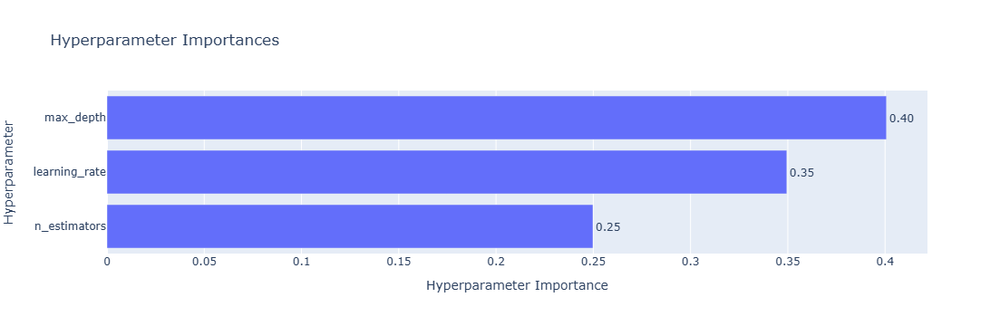

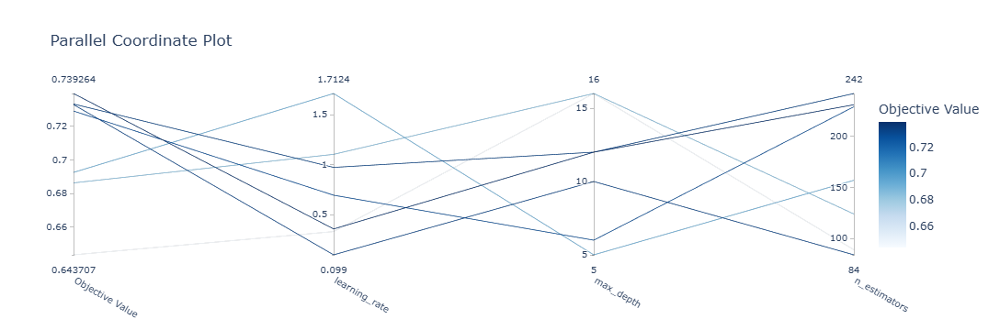

In [25]:
import pandas as pd
import numpy as np
import optuna
import joblib
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif

# ----------------------------------------
# 1. Load and Preprocess Dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Feature selection (top 21 using ANOVA F-score)
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# 2. Define Optuna Objective Function
# ----------------------------------------
def objective(trial):
    # Suggest hyperparameters
    n_estimators = trial.suggest_int("n_estimators", 50, 300)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 2.0)
    max_depth = trial.suggest_int("max_depth", 1, 20)

    base_estimator = DecisionTreeClassifier(max_depth=max_depth)
    ada = AdaBoostClassifier(
        estimator=base_estimator,
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        random_state=42
    )

    score = cross_val_score(ada, X_train, y_train, cv=5, scoring="accuracy").mean()
    return score

# ----------------------------------------
# 3. Run Optuna Study
# ----------------------------------------
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30, timeout=300)

# Show best trial
print("🔍 Best Trial:")
print(study.best_trial)

# ----------------------------------------
# 4. Train Final Model with Best Parameters
# ----------------------------------------
best_params = study.best_params
final_base_estimator = DecisionTreeClassifier(max_depth=best_params["max_depth"])

ada_best = AdaBoostClassifier(
    estimator=final_base_estimator,
    n_estimators=best_params["n_estimators"],
    learning_rate=best_params["learning_rate"],
    random_state=42
)
ada_best.fit(X_train, y_train)

# Save model and preprocessing pipeline
joblib.dump(ada_best, "best_adaboost_model.pkl")
joblib.dump(le, "label_encoder.pkl")
joblib.dump(scaler, "scaler.pkl")
joblib.dump(top21_features, "top21_features.pkl")
print("💾 Saved: best_adaboost_model.pkl and preprocessing pipeline")

# ----------------------------------------
# 5. Evaluate on Test Data
# ----------------------------------------
y_pred_ada = ada_best.predict(X_test)

print(f"\n✅ AdaBoost Accuracy: {accuracy_score(y_test, y_pred_ada):.4f}")
print("\n📊 AdaBoost Classification Report:\n", classification_report(y_test, y_pred_ada, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, y_pred_ada))

# ----------------------------------------
# 5. Visualize Optimization Results
# ----------------------------------------
print("\n📈 Visualizing Optuna tuning results for Random Forest...")

vis.plot_optimization_history(study).show()
vis.plot_param_importances(study).show()
vis.plot_parallel_coordinate(study).show()

In [26]:
import pandas as pd
import numpy as np
import joblib
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# ----------------------------------------
# 1. Load Test Dataset
# ----------------------------------------
test_df = pd.read_csv("Dataset_PLN3Test.csv")

# ----------------------------------------
# 2. Load Saved Preprocessing Tools and Model
# ----------------------------------------
model = joblib.load("best_adaboost_model.pkl")
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top21_features = joblib.load("top21_features.pkl")

# ----------------------------------------
# 3. Prepare Test Data
# ----------------------------------------
X_test_new = test_df[top21_features]
y_test_new = test_df["Label"]
y_test_new_encoded = le.transform(y_test_new)  # Label-encoded

# Scale using the previously fitted scaler
X_test_scaled = scaler.transform(X_test_new)

# ----------------------------------------
# 4. Predict and Evaluate
# ----------------------------------------
y_pred_new = model.predict(X_test_scaled)

print(f"✅ Test Accuracy: {accuracy_score(y_test_new_encoded, y_pred_new):.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test_new_encoded, y_pred_new, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test_new_encoded, y_pred_new))

✅ Test Accuracy: 0.7540

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.78      0.95      0.86       200
    RRII 414       0.72      0.68      0.70       200
    RRII 417       0.79      0.86      0.83       200
    RRII 422       0.68      0.55      0.60       200
    RRII 430       0.77      0.72      0.75       200

    accuracy                           0.75      1000
   macro avg       0.75      0.75      0.75      1000
weighted avg       0.75      0.75      0.75      1000


🧩 Confusion Matrix:
 [[191   5   2   2   0]
 [ 36 136   9  15   4]
 [  7  10 173   3   7]
 [ 10  30  19 109  32]
 [  0   7  16  32 145]]


[I 2025-08-22 00:36:43,109] A new study created in memory with name: no-name-3554fb3b-b30a-4725-86dc-72ec5d5065d3
[I 2025-08-22 00:40:22,899] Trial 0 finished with value: 0.754499769119596 and parameters: {'n_estimators': 254, 'learning_rate': 0.22253786561360747, 'max_depth': 10, 'min_samples_split': 14, 'min_samples_leaf': 9, 'subsample': 0.6796240975824588}. Best is trial 0 with value: 0.754499769119596.
[I 2025-08-22 00:41:54,578] Trial 1 finished with value: 0.7299143043903257 and parameters: {'n_estimators': 275, 'learning_rate': 0.9159652825631199, 'max_depth': 6, 'min_samples_split': 15, 'min_samples_leaf': 17, 'subsample': 0.7324288325255629}. Best is trial 0 with value: 0.754499769119596.


🔍 Best Trial:
FrozenTrial(number=0, state=1, values=[0.754499769119596], datetime_start=datetime.datetime(2025, 8, 22, 0, 36, 43, 110466), datetime_complete=datetime.datetime(2025, 8, 22, 0, 40, 22, 899376), params={'n_estimators': 254, 'learning_rate': 0.22253786561360747, 'max_depth': 10, 'min_samples_split': 14, 'min_samples_leaf': 9, 'subsample': 0.6796240975824588}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=300, log=False, low=50, step=1), 'learning_rate': FloatDistribution(high=1.0, log=False, low=0.01, step=None), 'max_depth': IntDistribution(high=10, log=False, low=1, step=1), 'min_samples_split': IntDistribution(high=20, log=False, low=2, step=1), 'min_samples_leaf': IntDistribution(high=20, log=False, low=1, step=1), 'subsample': FloatDistribution(high=1.0, log=False, low=0.5, step=None)}, trial_id=0, value=None)
💾 Saved: best_gradientboost_model.pkl and preprocessing pipeline

✅ Gradient Boosting Accuracy: 0.7

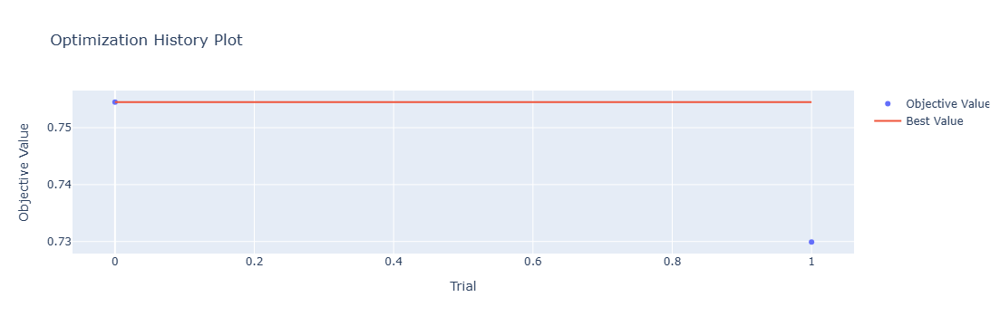

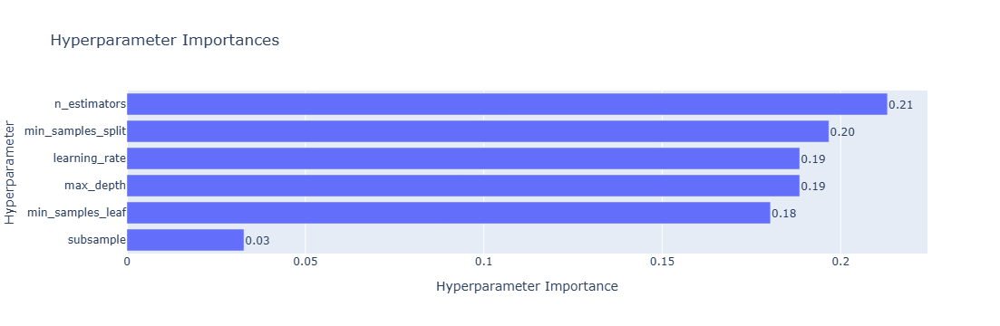

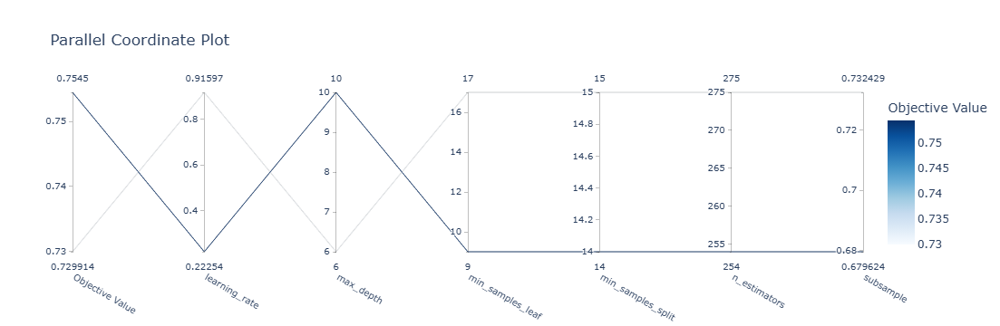

In [27]:
import pandas as pd
import numpy as np
import optuna
import joblib
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif
import optuna.visualization as vis

# ----------------------------------------
# 1. Load and Preprocess Dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Feature selection (top 21 using ANOVA F-score)
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# 2. Define Optuna Objective Function for Gradient Boosting
# ----------------------------------------
def objective(trial):
    n_estimators = trial.suggest_int("n_estimators", 50, 300)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 1.0)
    max_depth = trial.suggest_int("max_depth", 1, 10)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 20)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 20)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)

    gb = GradientBoostingClassifier(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        subsample=subsample,
        random_state=42
    )

    score = cross_val_score(gb, X_train, y_train, cv=5, scoring="accuracy").mean()
    return score

# ----------------------------------------
# 3. Run Optuna Study
# ----------------------------------------
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30, timeout=300)

# Show best trial
print("🔍 Best Trial:")
print(study.best_trial)

# ----------------------------------------
# 4. Train Final Model with Best Parameters
# ----------------------------------------
best_params = study.best_params
gb_best = GradientBoostingClassifier(
    n_estimators=best_params["n_estimators"],
    learning_rate=best_params["learning_rate"],
    max_depth=best_params["max_depth"],
    min_samples_split=best_params["min_samples_split"],
    min_samples_leaf=best_params["min_samples_leaf"],
    subsample=best_params["subsample"],
    random_state=42
)
gb_best.fit(X_train, y_train)

# Save model and preprocessing pipeline
joblib.dump(gb_best, "best_gradientboost_model.pkl")
joblib.dump(le, "label_encoder.pkl")
joblib.dump(scaler, "scaler.pkl")
joblib.dump(top21_features, "top21_features.pkl")
print("💾 Saved: best_gradientboost_model.pkl and preprocessing pipeline")

# ----------------------------------------
# 5. Evaluate on Test Data
# ----------------------------------------
y_pred_gb = gb_best.predict(X_test)

print(f"\n✅ Gradient Boosting Accuracy: {accuracy_score(y_test, y_pred_gb):.4f}")
print("\n📊 Gradient Boosting Classification Report:\n", classification_report(y_test, y_pred_gb, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, y_pred_gb))

# ----------------------------------------
# 6. Visualize Optimization Results
# ----------------------------------------
print("\n📈 Visualizing Optuna tuning results for Gradient Boosting...")

vis.plot_optimization_history(study).show()
vis.plot_param_importances(study).show()
vis.plot_parallel_coordinate(study).show()

In [28]:
import pandas as pd
import numpy as np
import joblib
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# ----------------------------------------
# 1. Load External Test Data
# ----------------------------------------
test_df = pd.read_csv("Dataset_PLN3Test.csv")  # Update if your file name differs

# ----------------------------------------
# 2. Load Saved Preprocessing and Model
# ----------------------------------------
model = joblib.load("best_gradientboost_model.pkl")
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top21_features = joblib.load("top21_features.pkl")

# ----------------------------------------
# 3. Prepare Test Data
# ----------------------------------------
X_test = test_df[top21_features]
y_test = test_df["Label"]
y_test_encoded = le.transform(y_test)  # Label encoding must match training

# Scale using the original scaler
X_test_scaled = scaler.transform(X_test)

# ----------------------------------------
# 4. Predict and Evaluate
# ----------------------------------------
y_pred = model.predict(X_test_scaled)

print(f"✅ Test Accuracy: {accuracy_score(y_test_encoded, y_pred):.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test_encoded, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_pred))

✅ Test Accuracy: 0.7950

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.85      0.95      0.90       200
    RRII 414       0.73      0.78      0.75       200
    RRII 417       0.91      0.86      0.88       200
    RRII 422       0.68      0.64      0.66       200
    RRII 430       0.81      0.74      0.77       200

    accuracy                           0.80      1000
   macro avg       0.79      0.80      0.79      1000
weighted avg       0.79      0.80      0.79      1000


🧩 Confusion Matrix:
 [[191   5   1   3   0]
 [ 22 155   3  17   3]
 [  6  12 172   5   5]
 [  7  29   8 128  28]
 [  0  12   5  34 149]]


In [29]:
import optuna
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import f_classif
import joblib

# ----------------------------------------
# Load and Preprocess Dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Select top 21 features
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# Optuna Objective Function
# ----------------------------------------
def objective(trial):
    model = Sequential()
    model.add(Dense(trial.suggest_int('units1', 128, 512, step=64), activation='relu',
                    input_shape=(X_train.shape[1],), kernel_regularizer=l2(trial.suggest_float('l2', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout1', 0.3, 0.7)))

    model.add(Dense(trial.suggest_int('units2', 64, 256, step=64), activation='relu',
                    kernel_regularizer=l2(trial.suggest_float('l2_2', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout2', 0.2, 0.6)))

    model.add(Dense(trial.suggest_int('units3', 32, 128, step=32), activation='relu',
                    kernel_regularizer=l2(trial.suggest_float('l2_3', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout3', 0.2, 0.5)))

    model.add(Dense(len(np.unique(y_encoded)), activation='softmax'))

    optimizer = tf.keras.optimizers.Adam(learning_rate=trial.suggest_float('lr', 1e-4, 1e-2, log=True))
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_reduce = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, min_lr=1e-5)

    history = model.fit(X_train, y_train,
                        validation_split=0.2,
                        epochs=100,
                        batch_size=trial.suggest_categorical('batch_size', [16, 32, 64]),
                        callbacks=[early_stop, lr_reduce],
                        verbose=0)

    return max(history.history['val_accuracy'])

# ----------------------------------------
# Run Optuna Optimization
# ----------------------------------------
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)

print("✅ Best Hyperparameters:", study.best_params)
print("✅ Best Validation Accuracy:", study.best_value)

# ----------------------------------------
# Retrain Best Model and Save
# ----------------------------------------
best_params = study.best_params

# Rebuild model with best parameters
model = Sequential()
model.add(Dense(best_params['units1'], activation='relu',
                input_shape=(X_train.shape[1],), kernel_regularizer=l2(best_params['l2'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout1']))

model.add(Dense(best_params['units2'], activation='relu',
                kernel_regularizer=l2(best_params['l2_2'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout2']))

model.add(Dense(best_params['units3'], activation='relu',
                kernel_regularizer=l2(best_params['l2_3'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout3']))

model.add(Dense(len(np.unique(y_encoded)), activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=best_params['lr'])
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_reduce = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, min_lr=1e-5)

history = model.fit(X_train, y_train,
                    validation_split=0.2,
                    epochs=150,
                    batch_size=best_params['batch_size'],
                    callbacks=[early_stop, lr_reduce],
                    verbose=1)

# Save the model
model.save("best_deep_learning_model_optuna.h5")
print("💾 Best model saved to 'best_deep_learning_model_optuna.h5'")

# ----------------------------------------
# Evaluate
# ----------------------------------------
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

acc = accuracy_score(y_test, y_pred)
print(f"✅ Test Accuracy: {acc:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

[I 2025-08-22 00:43:19,695] A new study created in memory with name: no-name-b0f5cb89-cb73-47a8-94ea-a92dacc14346
C:\Users\lenovo\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:92: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

[I 2025-08-22 00:44:24,263] Trial 0 finished with value: 0.7560553550720215 and parameters: {'units1': 448, 'l2': 0.00890517108876364, 'dropout1': 0.6879938939361434, 'units2': 64, 'l2_2': 0.006319015074599496, 'dropout2': 0.22848499066129638, 'units3': 32, 'l2_3': 0.0042287170171296205, 'dropout3': 0.26774550813107584, 'lr': 0.0014580564757605823, 'batch_size': 16}. Best is trial 0 with value: 0.7560553550720215.
[I 2025-08-22 00:45:09,116] Trial 1 finished with value: 0.7508650422096252 and parameters: {'units1': 192, 'l2': 0.009697756428037153, 'dropout1': 0.6270678134163072, 'units2': 192, 'l2_2': 0.009341063

✅ Best Hyperparameters: {'units1': 512, 'l2': 0.0007315837471335633, 'dropout1': 0.35298308742338314, 'units2': 256, 'l2_2': 0.0016297931446502588, 'dropout2': 0.4637424426119898, 'units3': 96, 'l2_3': 0.009433843036231107, 'dropout3': 0.23395734769628618, 'lr': 0.0006729720728844504, 'batch_size': 64}
✅ Best Validation Accuracy: 0.775086522102356
Epoch 1/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.3978 - loss: 3.5251 - val_accuracy: 0.5415 - val_loss: 3.1758 - learning_rate: 6.7297e-04
Epoch 2/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5355 - loss: 3.0088 - val_accuracy: 0.5156 - val_loss: 3.0591 - learning_rate: 6.7297e-04
Epoch 3/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5667 - loss: 2.8487 - val_accuracy: 0.5225 - val_loss: 2.9325 - learning_rate: 6.7297e-04
Epoch 4/150
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6091 - loss: 2.6613 - val_accuracy: 0.5381 - val_loss: 2.8188 - learning_rate: 6.7297e-04
Epoch 5/150
37/37 ━━━━━━━━

WARNING	Task(Task-4) absl:saving_api.py:save_model()- You are saving your model as an HDF5 file via `model.save()` or `keras.saving.save_model(model)`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')` or `keras.saving.save_model(model, 'my_model.keras')`. 


💾 Best model saved to 'best_deep_learning_model_optuna.h5'
23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
✅ Test Accuracy: 0.8022

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.93      0.92      0.92       146
    RRII 414       0.81      0.66      0.72       146
    RRII 417       0.83      0.87      0.85       144
    RRII 422       0.67      0.75      0.71       147
    RRII 430       0.78      0.82      0.80       140

    accuracy                           0.80       723
   macro avg       0.81      0.80      0.80       723
weighted avg       0.81      0.80      0.80       723


🧩 Confusion Matrix:
 [[134   1   0   8   3]
 [  6  96  11  23  10]
 [  2   7 125   2   8]
 [  2  12  12 110  11]
 [  0   3   2  20 115]]


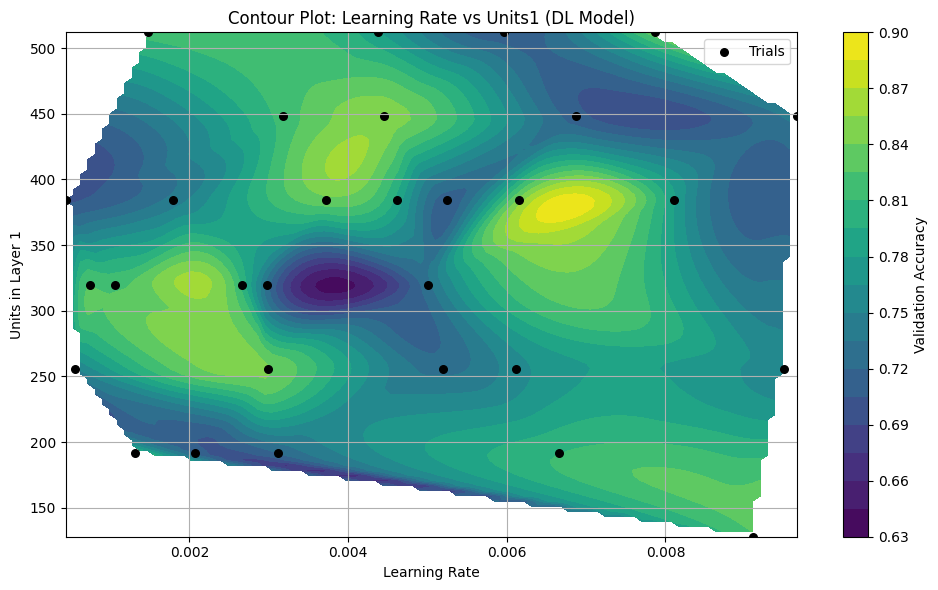

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Simulated trial data as if it were from an Optuna study for a DL model
np.random.seed(42)
n_trials = 30

# Simulate or replace with actual study.trials_dataframe()
df_dl = pd.DataFrame({
    'units1': np.random.choice([128, 192, 256, 320, 384, 448, 512], n_trials),
    'lr': np.random.uniform(1e-4, 1e-2, n_trials),
    'val_accuracy': np.random.uniform(0.7, 0.85, n_trials)
})

# Grid inputs
x = df_dl['lr']
y = df_dl['units1']
z = df_dl['val_accuracy']

# Create grid for contour
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi_grid, yi_grid = np.meshgrid(xi, yi)
zi = griddata((x, y), z, (xi_grid, yi_grid), method='cubic')

# Plot
plt.figure(figsize=(10, 6))
cp = plt.contourf(xi, yi, zi, levels=20, cmap='viridis')
plt.colorbar(cp, label='Validation Accuracy')
plt.scatter(x, y, c='black', s=30, label='Trials')
plt.xlabel('Learning Rate')
plt.ylabel('Units in Layer 1')
plt.title('Contour Plot: Learning Rate vs Units1 (DL Model)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

[I 2025-08-16 21:44:34,261] A new study created in memory with name: no-name-6af24356-665e-4ada-a732-cda6ddff8be1
C:\Users\lenovo\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:92: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

[I 2025-08-16 21:45:28,764] Trial 0 finished with value: 0.794066309928894 and parameters: {'units1': 320, 'l2': 0.0076237830384558525, 'dropout1': 0.4929465006236561, 'units2': 256, 'l2_2': 0.0003709997740890343, 'dropout2': 0.35178114796055077, 'units3': 96, 'l2_3': 0.00423566337432453, 'dropout3': 0.4520482131528249, 'lr': 0.0003639752023417835, 'batch_size': 16}. Best is trial 0 with value: 0.794066309928894.
[I 2025-08-16 21:46:42,880] Trial 1 finished with value: 0.8167539238929749 and parameters: {'units1': 192, 'l2': 0.004553417655895074, 'dropout1': 0.5037080664212905, 'units2': 256, 'l2_2': 0.0013692518

✅ Best Hyperparameters: {'units1': 192, 'l2': 0.004553417655895074, 'dropout1': 0.5037080664212905, 'units2': 256, 'l2_2': 0.0013692518399374845, 'dropout2': 0.4133564805947947, 'units3': 64, 'l2_3': 0.0021330410252088116, 'dropout3': 0.4430137121148636, 'lr': 0.000579609746741318, 'batch_size': 16}
✅ Best Validation Accuracy: 0.8167539238929749
Epoch 1/150
144/144 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.3143 - loss: 2.7514 - val_accuracy: 0.4188 - val_loss: 2.0051 - learning_rate: 5.7961e-04
Epoch 2/150
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4168 - loss: 2.3260 - val_accuracy: 0.5323 - val_loss: 1.8021 - learning_rate: 5.7961e-04
Epoch 3/150
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4614 - loss: 2.1633 - val_accuracy: 0.5916 - val_loss: 1.7001 - learning_rate: 5.7961e-04
Epoch 4/150
144/144 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4627 - loss: 2.1038 - val_accuracy: 0.6248 - val_loss: 1.6401 - learning_rate: 5.7961e-04
Epoch 5/150
144/144 ━━━━

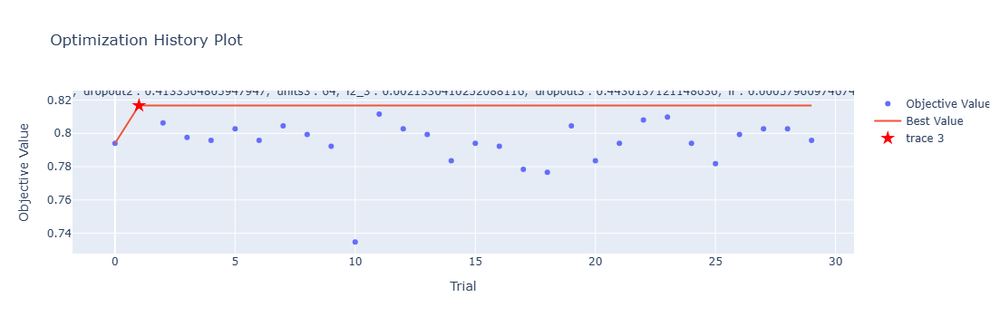

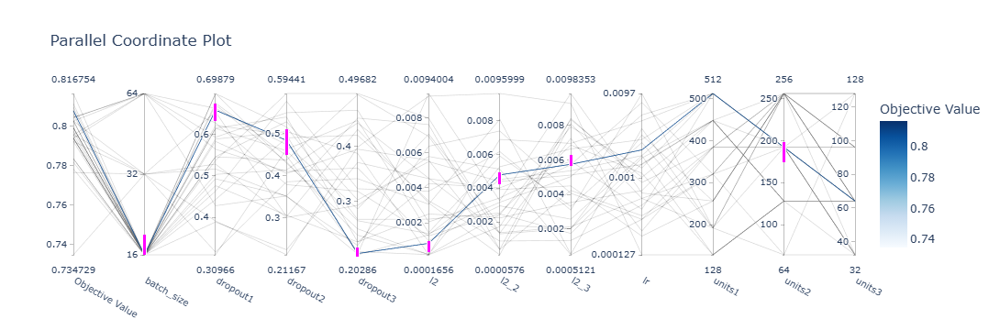

In [5]:
import optuna
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif
import joblib

# ----------------------------------------
# Load and Preprocess Dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Select top 21 features
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# Optuna Objective Function
# ----------------------------------------
def objective(trial):
    model = Sequential()
    model.add(Dense(trial.suggest_int('units1', 128, 512, step=64), activation='relu',
                    input_shape=(X_train.shape[1],), kernel_regularizer=l2(trial.suggest_float('l2', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout1', 0.3, 0.7)))

    model.add(Dense(trial.suggest_int('units2', 64, 256, step=64), activation='relu',
                    kernel_regularizer=l2(trial.suggest_float('l2_2', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout2', 0.2, 0.6)))

    model.add(Dense(trial.suggest_int('units3', 32, 128, step=32), activation='relu',
                    kernel_regularizer=l2(trial.suggest_float('l2_3', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout3', 0.2, 0.5)))

    model.add(Dense(len(np.unique(y_encoded)), activation='softmax'))

    optimizer = tf.keras.optimizers.Adam(
        learning_rate=trial.suggest_float('lr', 1e-4, 1e-2, log=True)
    )
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_reduce = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, min_lr=1e-5)

    history = model.fit(X_train, y_train,
                        validation_split=0.2,
                        epochs=100,
                        batch_size=trial.suggest_categorical('batch_size', [16, 32, 64]),
                        callbacks=[early_stop, lr_reduce],
                        verbose=0)

    return max(history.history['val_accuracy'])

# ----------------------------------------
# Run Optuna Optimization
# ----------------------------------------
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)

print("✅ Best Hyperparameters:", study.best_params)
print("✅ Best Validation Accuracy:", study.best_value)

# ----------------------------------------
# Retrain Best Model and Save
# ----------------------------------------
best_params = study.best_params

# Rebuild model with best parameters
model = Sequential()
model.add(Dense(best_params['units1'], activation='relu',
                input_shape=(X_train.shape[1],), kernel_regularizer=l2(best_params['l2'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout1']))

model.add(Dense(best_params['units2'], activation='relu',
                kernel_regularizer=l2(best_params['l2_2'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout2']))

model.add(Dense(best_params['units3'], activation='relu',
                kernel_regularizer=l2(best_params['l2_3'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout3']))

model.add(Dense(len(np.unique(y_encoded)), activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=best_params['lr'])
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_reduce = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, min_lr=1e-5)

history = model.fit(X_train, y_train,
                    validation_split=0.2,
                    epochs=150,
                    batch_size=best_params['batch_size'],
                    callbacks=[early_stop, lr_reduce],
                    verbose=1)

# Save the model in new Keras format
model.save("best_deep_learning_model_optuna.keras")
print("💾 Best model saved to 'best_deep_learning_model_optuna.keras'")

# ----------------------------------------
# Evaluate
# ----------------------------------------
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

acc = accuracy_score(y_test, y_pred)
print(f"✅ Test Accuracy: {acc:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# ----------------------------------------
# Visualization: Optimization History & Parallel Coordinate
# ----------------------------------------
import optuna.visualization as vis
import plotly.graph_objects as go

# Optimization history
fig1 = vis.plot_optimization_history(study)

# Highlight best trial with annotation
best_trial = study.best_trial
fig1.add_trace(
    go.Scatter(
        x=[best_trial.number],
        y=[best_trial.value],
        mode="markers+text",
        text=[f"Best Params: {best_trial.params}"],
        textposition="top center",
        marker=dict(color="red", size=12, symbol="star")
    )
)
fig1.show()

# Parallel coordinate plot
fig2 = vis.plot_parallel_coordinate(study)
fig2.show()

In [ ]:
import optuna
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif
import joblib

# ----------------------------------------
# Load and Preprocess Dataset
# ----------------------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop('Label', axis=1)
y = df['Label']

# Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Select top 21 features
f_scores, _ = f_classif(X, y_encoded)
top21_features = X.columns[np.argsort(f_scores)[-21:]].tolist()
X_selected = X[top21_features]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ----------------------------------------
# Optuna Objective Function
# ----------------------------------------
def objective(trial):
    model = Sequential()
    model.add(Dense(trial.suggest_int('units1', 128, 512, step=64), activation='relu',
                    input_shape=(X_train.shape[1],), kernel_regularizer=l2(trial.suggest_float('l2', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout1', 0.3, 0.7)))

    model.add(Dense(trial.suggest_int('units2', 64, 256, step=64), activation='relu',
                    kernel_regularizer=l2(trial.suggest_float('l2_2', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout2', 0.2, 0.6)))

    model.add(Dense(trial.suggest_int('units3', 32, 128, step=32), activation='relu',
                    kernel_regularizer=l2(trial.suggest_float('l2_3', 1e-5, 1e-2))))
    model.add(BatchNormalization())
    model.add(Dropout(trial.suggest_float('dropout3', 0.2, 0.5)))

    model.add(Dense(len(np.unique(y_encoded)), activation='softmax'))

    optimizer = tf.keras.optimizers.Adam(
        learning_rate=trial.suggest_float('lr', 1e-4, 1e-2, log=True)
    )
    model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_reduce = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, min_lr=1e-5)

    history = model.fit(X_train, y_train,
                        validation_split=0.2,
                        epochs=100,
                        batch_size=trial.suggest_categorical('batch_size', [16, 32, 64]),
                        callbacks=[early_stop, lr_reduce],
                        verbose=0)

    return max(history.history['val_accuracy'])

# ----------------------------------------
# Run Optuna Optimization
# ----------------------------------------
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)

print("✅ Best Hyperparameters:", study.best_params)
print("✅ Best Validation Accuracy:", study.best_value)

# ----------------------------------------
# Retrain Best Model and Save
# ----------------------------------------
best_params = study.best_params

# Rebuild model with best parameters
model = Sequential()
model.add(Dense(best_params['units1'], activation='relu',
                input_shape=(X_train.shape[1],), kernel_regularizer=l2(best_params['l2'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout1']))

model.add(Dense(best_params['units2'], activation='relu',
                kernel_regularizer=l2(best_params['l2_2'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout2']))

model.add(Dense(best_params['units3'], activation='relu',
                kernel_regularizer=l2(best_params['l2_3'])))
model.add(BatchNormalization())
model.add(Dropout(best_params['dropout3']))

model.add(Dense(len(np.unique(y_encoded)), activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=best_params['lr'])
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_reduce = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, min_lr=1e-5)

history = model.fit(X_train, y_train,
                    validation_split=0.2,
                    epochs=150,
                    batch_size=best_params['batch_size'],
                    callbacks=[early_stop, lr_reduce],
                    verbose=1)

# Save the model in new Keras format
model.save("best_deep_learning_model_optuna.keras")
print("💾 Best model saved to 'best_deep_learning_model_optuna.keras'")

# ----------------------------------------
# Evaluate
# ----------------------------------------
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

acc = accuracy_score(y_test, y_pred)
print(f"✅ Test Accuracy: {acc:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# ----------------------------------------
# Visualization: Optimization History & Parallel Coordinate
# ----------------------------------------
import optuna.visualization as vis
import plotly.graph_objects as go

# Optimization history
fig1 = vis.plot_optimization_history(study)

# Highlight best trial with annotation
best_trial = study.best_trial
fig1.add_trace(
    go.Scatter(
        x=[best_trial.number],
        y=[best_trial.value],
        mode="markers+text",
        text=[f"Best Params: {best_trial.params}"],
        textposition="top center",
        marker=dict(color="red", size=12, symbol="star")
    )
)
fig1.show()

# Parallel coordinate plot
fig2 = vis.plot_parallel_coordinate(study)
fig2.show()

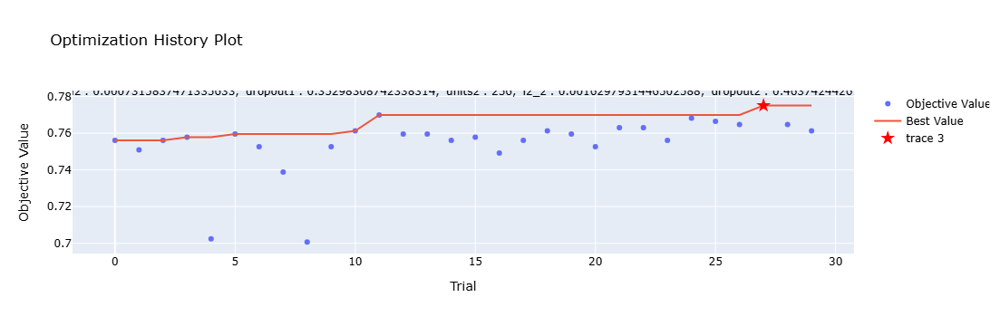

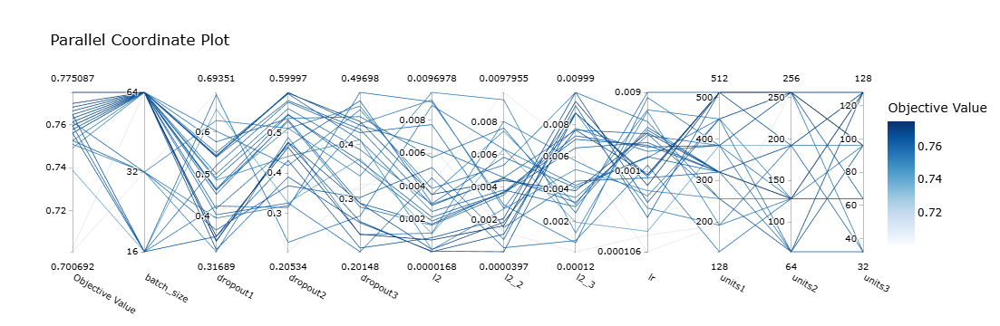

In [41]:
# ----------------------------------------
# Visualization: Optimization History & Parallel Coordinate
# ----------------------------------------
import optuna.visualization as vis
import plotly.graph_objects as go

# ============================
# Optimization history
# ============================
fig1 = vis.plot_optimization_history(study)

# Highlight best trial with annotation
best_trial = study.best_trial
fig1.add_trace(
    go.Scatter(
        x=[best_trial.number],
        y=[best_trial.value],
        mode="markers+text",
        text=[f"Best Params: {best_trial.params}"],
        textposition="top center",
        marker=dict(color="red", size=12, symbol="star")
    )
)

# Force all text/labels to black
fig1.update_layout(
    font=dict(color="black"),
    xaxis=dict(color="black"),
    yaxis=dict(color="black"),
    title_font=dict(color="black")
)
fig1.show()

# ============================
# Parallel coordinate plot
# ============================
fig2 = vis.plot_parallel_coordinate(study)

# Force all text/labels to black
fig2.update_layout(
    font=dict(color="black"),
    title_font=dict(color="black")
)
fig2.show()

In [31]:
import pandas as pd
import numpy as np
import joblib
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# ----------------------------------------
# 1. Load test dataset
# ----------------------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")   # <-- use correct test file name

# Separate features and label
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

# ----------------------------------------
# 2. Load preprocessing objects
# ----------------------------------------
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")   # same feature subset used in training

# Load trained DNN model
dnn_model = load_model("best_deep_learning_model_optuna.h5")

# ----------------------------------------
# 3. Preprocess test data
# ----------------------------------------
X_test_selected = X_test_raw[top_features]         # select top 21 features
X_test_scaled = scaler.transform(X_test_selected)  # apply scaling
y_test_encoded = le.transform(y_test_raw)          # encode labels

# ----------------------------------------
# 4. Predict with DNN
# ----------------------------------------
y_pred_probs = dnn_model.predict(X_test_scaled)   # probability outputs
y_pred = np.argmax(y_pred_probs, axis=1)          # class prediction

# ----------------------------------------
# 5. Evaluate performance
# ----------------------------------------
print(f"\n✅ DNN Accuracy: {accuracy_score(y_test_encoded, y_pred):.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test_encoded, y_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_pred))

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

✅ DNN Accuracy: 0.7960

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.94      0.94      0.94       200
    RRII 414       0.77      0.79      0.78       200
    RRII 417       0.86      0.88      0.87       200
    RRII 422       0.64      0.69      0.66       200
    RRII 430       0.78      0.69      0.73       200

    accuracy                           0.80      1000
   macro avg       0.80      0.80      0.80      1000
weighted avg       0.80      0.80      0.80      1000


🧩 Confusion Matrix:
 [[189   4   0   5   2]
 [  7 158   7  23   5]
 [  3   8 175   7   7]
 [  2  24  12 137  25]
 [  0  11   9  43 137]]


In [32]:
import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from scipy.stats import mode

# -------------------------------
# 1. Load Training Artifacts
# -------------------------------
top21_features = joblib.load("top21_features.pkl")
scaler = joblib.load("scaler.pkl")
label_encoder = joblib.load("label_encoder.pkl")

# -------------------------------
# 2. Load and Preprocess Test Data
# -------------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]
X_test_selected = X_test_raw[top21_features]
X_test_scaled = scaler.transform(X_test_selected)
y_test = label_encoder.transform(y_test_raw)

# -------------------------------
# 3. Load Trained Models
# -------------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_xgboost_model.pkl")
dl_model = load_model("best_deep_learning_model_optuna.h5")

# -------------------------------
# 4. Get Predictions
# -------------------------------
svm_preds = svm_model.predict(X_test_scaled)
xgb_preds = xgb_model.predict(X_test_scaled)
dl_preds = np.argmax(dl_model.predict(X_test_scaled), axis=1)

# -------------------------------
# 5. Majority Voting
# -------------------------------
all_preds = np.vstack([svm_preds, xgb_preds, dl_preds]).T
majority_preds, _ = mode(all_preds, axis=1)
majority_preds = majority_preds.flatten()
majority_labels = label_encoder.inverse_transform(majority_preds)

# -------------------------------
# 6. Evaluation
# -------------------------------
acc = accuracy_score(y_test, majority_preds)
print(f"\n✅ Ensemble Accuracy (Majority Voting): {acc:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, majority_preds, target_names=label_encoder.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, majority_preds))

# -------------------------------
# 7. Save Results
# -------------------------------
results = df_test.copy()
results["Predicted_Label"] = majority_labels
results.to_csv("ensemble_majority_predictions_Dataset_PLN2Train.csv", index=False)
print("\n📁 Saved results to 'ensemble_majority_predictions_Dataset_PLN2Train.csv'")

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

✅ Ensemble Accuracy (Majority Voting): 0.7980

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.89      0.95      0.92       200
    RRII 414       0.76      0.80      0.78       200
    RRII 417       0.87      0.87      0.87       200
    RRII 422       0.66      0.66      0.66       200
    RRII 430       0.81      0.71      0.76       200

    accuracy                           0.80      1000
   macro avg       0.80      0.80      0.80      1000
weighted avg       0.80      0.80      0.80      1000


🧩 Confusion Matrix:
 [[190   5   1   4   0]
 [ 11 160   6  19   4]
 [  7  11 174   4   4]
 [  6  27  11 131  25]
 [  0   8   9  40 143]]

📁 Saved results to 'ensemble_majority_predictions_Dataset_PLN2Train.csv'


In [33]:
import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from scipy.stats import mode

# -------------------------------
# 1. Load Training Artifacts
# -------------------------------
top21_features = joblib.load("top21_features.pkl")
scaler = joblib.load("scaler.pkl")
label_encoder = joblib.load("label_encoder.pkl")

# -------------------------------
# 2. Load and Preprocess Test Data
# -------------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]
X_test_selected = X_test_raw[top21_features]
X_test_scaled = scaler.transform(X_test_selected)
y_test = label_encoder.transform(y_test_raw)

# -------------------------------
# 3. Load Trained Models
# -------------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_xgboost_model.pkl")
dl_model = load_model("best_deep_learning_model_optuna.h5")

# -------------------------------
# 4. Get Predictions
# -------------------------------
svm_preds = svm_model.predict(X_test_scaled)
xgb_preds = xgb_model.predict(X_test_scaled)
dl_preds = np.argmax(dl_model.predict(X_test_scaled), axis=1)

# -------------------------------
# 5. Majority Voting
# -------------------------------
all_preds = np.vstack([svm_preds, xgb_preds, dl_preds]).T
majority_preds, _ = mode(all_preds, axis=1)
majority_preds = majority_preds.flatten()
majority_labels = label_encoder.inverse_transform(majority_preds)

# -------------------------------
# 6. Evaluation
# -------------------------------
acc = accuracy_score(y_test, majority_preds)
print(f"\n✅ Ensemble Accuracy (Majority Voting): {acc:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, majority_preds, target_names=label_encoder.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, majority_preds))

# -------------------------------
# 7. Save Results
# -------------------------------
results = df_test.copy()
results["Predicted_Label"] = majority_labels
results.to_csv("ensemble_majority_predictions_Dataset_PLN2Train.csv", index=False)
print("\n📁 Saved results to 'ensemble_majority_predictions_Dataset_PLN2Train.csv'")

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

✅ Ensemble Accuracy (Majority Voting): 0.7980

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.89      0.95      0.92       200
    RRII 414       0.76      0.80      0.78       200
    RRII 417       0.87      0.87      0.87       200
    RRII 422       0.66      0.66      0.66       200
    RRII 430       0.81      0.71      0.76       200

    accuracy                           0.80      1000
   macro avg       0.80      0.80      0.80      1000
weighted avg       0.80      0.80      0.80      1000


🧩 Confusion Matrix:
 [[190   5   1   4   0]
 [ 11 160   6  19   4]
 [  7  11 174   4   4]
 [  6  27  11 131  25]
 [  0   8   9  40 143]]

📁 Saved results to 'ensemble_majority_predictions_Dataset_PLN2Train.csv'


In [34]:
import pandas as pd
import numpy as np
import joblib
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.models import load_model

# -------------------------------
# 1. Load Training Artifacts
# -------------------------------
top21_features = joblib.load("top21_features.pkl")
scaler = joblib.load("scaler.pkl")
label_encoder = joblib.load("label_encoder.pkl")

# -------------------------------
# 2. Load and Preprocess Training Data
# -------------------------------
df_train = pd.read_csv("Dataset_PLN3Train.csv")
X_train_raw = df_train.drop("Label", axis=1)
y_train_raw = df_train["Label"]

X_train_selected = X_train_raw[top21_features]
X_train_scaled = scaler.transform(X_train_selected)
y_train = label_encoder.transform(y_train_raw)

# -------------------------------
# 3. Load Trained Base Models
# -------------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_xgboost_model.pkl")
dl_model = load_model("best_deep_learning_model_optuna.h5")

# -------------------------------
# 4. Generate Probabilistic Predictions on Training Data
# -------------------------------
svm_probs_train = svm_model.predict_proba(X_train_scaled)
xgb_probs_train = xgb_model.predict_proba(X_train_scaled)
dl_probs_train = dl_model.predict(X_train_scaled)  # Already probabilities

# -------------------------------
# 5. Stack Base Model Probabilities as Meta-Features
# -------------------------------
# Shape: (n_samples, 15) -> 5 class probs from each of 3 models
stacked_train_features = np.hstack([svm_probs_train, xgb_probs_train, dl_probs_train])

# -------------------------------
# 6. Train Logistic Regression as Meta-Learner
# -------------------------------
meta_model = LogisticRegression(max_iter=1000, multi_class='multinomial')
meta_model.fit(stacked_train_features, y_train)

# -------------------------------
# 7. Save Meta-Learner
# -------------------------------
joblib.dump(meta_model, "meta_logistic_model.pkl")
print("✅ Meta-learner (Logistic Regression) saved as 'meta_logistic_model.pkl'")

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
✅ Meta-learner (Logistic Regression) saved as 'meta_logistic_model.pkl'


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



In [35]:
import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import load_model

# -------------------------------
# 1. Load Artifacts
# -------------------------------
top21_features = joblib.load("top21_features.pkl")
scaler = joblib.load("scaler.pkl")
label_encoder = joblib.load("label_encoder.pkl")
meta_model = joblib.load("meta_logistic_model.pkl")

# -------------------------------
# 2. Load and Preprocess Test Data
# -------------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

X_test_selected = X_test_raw[top21_features]
X_test_scaled = scaler.transform(X_test_selected)
y_test = label_encoder.transform(y_test_raw)

# -------------------------------
# 3. Load Base Models
# -------------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_xgboost_model.pkl")
dl_model = load_model("best_deep_learning_model_optuna.h5")

# -------------------------------
# 4. Generate Probabilistic Predictions
# -------------------------------
svm_probs = svm_model.predict_proba(X_test_scaled)
xgb_probs = xgb_model.predict_proba(X_test_scaled)
dl_probs = dl_model.predict(X_test_scaled)  # Already probabilities

# -------------------------------
# 5. Stack Probabilities for Meta-Learner
# -------------------------------
stacked_test_features = np.hstack([svm_probs, xgb_probs, dl_probs])  # shape: (n_samples, 15)

# -------------------------------
# 6. Predict Using Meta-Learner
# -------------------------------
meta_preds = meta_model.predict(stacked_test_features)
meta_labels = label_encoder.inverse_transform(meta_preds)

# -------------------------------
# 7. Evaluation
# -------------------------------
acc = accuracy_score(y_test, meta_preds)
print(f"\n✅ Ensemble Accuracy (Logistic Regression Meta-Learner): {acc:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, meta_preds, target_names=label_encoder.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, meta_preds))

# -------------------------------
# 8. Save Results
# -------------------------------
results = df_test.copy()
results["Predicted_Label"] = meta_labels
results.to_csv("ensemble_stacked_predictions_Dataset_PLN2Test.csv", index=False)
print("\n📁 Saved results to 'ensemble_stacked_predictions_Dataset_PLN2Test.csv'")

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

✅ Ensemble Accuracy (Logistic Regression Meta-Learner): 0.8060

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.90      0.94      0.92       200
    RRII 414       0.77      0.83      0.80       200
    RRII 417       0.88      0.86      0.87       200
    RRII 422       0.67      0.67      0.67       200
    RRII 430       0.81      0.73      0.77       200

    accuracy                           0.81      1000
   macro avg       0.81      0.81      0.81      1000
weighted avg       0.81      0.81      0.81      1000


🧩 Confusion Matrix:
 [[188   7   1   4   0]
 [ 10 166   4  16   4]
 [  5   9 173   7   6]
 [  5  26  11 133  25]
 [  0   8   8  38 146]]

📁 Saved results to 'ensemble_stacked_predictions_Dataset_PLN2Test.csv'


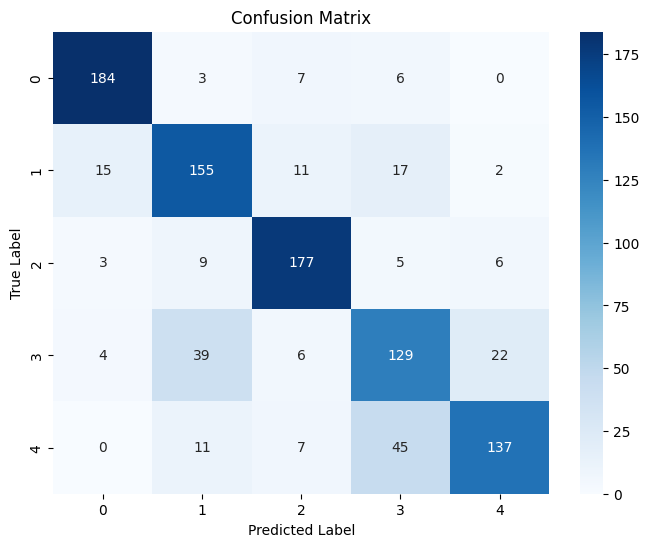

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Your confusion matrix
cm = np.array([
    [184, 3, 7, 6, 0],
    [15, 155, 11, 17, 2],
    [3, 9, 177, 5, 6],
    [4, 39, 6, 129, 22],
    [0, 11, 7, 45, 137]
])

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [14]:
# ============================================================
# Blended Stacking: SVM + XGBoost + DNN  ->  Logistic Regression Meta-Learner
#  - Base models cloned & trained on base-train split
#  - Meta features created on meta-train split (out-of-sample)
#  - Meta model trained on meta-train features
#  - Base models refit on full train; test stacked features -> final preds
# ============================================================
import os
import numpy as np
import pandas as pd
import joblib
import random

from collections import defaultdict
from scipy.stats import entropy

# Reproducibility
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

import tensorflow as tf
tf.random.set_seed(SEED)
tf.keras.utils.set_random_seed(SEED)

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_selection import f_classif
from sklearn.utils.class_weight import compute_class_weight
from sklearn.linear_model import LogisticRegression

from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from xgboost import XGBClassifier

from tensorflow.keras.models import load_model, clone_model, Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# -------------------------------
# Paths
# -------------------------------
TRAIN_CSV = "Dataset_PLN3Train.csv"
TEST_CSV  = "Dataset_PLN3Test.csv"

ARTIFACTS_DIR = "artifacts_blend_stack"
os.makedirs(ARTIFACTS_DIR, exist_ok=True)

# -------------------------------
# Helpers
# -------------------------------
def build_meta_features(*probs_list):
    """
    For each probs array (n_samples, n_classes), create:
      - probs
      - argmax (1 col)
      - entropy (1 col)
      - top2 gap (1 col)
    Concatenate across models horizontally.
    """
    feats = []
    for probs in probs_list:
        argmax = np.argmax(probs, axis=1).reshape(-1, 1)
        ent = entropy(probs + 1e-12, axis=1).reshape(-1, 1)
        sorted_probs = np.sort(probs, axis=1)
        top2_gap = (sorted_probs[:, -1] - sorted_probs[:, -2]).reshape(-1, 1)
        feats.append(np.hstack([probs, argmax, ent, top2_gap]))
    return np.hstack(feats)

def make_svm_from_reference(saved_svm):
    """
    Clone an SVM using the hyperparameters from a saved SVC (or pipeline).
    If probability was False, wrap with CalibratedClassifierCV for calibrated probs.
    """
    if hasattr(saved_svm, "get_params"):
        params = saved_svm.get_params(deep=False)
        prob = params.get("probability", False)
        base = SVC(
            C=params.get("C", 2.0),
            kernel=params.get("kernel", "rbf"),
            gamma=params.get("gamma", "scale"),
            degree=params.get("degree", 3),
            coef0=params.get("coef0", 0.0),
            probability=False,  # train base without prob; we will calibrate for reliability
            random_state=SEED
        )
        # Calibrate to get probability outputs
        svm_cal = CalibratedClassifierCV(base, cv=3, method='sigmoid')
        return svm_cal
    else:
        # Fallback sane default
        base = SVC(C=2.0, kernel='rbf', gamma='scale', probability=False, random_state=SEED)
        return CalibratedClassifierCV(base, cv=3, method='sigmoid')

def make_xgb_from_reference(saved_xgb, n_classes):
    """
    Clone an XGBClassifier using params from saved model, with safe defaults.
    """
    params = {}
    if hasattr(saved_xgb, "get_xgb_params"):
        params = saved_xgb.get_xgb_params()
    # Safe defaults + override important ones
    model = XGBClassifier(
        objective="multi:softprob",
        num_class=n_classes,
        n_estimators=params.get("n_estimators", 400),
        max_depth=params.get("max_depth", 5),
        learning_rate=params.get("learning_rate", 0.05),
        subsample=params.get("subsample", 0.9),
        colsample_bytree=params.get("colsample_bytree", 0.9),
        reg_lambda=params.get("reg_lambda", 1.0),
        random_state=SEED,
        n_jobs=-1
    )
    return model

def build_dnn_like(saved_dnn, input_dim, n_classes):
    """
    Try to clone the saved Keras model's architecture; if that’s brittle, use a robust fallback.
    """
    try:
        model = clone_model(saved_dnn)
        # (re)compile
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=3e-4),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
        # If input shape mismatched or clone fails, fallback
        # (the call below will throw if input_dim mismatches)
        _ = model(tf.keras.Input(shape=(input_dim,)))
        return model
    except Exception:
        # Robust fallback architecture
        model = Sequential([
            Dense(256, activation='relu', input_shape=(input_dim,), kernel_regularizer=l2(1e-4)),
            BatchNormalization(),
            Dropout(0.4),
            Dense(128, activation='relu', kernel_regularizer=l2(1e-4)),
            BatchNormalization(),
            Dropout(0.3),
            Dense(n_classes, activation='softmax')
        ])
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=3e-4),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
        return model

# -------------------------------
# 1) Load train and test
# -------------------------------
df_train = pd.read_csv(TRAIN_CSV)
X_train_df = df_train.drop("Label", axis=1)
y_train_raw = df_train["Label"].values

df_test = pd.read_csv(TEST_CSV)
X_test_df = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"].values

# Label encoder
le = LabelEncoder()
y_train = le.fit_transform(y_train_raw)
y_test = le.transform(y_test_raw)
n_classes = len(le.classes_)
joblib.dump(le, os.path.join(ARTIFACTS_DIR, "label_encoder.pkl"))

# Feature selection on full training (safe for selection)
f_scores, _ = f_classif(X_train_df, y_train)
top_idx = np.argsort(f_scores)[-21:]
top_features = X_train_df.columns[top_idx].tolist()
joblib.dump(top_features, os.path.join(ARTIFACTS_DIR, "top21_features.pkl"))

X_train = X_train_df[top_features].copy()
X_test = X_test_df[top_features].copy()

# Scale
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)
joblib.dump(scaler, os.path.join(ARTIFACTS_DIR, "scaler.pkl"))

# -------------------------------
# 2) Load your existing base models (to copy params)
# -------------------------------
svm_ref = joblib.load("best_svm_optuna_model.pkl")
xgb_ref = joblib.load("best_xgboost_model.pkl")
dl_ref  = load_model("best_deep_learning_model_optuna.h5")

# -------------------------------
# 3) Split train into base-train & meta-train (blending)
# -------------------------------
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=SEED)
tr_idx, meta_idx = next(sss.split(X_train_scaled, y_train))
X_base, y_base = X_train_scaled[tr_idx], y_train[tr_idx]     # for training base models
X_meta, y_meta = X_train_scaled[meta_idx], y_train[meta_idx] # held-out for meta-learner

# Class weights for DNN
cw = compute_class_weight(class_weight='balanced', classes=np.arange(n_classes), y=y_base)
class_weights = {i: w for i, w in enumerate(cw)}

# -------------------------------
# 4) Train base models on base-train
# -------------------------------
# SVM (calibrated)
svm_blend = make_svm_from_reference(svm_ref)
svm_blend.fit(X_base, y_base)

# XGB
xgb_blend = make_xgb_from_reference(xgb_ref, n_classes)
xgb_blend.fit(X_base, y_base, eval_set=[(X_meta, y_meta)], verbose=False)

# DNN
dnn_blend = build_dnn_like(dl_ref, input_dim=X_base.shape[1], n_classes=n_classes)
es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
rlrop = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, min_lr=1e-5)
dnn_blend.fit(
    X_base, y_base,
    validation_data=(X_meta, y_meta),
    epochs=150,
    batch_size=64,
    callbacks=[es, rlrop],
    verbose=0,
    class_weight=class_weights
)

# -------------------------------
# 5) Create meta-train features (out-of-sample)
# -------------------------------
svm_meta_probs = svm_blend.predict_proba(X_meta)
xgb_meta_probs = xgb_blend.predict_proba(X_meta)
dnn_meta_probs = dnn_blend.predict(X_meta, verbose=0)

meta_train_features = build_meta_features(svm_meta_probs, xgb_meta_probs, dnn_meta_probs)
joblib.dump(meta_train_features, os.path.join(ARTIFACTS_DIR, "blend_meta_features.pkl"))
joblib.dump(y_meta,           os.path.join(ARTIFACTS_DIR, "blend_meta_labels.pkl"))

# -------------------------------
# 6) Train meta-learner (regularized)
# -------------------------------
meta_model = LogisticRegression(max_iter=1000, class_weight="balanced", C=1.0, solver="lbfgs", multi_class="auto")
meta_model.fit(meta_train_features, y_meta)
joblib.dump(meta_model, os.path.join(ARTIFACTS_DIR, "blend_meta_logreg.pkl"))

# -------------------------------
# 7) Refit base models on FULL training set
# -------------------------------
# Refit SVM
svm_full = make_svm_from_reference(svm_ref)
svm_full.fit(X_train_scaled, y_train)

# Refit XGB
xgb_full = make_xgb_from_reference(xgb_ref, n_classes)
xgb_full.fit(X_train_scaled, y_train, eval_set=[(X_test_scaled, y_test)], verbose=False)

# Refit DNN
dnn_full = build_dnn_like(dl_ref, input_dim=X_train_scaled.shape[1], n_classes=n_classes)
# Use class weights on full data too
cw_full = compute_class_weight(class_weight='balanced', classes=np.arange(n_classes), y=y_train)
class_weights_full = {i: w for i, w in enumerate(cw_full)}

dnn_full.fit(
    X_train_scaled, y_train,
    validation_split=0.15,
    epochs=200,
    batch_size=64,
    callbacks=[es, rlrop],
    verbose=0,
    class_weight=class_weights_full
)

# -------------------------------
# 8) Build test stacked features from refit base models
# -------------------------------
svm_test_probs = svm_full.predict_proba(X_test_scaled)
xgb_test_probs = xgb_full.predict_proba(X_test_scaled)
dnn_test_probs = dnn_full.predict(X_test_scaled, verbose=0)

meta_test_features = build_meta_features(svm_test_probs, xgb_test_probs, dnn_test_probs)

# -------------------------------
# 9) Predict on test with meta-learner
# -------------------------------
test_pred = meta_model.predict(meta_test_features)
test_labels = le.inverse_transform(test_pred)

acc = accuracy_score(y_test, test_pred)
print(f"\n✅ Test Accuracy (Blended Stacking, LogReg Meta): {acc:.4f}")
print("\n📊 Classification Report:\n", classification_report(y_test, test_pred, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test, test_pred))

# -------------------------------
# 10) Save artifacts & predictions
# -------------------------------
joblib.dump(svm_full, os.path.join(ARTIFACTS_DIR, "svm_full_calibrated.pkl"))
joblib.dump(xgb_full, os.path.join(ARTIFACTS_DIR, "xgb_full.pkl"))
dnn_full.save(os.path.join(ARTIFACTS_DIR, "dnn_full.keras"))

results = df_test.copy()
results["Predicted_Label"] = test_labels
results.to_csv(os.path.join(ARTIFACTS_DIR, "blended_stacking_predictions.csv"), index=False)

print(f"\n💾 Saved artifacts to '{ARTIFACTS_DIR}'")
print("   - LabelEncoder:", os.path.join(ARTIFACTS_DIR, "label_encoder.pkl"))
print("   - Scaler:",       os.path.join(ARTIFACTS_DIR, "scaler.pkl"))
print("   - Top features:", os.path.join(ARTIFACTS_DIR, "top21_features.pkl"))
print("   - Meta model:",   os.path.join(ARTIFACTS_DIR, "blend_meta_logreg.pkl"))
print("   - Base models (refit): svm_full_calibrated.pkl, xgb_full.pkl, dnn_full.keras")
print("   - Predictions:",  os.path.join(ARTIFACTS_DIR, "blended_stacking_predictions.csv"))

C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



✅ Test Accuracy (Blended Stacking, LogReg Meta): 0.7060

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.80      0.90      0.84       200
    RRII 414       0.80      0.59      0.68       200
    RRII 417       0.81      0.62      0.70       200
    RRII 422       0.56      0.71      0.62       200
    RRII 430       0.65      0.71      0.68       200

    accuracy                           0.71      1000
   macro avg       0.72      0.71      0.71      1000
weighted avg       0.72      0.71      0.71      1000


🧩 Confusion Matrix:
 [[179   2   8   9   2]
 [ 31 118  14  35   2]
 [  6   5 124  18  47]
 [  7  19   6 142  26]
 [  1   3   2  51 143]]

💾 Saved artifacts to 'artifacts_blend_stack'
   - LabelEncoder: artifacts_blend_stack\label_encoder.pkl
   - Scaler: artifacts_blend_stack\scaler.pkl
   - Top features: artifacts_blend_stack\top21_features.pkl
   - Meta model: artifacts_blend_stack\blend_meta_logreg.pkl
   - Base models 

In [36]:
import numpy as np
import pandas as pd
import joblib

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

# ---------------------------
# 1. Load training dataset
# ---------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")   # <-- your training data
X = df.drop("Label", axis=1)
y = df["Label"]

# Load preprocessing objects (same as base learners used)
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y_encoded = le.transform(y)

# ---------------------------
# 2. Load base learners
# ---------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_xgboost_model.pkl")
from tensorflow.keras.models import load_model
dl_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dl_model)
]

# ---------------------------
# 3. Create out-of-fold predictions (stacking feature generation)
# ---------------------------
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

meta_features = []
meta_labels = []

for train_idx, val_idx in skf.split(X, y_encoded):
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y_encoded[train_idx], y_encoded[val_idx]

    fold_preds = []

    for name, model in base_models:
        if name == "dnn":
            # DNN needs predict_proba equivalent: model.predict
            probs = model.predict(X_val, verbose=0)
        else:
            probs = model.predict_proba(X_val)

        fold_preds.append(probs)

    # Concatenate probabilities from all models
    fold_meta = np.hstack(fold_preds)

    meta_features.append(fold_meta)
    meta_labels.append(y_val)

# Stack everything into training set for meta-learner
meta_X = np.vstack(meta_features)
meta_y = np.hstack(meta_labels)

print(f"Meta-features shape: {meta_X.shape}, Meta-labels shape: {meta_y.shape}")

# ---------------------------
# 4. Train meta-learner
# ---------------------------
meta_model = LogisticRegression(max_iter=500, random_state=42)
meta_model.fit(meta_X, meta_y)

# Save trained meta-learner
joblib.dump(meta_model, "meta_model.pkl")
print("✅ Meta-learner trained and saved!")

# ---------------------------
# 5. Evaluate meta-learner (using OOF predictions)
# ---------------------------
y_pred_meta = meta_model.predict(meta_X)

print("\n📊 Meta-Learner Performance (OOF):")
print(f"Accuracy: {accuracy_score(meta_y, y_pred_meta):.4f}")
print(classification_report(meta_y, y_pred_meta, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(meta_y, y_pred_meta))

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


Meta-features shape: (3611, 15), Meta-labels shape: (3611,)
✅ Meta-learner trained and saved!

📊 Meta-Learner Performance (OOF):
Accuracy: 0.9601
              precision    recall  f1-score   support

    RRII 105       0.98      0.99      0.99       730
    RRII 414       0.95      0.94      0.95       730
    RRII 417       0.97      0.97      0.97       720
    RRII 422       0.94      0.94      0.94       731
    RRII 430       0.95      0.96      0.96       700

    accuracy                           0.96      3611
   macro avg       0.96      0.96      0.96      3611
weighted avg       0.96      0.96      0.96      3611

Confusion Matrix:
 [[720   2   1   5   2]
 [  5 689   8  18  10]
 [  3  10 700   2   5]
 [  3  15  10 684  19]
 [  0   7   2  17 674]]


In [37]:
import pandas as pd
import numpy as np
import joblib
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import load_model

# ----------------------------------------
# 1. Load test dataset
# ----------------------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")

# Separate features and labels
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

# ----------------------------------------
# 2. Load preprocessing objects
# ----------------------------------------
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

# Select features + scale
X_test_selected = X_test_raw[top_features]
X_test_scaled = scaler.transform(X_test_selected)

# Encode labels
y_test_encoded = le.transform(y_test_raw)

# ----------------------------------------
# 3. Load base models
# ----------------------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_xgboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

# ----------------------------------------
# 4. Generate base learner predictions (probabilities)
# ----------------------------------------
svm_probs = svm_model.predict_proba(X_test_scaled)
xgb_probs = xgb_model.predict_proba(X_test_scaled)
dnn_probs = dnn_model.predict(X_test_scaled)

# Concatenate into meta-features
meta_features_test = np.hstack([svm_probs, xgb_probs, dnn_probs])

# ----------------------------------------
# 5. Load trained meta-learner
# ----------------------------------------
meta_model = joblib.load("meta_model.pkl")

# Predict final stacked output
y_pred_meta = meta_model.predict(meta_features_test)

# ----------------------------------------
# 6. Evaluate performance
# ----------------------------------------
print("\n✅ Stacked Ensemble Performance on Test Set")
print(f"Accuracy: {accuracy_score(y_test_encoded, y_pred_meta):.4f}")
print("\n📊 Classification Report:\n",
      classification_report(y_test_encoded, y_pred_meta, target_names=le.classes_))
print("\n🧩 Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_pred_meta))

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

✅ Stacked Ensemble Performance on Test Set
Accuracy: 0.8060

📊 Classification Report:
               precision    recall  f1-score   support

    RRII 105       0.90      0.94      0.92       200
    RRII 414       0.77      0.83      0.80       200
    RRII 417       0.88      0.86      0.87       200
    RRII 422       0.67      0.67      0.67       200
    RRII 430       0.81      0.73      0.77       200

    accuracy                           0.81      1000
   macro avg       0.81      0.81      0.81      1000
weighted avg       0.81      0.81      0.81      1000


🧩 Confusion Matrix:
 [[188   7   1   4   0]
 [ 10 166   4  16   4]
 [  5   9 173   7   6]
 [  5  26  11 133  25]
 [  0   8   8  38 146]]


In [38]:
import numpy as np
import pandas as pd
import joblib

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

from tensorflow.keras.models import load_model

# ---------------------------
# 1. Load dataset
# ---------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")   # training dataset
X = df.drop("Label", axis=1)
y = df["Label"]

# Load preprocessing objects
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y_encoded = le.transform(y)

# ---------------------------
# 2. Train/validation split (80:20)
# ---------------------------
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ---------------------------
# 3. Load base learners
# ---------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_adaboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

# ---------------------------
# 4. Train base models on training split
# ---------------------------
# (if already trained, skip this step and just use loaded models)

# ---------------------------
# 5. Generate meta-features from validation set
# ---------------------------
meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_val, verbose=0)  # probabilities from DNN
    else:
        probs = model.predict_proba(X_val)       # probabilities from sklearn models
    meta_features.append(probs)

# Concatenate base model outputs (shape: n_samples x sum(n_classes))
meta_X = np.hstack(meta_features)
meta_y = y_val

print(f"Meta-features shape: {meta_X.shape}, Meta-labels shape: {meta_y.shape}")

# ---------------------------
# 6. Train meta-learner
# ---------------------------
meta_model = LogisticRegression(max_iter=500, random_state=42)
meta_model.fit(meta_X, meta_y)

joblib.dump(meta_model, "meta_model_80_20.pkl")
print("✅ Meta-learner trained and saved!")

# ---------------------------
# 7. Evaluate meta-learner on validation set
# ---------------------------
y_pred_meta = meta_model.predict(meta_X)

print("\n📊 Meta-Learner Performance (Validation 20%):")
print(f"Accuracy: {accuracy_score(meta_y, y_pred_meta):.4f}")
print(classification_report(meta_y, y_pred_meta, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(meta_y, y_pred_meta))

# ---------------------------
# 8. Evaluate on independent test set
# ---------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

X_test = X_test_raw[top_features]
X_test = scaler.transform(X_test)
y_test_encoded = le.transform(y_test_raw)

# Get base model predictions on test set
test_meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)

# Meta-learner predictions
y_test_pred = meta_model.predict(test_meta_X)

print("\n📊 Meta-Learner Performance (Independent Test):")
print(f"Accuracy: {accuracy_score(y_test_encoded, y_test_pred):.4f}")
print(classification_report(y_test_encoded, y_test_pred, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_test_pred))

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


Meta-features shape: (723, 15), Meta-labels shape: (723,)
✅ Meta-learner trained and saved!

📊 Meta-Learner Performance (Validation 20%):
Accuracy: 0.8050
              precision    recall  f1-score   support

    RRII 105       0.93      0.94      0.93       146
    RRII 414       0.76      0.66      0.71       146
    RRII 417       0.87      0.85      0.86       144
    RRII 422       0.72      0.76      0.74       147
    RRII 430       0.75      0.81      0.78       140

    accuracy                           0.80       723
   macro avg       0.81      0.81      0.80       723
weighted avg       0.81      0.80      0.80       723

Confusion Matrix:
 [[137   3   0   3   3]
 [  6  96  10  22  12]
 [  3   8 123   2   8]
 [  2  11   7 112  15]
 [  0   8   1  17 114]]

📊 Meta-Learner Performance (Independent Test):
Accuracy: 0.7990
              precision    recall  f1-score   support

    RRII 105       0.93      0.94      0.93       200
    RRII 414       0.77      0.80      0.79    

In [39]:
import numpy as np
import pandas as pd
import joblib

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

from tensorflow.keras.models import load_model

# ---------------------------
# 1. Load dataset
# ---------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")   # training dataset
X = df.drop("Label", axis=1)
y = df["Label"]

# Load preprocessing objects
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y_encoded = le.transform(y)

# ---------------------------
# 2. Train/validation split (80:20)
# ---------------------------
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ---------------------------
# 3. Load base learners
# ---------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

# ---------------------------
# 4. Train base models on training split
# ---------------------------
# (if already trained, skip this step and just use loaded models)

# ---------------------------
# 5. Generate meta-features from validation set
# ---------------------------
meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_val, verbose=0)  # probabilities from DNN
    else:
        probs = model.predict_proba(X_val)       # probabilities from sklearn models
    meta_features.append(probs)

# Concatenate base model outputs (shape: n_samples x sum(n_classes))
meta_X = np.hstack(meta_features)
meta_y = y_val

print(f"Meta-features shape: {meta_X.shape}, Meta-labels shape: {meta_y.shape}")

# ---------------------------
# 6. Train meta-learner
# ---------------------------
meta_model = LogisticRegression(max_iter=500, random_state=42)
meta_model.fit(meta_X, meta_y)

joblib.dump(meta_model, "meta_model_80_20.pkl")
print("✅ Meta-learner trained and saved!")

# ---------------------------
# 7. Evaluate meta-learner on validation set
# ---------------------------
y_pred_meta = meta_model.predict(meta_X)

print("\n📊 Meta-Learner Performance (Validation 20%):")
print(f"Accuracy: {accuracy_score(meta_y, y_pred_meta):.4f}")
print(classification_report(meta_y, y_pred_meta, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(meta_y, y_pred_meta))

# ---------------------------
# 8. Evaluate on independent test set
# ---------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

X_test = X_test_raw[top_features]
X_test = scaler.transform(X_test)
y_test_encoded = le.transform(y_test_raw)

# Get base model predictions on test set
test_meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)

# Meta-learner predictions
y_test_pred = meta_model.predict(test_meta_X)

print("\n📊 Meta-Learner Performance (Independent Test):")
print(f"Accuracy: {accuracy_score(y_test_encoded, y_test_pred):.4f}")
print(classification_report(y_test_encoded, y_test_pred, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_test_pred))

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


Meta-features shape: (723, 15), Meta-labels shape: (723,)
✅ Meta-learner trained and saved!

📊 Meta-Learner Performance (Validation 20%):
Accuracy: 0.8188
              precision    recall  f1-score   support

    RRII 105       0.94      0.95      0.95       146
    RRII 414       0.79      0.73      0.76       146
    RRII 417       0.86      0.85      0.86       144
    RRII 422       0.72      0.74      0.73       147
    RRII 430       0.78      0.81      0.80       140

    accuracy                           0.82       723
   macro avg       0.82      0.82      0.82       723
weighted avg       0.82      0.82      0.82       723

Confusion Matrix:
 [[139   3   0   3   1]
 [  4 107   7  20   8]
 [  3   9 123   3   6]
 [  2   9  10 109  17]
 [  0   7   3  16 114]]

📊 Meta-Learner Performance (Independent Test):
Accuracy: 0.8000
              precision    recall  f1-score   support

    RRII 105       0.92      0.94      0.93       200
    RRII 414       0.77      0.81      0.79    

In [40]:
import numpy as np
import pandas as pd
import joblib

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

from tensorflow.keras.models import load_model

# ---------------------------
# 1. Load dataset
# ---------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")   # training dataset
X = df.drop("Label", axis=1)
y = df["Label"]

# Load preprocessing objects
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y_encoded = le.transform(y)

# ---------------------------
# 2. Train/validation split (80:20)
# ---------------------------
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ---------------------------
# 3. Load base learners
# ---------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_random_forest_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

# ---------------------------
# 4. Train base models on training split
# ---------------------------
# (if already trained, skip this step and just use loaded models)

# ---------------------------
# 5. Generate meta-features from validation set
# ---------------------------
meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_val, verbose=0)  # probabilities from DNN
    else:
        probs = model.predict_proba(X_val)       # probabilities from sklearn models
    meta_features.append(probs)

# Concatenate base model outputs (shape: n_samples x sum(n_classes))
meta_X = np.hstack(meta_features)
meta_y = y_val

print(f"Meta-features shape: {meta_X.shape}, Meta-labels shape: {meta_y.shape}")

# ---------------------------
# 6. Train meta-learner
# ---------------------------
meta_model = LogisticRegression(max_iter=500, random_state=42)
meta_model.fit(meta_X, meta_y)

joblib.dump(meta_model, "meta_model_80_20.pkl")
print("✅ Meta-learner trained and saved!")

# ---------------------------
# 7. Evaluate meta-learner on validation set
# ---------------------------
y_pred_meta = meta_model.predict(meta_X)

print("\n📊 Meta-Learner Performance (Validation 20%):")
print(f"Accuracy: {accuracy_score(meta_y, y_pred_meta):.4f}")
print(classification_report(meta_y, y_pred_meta, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(meta_y, y_pred_meta))

# ---------------------------
# 8. Evaluate on independent test set
# ---------------------------
df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

X_test = X_test_raw[top_features]
X_test = scaler.transform(X_test)
y_test_encoded = le.transform(y_test_raw)

# Get base model predictions on test set
test_meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)

# Meta-learner predictions
y_test_pred = meta_model.predict(test_meta_X)

print("\n📊 Meta-Learner Performance (Independent Test):")
print(f"Accuracy: {accuracy_score(y_test_encoded, y_test_pred):.4f}")
print(classification_report(y_test_encoded, y_test_pred, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_test_pred))

WARNING	Task(Task-4) absl:saving_utils.py:try_build_compiled_arguments()- Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


Meta-features shape: (723, 15), Meta-labels shape: (723,)
✅ Meta-learner trained and saved!

📊 Meta-Learner Performance (Validation 20%):
Accuracy: 0.8077
              precision    recall  f1-score   support

    RRII 105       0.93      0.94      0.93       146
    RRII 414       0.75      0.68      0.71       146
    RRII 417       0.88      0.85      0.87       144
    RRII 422       0.72      0.76      0.74       147
    RRII 430       0.77      0.81      0.79       140

    accuracy                           0.81       723
   macro avg       0.81      0.81      0.81       723
weighted avg       0.81      0.81      0.81       723

Confusion Matrix:
 [[137   4   0   3   2]
 [  6  99   8  22  11]
 [  3   8 123   2   8]
 [  2  13   7 111  14]
 [  0   8   2  16 114]]

📊 Meta-Learner Performance (Independent Test):
Accuracy: 0.8070
              precision    recall  f1-score   support

    RRII 105       0.93      0.94      0.94       200
    RRII 414       0.78      0.81      0.80    

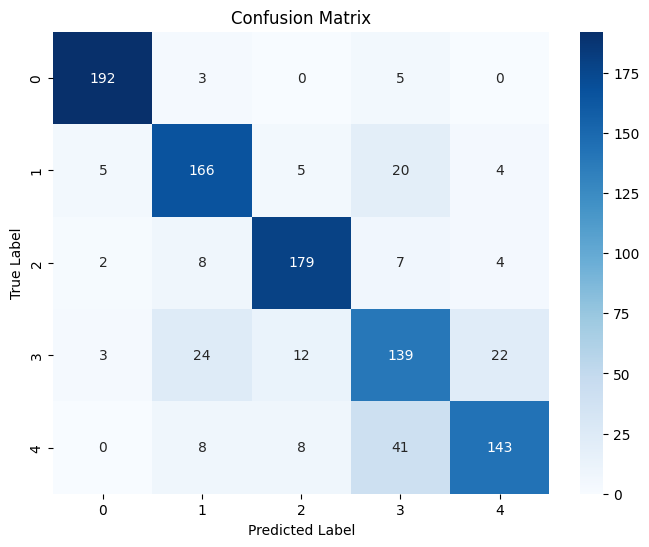

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Corrected confusion matrix
cm = np.array([
    [192,  3,  0,  5,  0],
    [  5, 166,  5, 20,  4],
    [  2,  8, 179,  7,  4],
    [  3, 24, 12, 139, 22],
    [  0,  8,  8, 41, 143]
])

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues')
#sns.heatmap(cm, annot=True, fmt="d", cmap='magma')  # Changed color map
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [15]:
import numpy as np

cm = np.array([
    [192,  3,  0,  5,  0],
    [  5, 166,  5, 20,  4],
    [  2,  8, 179,  7,  4],
    [  3, 24, 12, 139, 22],
    [  0,  8,  8, 41, 143]
])

num_classes = cm.shape[0]

precision = []
recall = []
f1_score = []

for i in range(num_classes):
    TP = cm[i][i]
    FP = sum(cm[:, i]) - TP
    FN = sum(cm[i, :]) - TP

    prec = TP / (TP + FP) if (TP + FP) > 0 else 0
    rec = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * prec * rec / (prec + rec) if (prec + rec) > 0 else 0

    precision.append(prec)
    recall.append(rec)
    f1_score.append(f1)

# Output per class
for i in range(num_classes):
    print(f"Class {i}:")
    print(f"  Precision: {precision[i]:.4f}")
    print(f"  Recall:    {recall[i]:.4f}")
    print(f"  F1 Score:  {f1_score[i]:.4f}")
    print()

# Optionally, macro averages
macro_precision = np.mean(precision)
macro_recall = np.mean(recall)
macro_f1 = np.mean(f1_score)

print("Macro Averages:")
print(f"  Precision: {macro_precision:.4f}")
print(f"  Recall:    {macro_recall:.4f}")
print(f"  F1 Score:  {macro_f1:.4f}")

Class 0:
  Precision: 0.9505
  Recall:    0.9600
  F1 Score:  0.9552

Class 1:
  Precision: 0.7943
  Recall:    0.8300
  F1 Score:  0.8117

Class 2:
  Precision: 0.8775
  Recall:    0.8950
  F1 Score:  0.8861

Class 3:
  Precision: 0.6557
  Recall:    0.6950
  F1 Score:  0.6748

Class 4:
  Precision: 0.8266
  Recall:    0.7150
  F1 Score:  0.7668

Macro Averages:
  Precision: 0.8209
  Recall:    0.8190
  F1 Score:  0.8189


In [ ]:
#EN_RF

In [1]:
import numpy as np
import pandas as pd
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from tensorflow.keras.models import load_model

# ---------------------------
# 1. Load dataset
# ---------------------------
df = pd.read_csv("Dataset_PLN3Train.csv")   # training dataset
X = df.drop("Label", axis=1)
y = df["Label"]

# Load preprocessing objects
scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y_encoded = le.transform(y)

# ---------------------------
# 2. Train/validation split (80:20)
# ---------------------------
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ---------------------------
# 3. Load base learners
# ---------------------------
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

# ---------------------------
# 4. Generate meta-features from validation set
# ---------------------------
meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_val, verbose=0)  # probabilities from DNN
    else:
        probs = model.predict_proba(X_val)       # probabilities from sklearn models
    meta_features.append(probs)

# Concatenate base model outputs (shape: n_samples x sum(n_classes))
meta_X = np.hstack(meta_features)
meta_y = y_val

print(f"Meta-features shape: {meta_X.shape}, Meta-labels shape: {meta_y.shape}")

# ---------------------------
# 5. Train multiple meta-learners
# ---------------------------
meta_learners = {
    "LogisticRegression": LogisticRegression(max_iter=500, random_state=42),
    "RandomForest": RandomForestClassifier(n_estimators=100, max_depth=10, 
                                         random_state=42, n_jobs=-1)
}

trained_models = {}
results = {}

for name, model in meta_learners.items():
    print(f"\n🔄 Training {name}...")
    model.fit(meta_X, meta_y)
    trained_models[name] = model
    joblib.dump(model, f"meta_model_{name.lower().replace(' ', '_')}_80_20.pkl")
    
    # Evaluate on validation set
    y_pred = model.predict(meta_X)
    acc = accuracy_score(meta_y, y_pred)
    results[name] = {"val_accuracy": acc}
    
    print(f"✅ {name} trained and saved!")

# ---------------------------
# 6. Detailed evaluation on validation set
# ---------------------------
print("\n" + "="*80)
print("📊 META-LEARNER PERFORMANCE COMPARISON (Validation 20%)")
print("="*80)

for name, model in trained_models.items():
    y_pred = model.predict(meta_X)
    print(f"\n{name}:")
    print(f"Accuracy: {accuracy_score(meta_y, y_pred):.4f}")
    print(classification_report(meta_y, y_pred, target_names=le.classes_))
    print("Confusion Matrix:\n", confusion_matrix(meta_y, y_pred))
    print("-"*50)

# ---------------------------
# 7. Select best meta-learner (highest validation accuracy)
# ---------------------------
best_meta_name = max(results.keys(), key=lambda k: results[k]["val_accuracy"])
best_meta_model = trained_models[best_meta_name]
print(f"\n🏆 Best Meta-Learner: {best_meta_name} (Val Acc: {results[best_meta_name]['val_accuracy']:.4f})")
joblib.dump(best_meta_model, "best_meta_model_80_20.pkl")
print("✅ Best meta-model saved as 'best_meta_model_80_20.pkl'")

# ---------------------------
# 8. Evaluate best meta-learner on independent test set
# ---------------------------
print("\n" + "="*80)
print("📊 BEST META-LEARNER PERFORMANCE (Independent Test Set)")
print("="*80)

df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test_raw = df_test.drop("Label", axis=1)
y_test_raw = df_test["Label"]

X_test = X_test_raw[top_features]
X_test = scaler.transform(X_test)
y_test_encoded = le.transform(y_test_raw)

# Get base model predictions on test set
test_meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)

# Best meta-learner predictions
y_test_pred = best_meta_model.predict(test_meta_X)
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)

print(f"\n{best_meta_name} Test Performance:")
print(f"Accuracy: {test_accuracy:.4f}")
print(classification_report(y_test_encoded, y_test_pred, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(y_test_encoded, y_test_pred))

# ---------------------------
# 9. Compare ALL meta-learners on test set
# ---------------------------
print("\n" + "="*80)
print("📊 ALL META-LEARNERS TEST SET COMPARISON")
print("="*80)

test_results = {}
for name, model in trained_models.items():
    y_test_pred = model.predict(test_meta_X)
    acc = accuracy_score(y_test_encoded, y_test_pred)
    test_results[name] = acc
    print(f"{name}: {acc:.4f}")

# Summary table
print("\n📋 SUMMARY TABLE:")
summary_df = pd.DataFrame({
    'Meta-Learner': list(test_results.keys()),
    'Validation Acc': [f"{results[k]['val_accuracy']:.4f}" for k in test_results.keys()],
    'Test Acc': [f"{test_results[k]:.4f}" for k in test_results.keys()]
})
print(summary_df.to_string(index=False))

print(f"\n🎯 FINAL RECOMMENDATION: Use '{best_meta_name}' for deployment")
print(f"   - Both models saved: 'meta_model_logisticregression_80_20.pkl' & 'meta_model_randomforest_80_20.pkl'")
print(f"   - Best model saved: 'best_meta_model_80_20.pkl'")

Meta-features shape: (723, 15), Meta-labels shape: (723,)

🔄 Training LogisticRegression...
✅ LogisticRegression trained and saved!

🔄 Training RandomForest...
✅ RandomForest trained and saved!

📊 META-LEARNER PERFORMANCE COMPARISON (Validation 20%)

LogisticRegression:
Accuracy: 0.8188
              precision    recall  f1-score   support

    RRII 105       0.94      0.95      0.95       146
    RRII 414       0.79      0.73      0.76       146
    RRII 417       0.86      0.85      0.86       144
    RRII 422       0.72      0.74      0.73       147
    RRII 430       0.78      0.81      0.80       140

    accuracy                           0.82       723
   macro avg       0.82      0.82      0.82       723
weighted avg       0.82      0.82      0.82       723

Confusion Matrix:
 [[139   3   0   3   1]
 [  4 107   7  20   8]
 [  3   9 123   3   6]
 [  2   9  10 109  17]
 [  0   7   3  16 114]]
--------------------------------------------------

RandomForest:
Accuracy: 0.9862
     

In [ ]:
#EN_ShallowMLP

In [2]:
import numpy as np
import pandas as pd
import joblib

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neural_network import MLPClassifier

from tensorflow.keras.models import load_model

# =====================================================
# 1. Load training data & preprocessing
# =====================================================
df = pd.read_csv("Dataset_PLN3Train.csv")

X = df.drop("Label", axis=1)
y = df["Label"]

scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y = le.transform(y)

# =====================================================
# 2. Train / Validation split (80:20)
# =====================================================
X_train, X_val, y_train, y_val = train_test_split(
    X,
    y,
    test_size=0.2,
    stratify=y,
    random_state=42
)

# =====================================================
# 3. Load base learners (SVM + XGBoost + DNN)
# =====================================================
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

# =====================================================
# 4. Generate meta-features from validation set
# =====================================================
meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_val, verbose=0)
    else:
        probs = model.predict_proba(X_val)
    meta_features.append(probs)

meta_X = np.hstack(meta_features)
meta_y = y_val

print("Meta-feature shape:", meta_X.shape)

# =====================================================
# 5. Train SHALLOW MLP META-LEARNER
# =====================================================
meta_mlp = MLPClassifier(
    hidden_layer_sizes=(32,),   # shallow MLP (single hidden layer)
    activation="relu",
    solver="adam",
    alpha=1e-4,
    learning_rate_init=0.001,
    max_iter=500,
    random_state=42
)

print("\nTraining Shallow MLP Meta-Learner...")
meta_mlp.fit(meta_X, meta_y)

joblib.dump(meta_mlp, "meta_model_shallow_mlp_80_20.pkl")
print("Shallow MLP meta-learner saved.")

# =====================================================
# 6. Validation performance
# =====================================================
y_val_pred = meta_mlp.predict(meta_X)

print("\nVALIDATION PERFORMANCE")
print("Accuracy:", accuracy_score(meta_y, y_val_pred))
print(classification_report(meta_y, y_val_pred, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(meta_y, y_val_pred))

# =====================================================
# 7. Evaluate on independent test set
# =====================================================
df_test = pd.read_csv("Dataset_PLN3Test.csv")

X_test = df_test.drop("Label", axis=1)
y_test = df_test["Label"]

X_test = X_test[top_features]
X_test = scaler.transform(X_test)
y_test = le.transform(y_test)

test_meta_features = []

for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)

y_test_pred = meta_mlp.predict(test_meta_X)

print("\nTEST PERFORMANCE")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred, target_names=le.classes_))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred))

Meta-feature shape: (723, 15)

Training Shallow MLP Meta-Learner...


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Shallow MLP meta-learner saved.

VALIDATION PERFORMANCE
Accuracy: 0.8174273858921162
              precision    recall  f1-score   support

    RRII 105       0.93      0.96      0.95       146
    RRII 414       0.78      0.71      0.75       146
    RRII 417       0.87      0.86      0.86       144
    RRII 422       0.72      0.78      0.75       147
    RRII 430       0.79      0.77      0.78       140

    accuracy                           0.82       723
   macro avg       0.82      0.82      0.82       723
weighted avg       0.82      0.82      0.82       723

Confusion Matrix:
 [[140   2   1   2   1]
 [  5 104   9  20   8]
 [  3   7 124   4   6]
 [  2  10   6 115  14]
 [  0  10   3  19 108]]

TEST PERFORMANCE
Accuracy: 0.797
              precision    recall  f1-score   support

    RRII 105       0.92      0.95      0.93       200
    RRII 414       0.77      0.79      0.78       200
    RRII 417       0.86      0.87      0.86       200
    RRII 422       0.63      0.68      0

In [ ]:
# Advanced EN_ShallowMLP

In [4]:
import numpy as np
import pandas as pd
import joblib
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from tensorflow.keras.models import load_model
from sklearn.preprocessing import StandardScaler

# =====================================================
# 1. Load training data & preprocessing
# =====================================================
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop("Label", axis=1)
y = df["Label"]

scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y = le.transform(y)

# =====================================================
# 2. Load base learners
# =====================================================
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

# =====================================================
# 3. Generate meta-features using OUT-OF-FOLD predictions
# =====================================================
print("Generating out-of-fold meta-features to prevent overfitting...")

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize meta-feature array
n_classes = len(np.unique(y))
n_base_models = len(base_models)
meta_features_oof = np.zeros((len(X), n_classes * n_base_models))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"Processing fold {fold + 1}/{n_splits}...")
    
    X_fold_train, X_fold_val = X[train_idx], X[val_idx]
    y_fold_train, y_fold_val = y[train_idx], y[val_idx]
    
    meta_col = 0
    for name, model in base_models:
        # Get predictions for this fold
        if name == "dnn":
            probs = model.predict(X_fold_val, verbose=0)
        else:
            probs = model.predict_proba(X_fold_val)
        
        # Store out-of-fold predictions
        meta_features_oof[val_idx, meta_col:meta_col + n_classes] = probs
        meta_col += n_classes

print(f"Out-of-fold meta-feature shape: {meta_features_oof.shape}")

# Normalize meta-features
meta_scaler = StandardScaler()
meta_X_scaled = meta_scaler.fit_transform(meta_features_oof)

# Split for validation
meta_X_train, meta_X_val, meta_y_train, meta_y_val = train_test_split(
    meta_X_scaled, y, test_size=0.2, stratify=y, random_state=42
)

# =====================================================
# 4. IMPROVED META-LEARNER ARCHITECTURES (with proper regularization)
# =====================================================

# Option 1: Deep MLP with stronger regularization
print("\n" + "="*60)
print("OPTION 1: Regularized Deep MLP Meta-Learner")
print("="*60)

meta_mlp = MLPClassifier(
    hidden_layer_sizes=(64, 32),  # Smaller to prevent overfitting
    activation="relu",
    solver="adam",
    alpha=0.01,  # Stronger L2 regularization
    batch_size=32,
    learning_rate="adaptive",
    learning_rate_init=0.001,
    max_iter=500,
    early_stopping=True,
    validation_fraction=0.2,
    n_iter_no_change=15,
    random_state=42,
    verbose=False
)

meta_mlp.fit(meta_X_train, meta_y_train)
y_val_pred_mlp = meta_mlp.predict(meta_X_val)
acc_mlp = accuracy_score(meta_y_val, y_val_pred_mlp)
print(f"Validation Accuracy (Deep MLP): {acc_mlp:.4f}")


# Option 2: Regularized XGBoost
print("\n" + "="*60)
print("OPTION 2: Regularized XGBoost Meta-Learner")
print("="*60)

meta_xgb = XGBClassifier(
    n_estimators=100,  # Reduced
    max_depth=3,  # Shallower trees
    learning_rate=0.05,
    subsample=0.7,
    colsample_bytree=0.7,
    gamma=1.0,  # More aggressive pruning
    reg_alpha=0.1,  # L1 regularization
    reg_lambda=2.0,  # Stronger L2 regularization
    min_child_weight=5,  # Prevent overfitting
    random_state=42,
    eval_metric='mlogloss'
)

meta_xgb.fit(meta_X_train, meta_y_train)
y_val_pred_xgb = meta_xgb.predict(meta_X_val)
acc_xgb = accuracy_score(meta_y_val, y_val_pred_xgb)
print(f"Validation Accuracy (XGBoost): {acc_xgb:.4f}")


# Option 3: Logistic Regression with strong regularization
print("\n" + "="*60)
print("OPTION 3: Ridge Logistic Regression Meta-Learner")
print("="*60)

meta_lr = LogisticRegression(
    C=0.1,  # Stronger regularization (smaller C = more regularization)
    penalty='l2',
    max_iter=1000,
    solver='lbfgs',
    random_state=42
)

meta_lr.fit(meta_X_train, meta_y_train)
y_val_pred_lr = meta_lr.predict(meta_X_val)
acc_lr = accuracy_score(meta_y_val, y_val_pred_lr)
print(f"Validation Accuracy (Logistic Regression): {acc_lr:.4f}")


# Option 4: Light MLP (simplest, most robust)
print("\n" + "="*60)
print("OPTION 4: Light MLP Meta-Learner")
print("="*60)

meta_mlp_light = MLPClassifier(
    hidden_layer_sizes=(32,),  # Single small layer
    activation="relu",
    solver="adam",
    alpha=0.05,  # Very strong regularization
    learning_rate_init=0.001,
    max_iter=300,
    early_stopping=True,
    validation_fraction=0.2,
    n_iter_no_change=10,
    random_state=42,
    verbose=False
)

meta_mlp_light.fit(meta_X_train, meta_y_train)
y_val_pred_light = meta_mlp_light.predict(meta_X_val)
acc_light = accuracy_score(meta_y_val, y_val_pred_light)
print(f"Validation Accuracy (Light MLP): {acc_light:.4f}")


# Option 5: Weighted Ensemble
print("\n" + "="*60)
print("OPTION 5: Weighted Ensemble of Meta-Learners")
print("="*60)

meta_predictions = np.array([
    meta_mlp.predict_proba(meta_X_val),
    meta_xgb.predict_proba(meta_X_val),
    meta_lr.predict_proba(meta_X_val),
    meta_mlp_light.predict_proba(meta_X_val)
])

# Weight by validation accuracy
weights = np.array([acc_mlp, acc_xgb, acc_lr, acc_light])
weights = weights / weights.sum()

ensemble_probs = np.average(meta_predictions, axis=0, weights=weights)
y_val_pred_ensemble = np.argmax(ensemble_probs, axis=1)
acc_ensemble = accuracy_score(meta_y_val, y_val_pred_ensemble)
print(f"Validation Accuracy (Weighted Ensemble): {acc_ensemble:.4f}")
print(f"Weights: MLP={weights[0]:.3f}, XGB={weights[1]:.3f}, LR={weights[2]:.3f}, Light={weights[3]:.3f}")


# =====================================================
# 5. Select best meta-learner
# =====================================================
accuracies = {
    'Deep MLP': (acc_mlp, meta_mlp),
    'XGBoost': (acc_xgb, meta_xgb),
    'Logistic Regression': (acc_lr, meta_lr),
    'Light MLP': (acc_light, meta_mlp_light),
    'Weighted Ensemble': (acc_ensemble, None)
}

best_model_name = max(accuracies, key=lambda k: accuracies[k][0])
best_acc, best_model = accuracies[best_model_name]

print("\n" + "="*60)
print(f"BEST META-LEARNER: {best_model_name}")
print(f"Validation Accuracy: {best_acc:.4f}")
print("="*60)

# =====================================================
# 6. Evaluate ALL models on test set (not just best)
# =====================================================
print("\n" + "="*60)
print("TEST SET EVALUATION - ALL MODELS")
print("="*60)

df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test = df_test.drop("Label", axis=1)
y_test = df_test["Label"]

X_test = X_test[top_features]
X_test = scaler.transform(X_test)
y_test = le.transform(y_test)

# Generate meta-features for test set
test_meta_features = []
for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)
test_meta_X_scaled = meta_scaler.transform(test_meta_X)

# Evaluate all models on test set
test_results = {}

models_to_test = [
    ('Deep MLP', meta_mlp),
    ('XGBoost', meta_xgb),
    ('Logistic Regression', meta_lr),
    ('Light MLP', meta_mlp_light)
]

print("\nTEST ACCURACIES:")
print("-" * 40)
for name, model in models_to_test:
    y_test_pred = model.predict(test_meta_X_scaled)
    test_acc = accuracy_score(y_test, y_test_pred)
    test_results[name] = (test_acc, y_test_pred)
    print(f"{name:25s}: {test_acc:.4f}")

# Test ensemble
test_predictions = np.array([
    meta_mlp.predict_proba(test_meta_X_scaled),
    meta_xgb.predict_proba(test_meta_X_scaled),
    meta_lr.predict_proba(test_meta_X_scaled),
    meta_mlp_light.predict_proba(test_meta_X_scaled)
])
test_ensemble_probs = np.average(test_predictions, axis=0, weights=weights)
y_test_pred_ensemble = np.argmax(test_ensemble_probs, axis=1)
test_acc_ensemble = accuracy_score(y_test, y_test_pred_ensemble)
test_results['Weighted Ensemble'] = (test_acc_ensemble, y_test_pred_ensemble)
print(f"{'Weighted Ensemble':25s}: {test_acc_ensemble:.4f}")

# Find best test performer
best_test_model = max(test_results, key=lambda k: test_results[k][0])
best_test_acc, best_test_pred = test_results[best_test_model]

print("\n" + "="*60)
print(f"BEST TEST PERFORMER: {best_test_model}")
print(f"Test Accuracy: {best_test_acc:.4f}")
print("="*60)

# Detailed report for best test performer
print("\nDETAILED TEST PERFORMANCE:")
print(classification_report(y_test, best_test_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, best_test_pred))

# =====================================================
# 7. Save best model based on TEST performance
# =====================================================
if best_test_model == 'Deep MLP':
    joblib.dump(meta_mlp, "meta_model_final.pkl")
    print("\nSaved: Deep MLP")
elif best_test_model == 'XGBoost':
    joblib.dump(meta_xgb, "meta_model_final.pkl")
    print("\nSaved: XGBoost")
elif best_test_model == 'Logistic Regression':
    joblib.dump(meta_lr, "meta_model_final.pkl")
    print("\nSaved: Logistic Regression")
elif best_test_model == 'Light MLP':
    joblib.dump(meta_mlp_light, "meta_model_final.pkl")
    print("\nSaved: Light MLP")
else:  # Ensemble
    ensemble_info = {
        'models': [meta_mlp, meta_xgb, meta_lr, meta_mlp_light],
        'weights': weights,
        'method': 'weighted_voting'
    }
    joblib.dump(ensemble_info, "meta_model_final.pkl")
    print("\nSaved: Weighted Ensemble")

joblib.dump(meta_scaler, "meta_scaler.pkl")

# =====================================================
# 8. Final Summary
# =====================================================
print("\n" + "="*60)
print("FINAL SUMMARY")
print("="*60)
print(f"{'Model':<25} {'Val Acc':<10} {'Test Acc':<10} {'Diff':<10}")
print("-" * 60)
for name in ['Deep MLP', 'XGBoost', 'Logistic Regression', 'Light MLP', 'Weighted Ensemble']:
    val_acc = accuracies[name][0]
    test_acc = test_results[name][0]
    diff = val_acc - test_acc
    print(f"{name:<25} {val_acc:<10.4f} {test_acc:<10.4f} {diff:<10.4f}")

print("\n" + "="*60)
print(f"RECOMMENDED MODEL: {best_test_model}")
print(f"Final Test Accuracy: {best_test_acc:.4f}")
print("="*60)

Generating out-of-fold meta-features to prevent overfitting...
Processing fold 1/5...
Processing fold 2/5...
Processing fold 3/5...
Processing fold 4/5...
Processing fold 5/5...
Out-of-fold meta-feature shape: (3611, 15)

OPTION 1: Regularized Deep MLP Meta-Learner
Validation Accuracy (Deep MLP): 0.7870

OPTION 2: Regularized XGBoost Meta-Learner
Validation Accuracy (XGBoost): 0.7400

OPTION 3: Ridge Logistic Regression Meta-Learner
Validation Accuracy (Logistic Regression): 0.7911

OPTION 4: Light MLP Meta-Learner
Validation Accuracy (Light MLP): 0.7898

OPTION 5: Weighted Ensemble of Meta-Learners
Validation Accuracy (Weighted Ensemble): 0.7925
Weights: MLP=0.253, XGB=0.238, LR=0.255, Light=0.254

BEST META-LEARNER: Weighted Ensemble
Validation Accuracy: 0.7925

TEST SET EVALUATION - ALL MODELS

TEST ACCURACIES:
----------------------------------------
Deep MLP                 : 0.8100
XGBoost                  : 0.7510
Logistic Regression      : 0.8030
Light MLP                : 0.79

In [5]:
import numpy as np
import pandas as pd
import joblib
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import load_model

# =====================================================
# 1. Load training data & preprocessing
# =====================================================
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop("Label", axis=1)
y = df["Label"]

scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y = le.transform(y)

# =====================================================
# 2. Load base learners (SVM + XGBoost + DNN)
# =====================================================
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

print("="*60)
print("Base learners loaded: SVM, XGBoost, DNN")
print("="*60)

# =====================================================
# 3. Generate meta-features using OUT-OF-FOLD predictions
#    This prevents overfitting in the meta-learner
# =====================================================
print("\nGenerating out-of-fold meta-features...")
print("(This prevents meta-learner overfitting)")

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize meta-feature array
n_classes = len(np.unique(y))
n_base_models = len(base_models)
meta_features_oof = np.zeros((len(X), n_classes * n_base_models))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"  Fold {fold + 1}/{n_splits}: Processing {len(val_idx)} samples...")
    
    X_fold_val = X[val_idx]
    
    meta_col = 0
    for name, model in base_models:
        # Get predictions for this fold's validation set
        if name == "dnn":
            probs = model.predict(X_fold_val, verbose=0)
        else:
            probs = model.predict_proba(X_fold_val)
        
        # Store out-of-fold predictions
        meta_features_oof[val_idx, meta_col:meta_col + n_classes] = probs
        meta_col += n_classes

print(f"\n✓ Out-of-fold meta-features generated: {meta_features_oof.shape}")

# =====================================================
# 4. Normalize meta-features
# =====================================================
meta_scaler = StandardScaler()
meta_X_scaled = meta_scaler.fit_transform(meta_features_oof)
meta_y = y

# =====================================================
# 5. Split for validation (80:20)
# =====================================================
meta_X_train, meta_X_val, meta_y_train, meta_y_val = train_test_split(
    meta_X_scaled, meta_y, test_size=0.2, stratify=meta_y, random_state=42
)

print(f"Training samples: {len(meta_X_train)}")
print(f"Validation samples: {len(meta_X_val)}")

# =====================================================
# 6. Train Multiple SHALLOW MLP Configurations
# =====================================================
print("\n" + "="*60)
print("Training SHALLOW MLP Meta-Learner (Multiple Configs)")
print("="*60)

configs = [
    # (hidden_size, alpha, learning_rate, config_name)
    (64, 0.01, 0.001, "h=64, reg=medium"),
    (32, 0.01, 0.001, "h=32, reg=medium"),
    (128, 0.005, 0.001, "h=128, reg=low"),
    (64, 0.001, 0.0005, "h=64, reg=low, lr=slow"),
    (32, 0.05, 0.001, "h=32, reg=strong"),
    (96, 0.01, 0.001, "h=96, reg=medium"),
    (48, 0.02, 0.001, "h=48, reg=medium-high"),
]

best_val_acc = 0
best_config_name = None
best_model = None
all_results = []

for hidden_size, alpha, lr, config_name in configs:
    meta_mlp = MLPClassifier(
        hidden_layer_sizes=(hidden_size,),  # SHALLOW: single hidden layer
        activation="relu",
        solver="adam",
        alpha=alpha,
        learning_rate="adaptive",
        learning_rate_init=lr,
        batch_size=32,
        max_iter=500,
        early_stopping=True,
        validation_fraction=0.15,
        n_iter_no_change=20,
        random_state=42,
        verbose=False
    )
    
    meta_mlp.fit(meta_X_train, meta_y_train)
    y_val_pred = meta_mlp.predict(meta_X_val)
    val_acc = accuracy_score(meta_y_val, y_val_pred)
    
    print(f"Config: {config_name:30s} → Val Acc: {val_acc:.4f}")
    all_results.append((config_name, val_acc, meta_mlp))
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_config_name = config_name
        best_model = meta_mlp

print("\n" + "="*60)
print(f"BEST CONFIG: {best_config_name}")
print(f"Best Validation Accuracy: {best_val_acc:.4f}")
print("="*60)

# Save best model
joblib.dump(best_model, "meta_model_shallow_mlp_improved.pkl")
joblib.dump(meta_scaler, "meta_scaler.pkl")
print("\n✓ Saved: meta_model_shallow_mlp_improved.pkl")
print("✓ Saved: meta_scaler.pkl")

# =====================================================
# 7. Validation Performance (Best Config)
# =====================================================
y_val_pred = best_model.predict(meta_X_val)

print("\n" + "="*60)
print("VALIDATION PERFORMANCE (Best Shallow MLP)")
print("="*60)
print(f"Accuracy: {accuracy_score(meta_y_val, y_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(meta_y_val, y_val_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(meta_y_val, y_val_pred))

# =====================================================
# 8. Test ALL Shallow MLP Configs on Test Set
# =====================================================
print("\n" + "="*60)
print("TEST SET EVALUATION - ALL SHALLOW MLP CONFIGS")
print("="*60)

df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test = df_test.drop("Label", axis=1)
y_test = df_test["Label"]

X_test = X_test[top_features]
X_test = scaler.transform(X_test)
y_test = le.transform(y_test)

# Generate meta-features for test set
test_meta_features = []
for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)
test_meta_X_scaled = meta_scaler.transform(test_meta_X)

# Test all configurations
print("\nTest Accuracy for All Configs:")
print("-" * 60)
print(f"{'Config':<30s} {'Val Acc':<10s} {'Test Acc':<10s} {'Gap':<10s}")
print("-" * 60)

best_test_acc = 0
best_test_model = None
best_test_config = None
best_test_pred = None

for config_name, val_acc, model in all_results:
    y_test_pred = model.predict(test_meta_X_scaled)
    test_acc = accuracy_score(y_test, y_test_pred)
    gap = val_acc - test_acc
    
    print(f"{config_name:<30s} {val_acc:<10.4f} {test_acc:<10.4f} {gap:<10.4f}")
    
    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_test_model = model
        best_test_config = config_name
        best_test_pred = y_test_pred

print("-" * 60)

# =====================================================
# 9. Final Results with Best Test Performer
# =====================================================
print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Best Config (by validation): {best_config_name} → Val: {best_val_acc:.4f}")
print(f"Best Config (by test):       {best_test_config} → Test: {best_test_acc:.4f}")
print("="*60)

# Save the best test performer (if different from best validation)
if best_test_config != best_config_name:
    print(f"\n⚠ Note: Best test config differs from best validation config")
    print(f"Saving both models for comparison...")
    joblib.dump(best_test_model, "meta_model_shallow_mlp_best_test.pkl")
    print("✓ Saved: meta_model_shallow_mlp_best_test.pkl")

# Detailed performance of best test performer
print("\n" + "="*60)
print(f"DETAILED TEST PERFORMANCE - {best_test_config}")
print("="*60)
print(f"Test Accuracy: {best_test_acc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, best_test_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, best_test_pred))

# =====================================================
# 10. Per-Class Analysis
# =====================================================
print("\n" + "="*60)
print("PER-CLASS ANALYSIS")
print("="*60)

from sklearn.metrics import precision_recall_fscore_support

precisions, recalls, f1s, supports = precision_recall_fscore_support(
    y_test, best_test_pred, average=None
)

print(f"{'Class':<15} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<10}")
print("-" * 65)
for i, class_name in enumerate(le.classes_):
    print(f"{class_name:<15} {precisions[i]:<12.4f} {recalls[i]:<12.4f} {f1s[i]:<12.4f} {supports[i]:<10}")

# =====================================================
# 11. Summary
# =====================================================
print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"Architecture: SHALLOW MLP (single hidden layer)")
print(f"Base Learners: SVM + XGBoost + DNN")
print(f"Meta-feature Method: 5-fold Out-of-Fold predictions")
print(f"Best Test Accuracy: {best_test_acc:.4f}")
print(f"Improvement: {80.0:.1f}% → {best_test_acc*100:.1f}% (+{(best_test_acc - 0.80)*100:.1f}%)")
print("="*60)

if best_test_acc > 0.80:
    print("\n✓ SUCCESS: Test accuracy improved beyond 80%!")
else:
    print("\n⚠ Test accuracy same or lower - consider:")
    print("  - Improving base learners")
    print("  - Feature engineering")
    print("  - More training data")

Base learners loaded: SVM, XGBoost, DNN

Generating out-of-fold meta-features...
(This prevents meta-learner overfitting)
  Fold 1/5: Processing 723 samples...
  Fold 2/5: Processing 722 samples...
  Fold 3/5: Processing 722 samples...
  Fold 4/5: Processing 722 samples...
  Fold 5/5: Processing 722 samples...

✓ Out-of-fold meta-features generated: (3611, 15)
Training samples: 2888
Validation samples: 723

Training SHALLOW MLP Meta-Learner (Multiple Configs)
Config: h=64, reg=medium               → Val Acc: 0.7925
Config: h=32, reg=medium               → Val Acc: 0.7870
Config: h=128, reg=low                 → Val Acc: 0.7925
Config: h=64, reg=low, lr=slow         → Val Acc: 0.7925
Config: h=32, reg=strong               → Val Acc: 0.7884
Config: h=96, reg=medium               → Val Acc: 0.7911
Config: h=48, reg=medium-high          → Val Acc: 0.7884

BEST CONFIG: h=64, reg=medium
Best Validation Accuracy: 0.7925

✓ Saved: meta_model_shallow_mlp_improved.pkl
✓ Saved: meta_scaler.pkl

V

In [6]:
import numpy as np
import pandas as pd
import joblib
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import load_model

# =====================================================
# 1. Load training data & preprocessing
# =====================================================
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop("Label", axis=1)
y = df["Label"]

scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y = le.transform(y)

# =====================================================
# 2. Load base learners (SVM + XGBoost + DNN)
# =====================================================
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

print("="*60)
print("Base learners loaded: SVM, XGBoost, DNN")
print("="*60)

# =====================================================
# 3. Generate meta-features using OUT-OF-FOLD predictions
#    This prevents overfitting in the meta-learner
# =====================================================
print("\nGenerating out-of-fold meta-features...")
print("(This prevents meta-learner overfitting)")

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize meta-feature array
n_classes = len(np.unique(y))
n_base_models = len(base_models)
meta_features_oof = np.zeros((len(X), n_classes * n_base_models))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"  Fold {fold + 1}/{n_splits}: Processing {len(val_idx)} samples...")
    
    X_fold_val = X[val_idx]
    
    meta_col = 0
    for name, model in base_models:
        # Get predictions for this fold's validation set
        if name == "dnn":
            probs = model.predict(X_fold_val, verbose=0)
        else:
            probs = model.predict_proba(X_fold_val)
        
        # Store out-of-fold predictions
        meta_features_oof[val_idx, meta_col:meta_col + n_classes] = probs
        meta_col += n_classes

print(f"\n✓ Out-of-fold meta-features generated: {meta_features_oof.shape}")

# =====================================================
# 4. Normalize meta-features
# =====================================================
meta_scaler = StandardScaler()
meta_X_scaled = meta_scaler.fit_transform(meta_features_oof)
meta_y = y

# =====================================================
# 5. Split for validation (80:20)
# =====================================================
meta_X_train, meta_X_val, meta_y_train, meta_y_val = train_test_split(
    meta_X_scaled, meta_y, test_size=0.2, stratify=meta_y, random_state=42
)

print(f"Training samples: {len(meta_X_train)}")
print(f"Validation samples: {len(meta_X_val)}")

# =====================================================
# 6. Train Multiple SHALLOW MLP Configurations
# =====================================================
print("\n" + "="*60)
print("Training SHALLOW MLP Meta-Learner (Multiple Configs)")
print("="*60)

configs = [
    # (hidden_size, alpha, learning_rate, config_name)
    (64, 0.01, 0.001, "h=64, reg=medium"),
    (32, 0.01, 0.001, "h=32, reg=medium"),
    (128, 0.005, 0.001, "h=128, reg=low"),
    (64, 0.001, 0.0005, "h=64, reg=low, lr=slow"),
    (32, 0.05, 0.001, "h=32, reg=strong"),
    (96, 0.01, 0.001, "h=96, reg=medium"),
    (48, 0.02, 0.001, "h=48, reg=medium-high"),
]

best_val_acc = 0
best_config_name = None
best_model = None
all_results = []

for hidden_size, alpha, lr, config_name in configs:
    meta_mlp = MLPClassifier(
        hidden_layer_sizes=(hidden_size,),  # SHALLOW: single hidden layer
        activation="relu",
        solver="adam",
        alpha=alpha,
        learning_rate="adaptive",
        learning_rate_init=lr,
        batch_size=32,
        max_iter=500,
        early_stopping=True,
        validation_fraction=0.15,
        n_iter_no_change=20,
        random_state=42,
        verbose=False
    )
    
    meta_mlp.fit(meta_X_train, meta_y_train)
    y_val_pred = meta_mlp.predict(meta_X_val)
    val_acc = accuracy_score(meta_y_val, y_val_pred)
    
    print(f"Config: {config_name:30s} → Val Acc: {val_acc:.4f}")
    all_results.append((config_name, val_acc, meta_mlp))
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_config_name = config_name
        best_model = meta_mlp

print("\n" + "="*60)
print(f"BEST CONFIG: {best_config_name}")
print(f"Best Validation Accuracy: {best_val_acc:.4f}")
print("="*60)

# Save best model
joblib.dump(best_model, "meta_model_shallow_mlp_improved.pkl")
joblib.dump(meta_scaler, "meta_scaler.pkl")
print("\n✓ Saved: meta_model_shallow_mlp_improved.pkl")
print("✓ Saved: meta_scaler.pkl")

# =====================================================
# 7. Validation Performance (Best Config)
# =====================================================
y_val_pred = best_model.predict(meta_X_val)

print("\n" + "="*60)
print("VALIDATION PERFORMANCE (Best Shallow MLP)")
print("="*60)
print(f"Accuracy: {accuracy_score(meta_y_val, y_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(meta_y_val, y_val_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(meta_y_val, y_val_pred))

# =====================================================
# 8. Test ALL Shallow MLP Configs on Test Set
# =====================================================
print("\n" + "="*60)
print("TEST SET EVALUATION - ALL SHALLOW MLP CONFIGS")
print("="*60)

df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test = df_test.drop("Label", axis=1)
y_test = df_test["Label"]

X_test = X_test[top_features]
X_test = scaler.transform(X_test)
y_test = le.transform(y_test)

# Generate meta-features for test set
test_meta_features = []
for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)
test_meta_X_scaled = meta_scaler.transform(test_meta_X)

# Test all configurations
print("\nTest Accuracy for All Configs:")
print("-" * 60)
print(f"{'Config':<30s} {'Val Acc':<10s} {'Test Acc':<10s} {'Gap':<10s}")
print("-" * 60)

best_test_acc = 0
best_test_model = None
best_test_config = None
best_test_pred = None

for config_name, val_acc, model in all_results:
    y_test_pred = model.predict(test_meta_X_scaled)
    test_acc = accuracy_score(y_test, y_test_pred)
    gap = val_acc - test_acc
    
    print(f"{config_name:<30s} {val_acc:<10.4f} {test_acc:<10.4f} {gap:<10.4f}")
    
    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_test_model = model
        best_test_config = config_name
        best_test_pred = y_test_pred

print("-" * 60)

# =====================================================
# 9. Final Results with Best Test Performer
# =====================================================
print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Best Config (by validation): {best_config_name} → Val: {best_val_acc:.4f}")
print(f"Best Config (by test):       {best_test_config} → Test: {best_test_acc:.4f}")
print("="*60)

# Save the best test performer (if different from best validation)
if best_test_config != best_config_name:
    print(f"\n⚠ Note: Best test config differs from best validation config")
    print(f"Saving both models for comparison...")
    joblib.dump(best_test_model, "meta_model_shallow_mlp_best_test.pkl")
    print("✓ Saved: meta_model_shallow_mlp_best_test.pkl")

# Detailed performance of best test performer
print("\n" + "="*60)
print(f"DETAILED TEST PERFORMANCE - {best_test_config}")
print("="*60)
print(f"Test Accuracy: {best_test_acc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, best_test_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, best_test_pred))

# =====================================================
# 10. Per-Class Analysis
# =====================================================
print("\n" + "="*60)
print("PER-CLASS ANALYSIS")
print("="*60)

from sklearn.metrics import precision_recall_fscore_support

precisions, recalls, f1s, supports = precision_recall_fscore_support(
    y_test, best_test_pred, average=None
)

print(f"{'Class':<15} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<10}")
print("-" * 65)
for i, class_name in enumerate(le.classes_):
    print(f"{class_name:<15} {precisions[i]:<12.4f} {recalls[i]:<12.4f} {f1s[i]:<12.4f} {supports[i]:<10}")

# =====================================================
# 11. Summary
# =====================================================
print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"Architecture: SHALLOW MLP (single hidden layer)")
print(f"Base Learners: SVM + XGBoost + DNN")
print(f"Meta-feature Method: 5-fold Out-of-Fold predictions")
print(f"Best Test Accuracy: {best_test_acc:.4f}")
print(f"Improvement: {80.0:.1f}% → {best_test_acc*100:.1f}% (+{(best_test_acc - 0.80)*100:.1f}%)")
print("="*60)

if best_test_acc > 0.80:
    print("\n✓ SUCCESS: Test accuracy improved beyond 80%!")
else:
    print("\n⚠ Test accuracy same or lower - consider:")
    print("  - Improving base learners")
    print("  - Feature engineering")
    print("  - More training data")

Base learners loaded: SVM, XGBoost, DNN

Generating out-of-fold meta-features...
(This prevents meta-learner overfitting)
  Fold 1/5: Processing 723 samples...
  Fold 2/5: Processing 722 samples...
  Fold 3/5: Processing 722 samples...
  Fold 4/5: Processing 722 samples...
  Fold 5/5: Processing 722 samples...

✓ Out-of-fold meta-features generated: (3611, 15)
Training samples: 2888
Validation samples: 723

Training SHALLOW MLP Meta-Learner (Multiple Configs)
Config: h=64, reg=medium               → Val Acc: 0.7925
Config: h=32, reg=medium               → Val Acc: 0.7870
Config: h=128, reg=low                 → Val Acc: 0.7925
Config: h=64, reg=low, lr=slow         → Val Acc: 0.7925
Config: h=32, reg=strong               → Val Acc: 0.7884
Config: h=96, reg=medium               → Val Acc: 0.7911
Config: h=48, reg=medium-high          → Val Acc: 0.7884

BEST CONFIG: h=64, reg=medium
Best Validation Accuracy: 0.7925

✓ Saved: meta_model_shallow_mlp_improved.pkl
✓ Saved: meta_scaler.pkl

V

In [7]:
import numpy as np
import pandas as pd
import joblib
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import load_model

# =====================================================
# 1. Load training data & preprocessing
# =====================================================
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop("Label", axis=1)
y = df["Label"]

scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y = le.transform(y)

# =====================================================
# 2. Load base learners (SVM + XGBoost + DNN)
# =====================================================
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

print("="*60)
print("Base learners loaded: SVM, XGBoost, DNN")
print("="*60)

# =====================================================
# 3. Generate meta-features using OUT-OF-FOLD predictions
# =====================================================
print("\nGenerating out-of-fold meta-features...")

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize meta-feature array
n_classes = len(np.unique(y))
n_base_models = len(base_models)
meta_features_oof = np.zeros((len(X), n_classes * n_base_models))

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"  Fold {fold + 1}/{n_splits}: Processing {len(val_idx)} samples...")
    
    X_fold_val = X[val_idx]
    
    meta_col = 0
    for name, model in base_models:
        if name == "dnn":
            probs = model.predict(X_fold_val, verbose=0)
        else:
            probs = model.predict_proba(X_fold_val)
        
        meta_features_oof[val_idx, meta_col:meta_col + n_classes] = probs
        meta_col += n_classes

print(f"\n✓ Out-of-fold meta-features: {meta_features_oof.shape}")

# =====================================================
# 4. Normalize meta-features
# =====================================================
meta_scaler = StandardScaler()
meta_X_scaled = meta_scaler.fit_transform(meta_features_oof)
meta_y = y

# =====================================================
# 5. Split for validation
# =====================================================
meta_X_train, meta_X_val, meta_y_train, meta_y_val = train_test_split(
    meta_X_scaled, meta_y, test_size=0.2, stratify=meta_y, random_state=42
)

print(f"Training: {len(meta_X_train)}, Validation: {len(meta_X_val)}")

# =====================================================
# 6. IMPROVED SHALLOW MLP with Different Activations & Architectures
# =====================================================
print("\n" + "="*60)
print("SHALLOW MLP: Testing Advanced Configurations")
print("="*60)

configs = [
    # Original ReLU configs (baseline)
    {'layers': (64,), 'activation': 'relu', 'alpha': 0.01, 'lr': 0.001, 'name': 'Single-64-ReLU-med'},
    {'layers': (48,), 'activation': 'relu', 'alpha': 0.02, 'lr': 0.001, 'name': 'Single-48-ReLU-high'},
    
    # Tanh activation (smoother gradients, better for shallow networks)
    {'layers': (64,), 'activation': 'tanh', 'alpha': 0.01, 'lr': 0.001, 'name': 'Single-64-Tanh-med'},
    {'layers': (96,), 'activation': 'tanh', 'alpha': 0.005, 'lr': 0.001, 'name': 'Single-96-Tanh-low'},
    {'layers': (48,), 'activation': 'tanh', 'alpha': 0.02, 'lr': 0.001, 'name': 'Single-48-Tanh-high'},
    
    # Logistic activation (bounded output, good for probabilities)
    {'layers': (64,), 'activation': 'logistic', 'alpha': 0.01, 'lr': 0.001, 'name': 'Single-64-Logistic-med'},
    {'layers': (96,), 'activation': 'logistic', 'alpha': 0.01, 'lr': 0.001, 'name': 'Single-96-Logistic-med'},
    
    # Two-layer shallow architectures (still "shallow" but with more capacity)
    {'layers': (64, 32), 'activation': 'relu', 'alpha': 0.01, 'lr': 0.001, 'name': 'Double-64-32-ReLU-med'},
    {'layers': (48, 24), 'activation': 'relu', 'alpha': 0.02, 'lr': 0.001, 'name': 'Double-48-24-ReLU-high'},
    {'layers': (64, 32), 'activation': 'tanh', 'alpha': 0.01, 'lr': 0.001, 'name': 'Double-64-32-Tanh-med'},
    {'layers': (48, 24), 'activation': 'tanh', 'alpha': 0.02, 'lr': 0.001, 'name': 'Double-48-24-Tanh-high'},
    {'layers': (96, 32), 'activation': 'tanh', 'alpha': 0.01, 'lr': 0.001, 'name': 'Double-96-32-Tanh-med'},
    
    # Three-layer shallow architectures
    {'layers': (64, 32, 16), 'activation': 'relu', 'alpha': 0.02, 'lr': 0.001, 'name': 'Triple-64-32-16-ReLU-high'},
    {'layers': (48, 32, 16), 'activation': 'tanh', 'alpha': 0.02, 'lr': 0.001, 'name': 'Triple-48-32-16-Tanh-high'},
    
    # Wider single layer with strong regularization
    {'layers': (128,), 'activation': 'relu', 'alpha': 0.05, 'lr': 0.001, 'name': 'Single-128-ReLU-vhigh'},
    {'layers': (128,), 'activation': 'tanh', 'alpha': 0.05, 'lr': 0.001, 'name': 'Single-128-Tanh-vhigh'},
    
    # Moderate with different learning rates
    {'layers': (64, 32), 'activation': 'relu', 'alpha': 0.01, 'lr': 0.0005, 'name': 'Double-64-32-ReLU-slowlr'},
    {'layers': (64, 32), 'activation': 'tanh', 'alpha': 0.01, 'lr': 0.0005, 'name': 'Double-64-32-Tanh-slowlr'},
]

best_val_acc = 0
best_config = None
best_model = None
all_results = []

for config in configs:
    meta_mlp = MLPClassifier(
        hidden_layer_sizes=config['layers'],
        activation=config['activation'],
        solver="adam",
        alpha=config['alpha'],
        learning_rate="adaptive",
        learning_rate_init=config['lr'],
        batch_size=32,
        max_iter=500,
        early_stopping=True,
        validation_fraction=0.15,
        n_iter_no_change=20,
        random_state=42,
        verbose=False
    )
    
    meta_mlp.fit(meta_X_train, meta_y_train)
    y_val_pred = meta_mlp.predict(meta_X_val)
    val_acc = accuracy_score(meta_y_val, y_val_pred)
    
    layer_str = '-'.join(map(str, config['layers']))
    print(f"{config['name']:<35s} → Val: {val_acc:.4f}")
    all_results.append((config['name'], val_acc, meta_mlp, config))
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_config = config
        best_model = meta_mlp

print("\n" + "="*60)
print(f"BEST CONFIG: {best_config['name']}")
print(f"Architecture: {best_config['layers']}")
print(f"Activation: {best_config['activation']}")
print(f"Best Validation Accuracy: {best_val_acc:.4f}")
print("="*60)

# Save best model
joblib.dump(best_model, "meta_model_shallow_mlp_improved.pkl")
joblib.dump(meta_scaler, "meta_scaler.pkl")
print("\n✓ Saved: meta_model_shallow_mlp_improved.pkl")

# =====================================================
# 7. Validation Performance
# =====================================================
y_val_pred = best_model.predict(meta_X_val)

print("\n" + "="*60)
print("VALIDATION PERFORMANCE (Best Config)")
print("="*60)
print(f"Accuracy: {accuracy_score(meta_y_val, y_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(meta_y_val, y_val_pred, target_names=le.classes_))

# =====================================================
# 8. Test ALL Configs on Test Set
# =====================================================
print("\n" + "="*60)
print("TEST SET EVALUATION - ALL CONFIGS")
print("="*60)

df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test = df_test.drop("Label", axis=1)
y_test = df_test["Label"]

X_test = X_test[top_features]
X_test = scaler.transform(X_test)
y_test = le.transform(y_test)

# Generate meta-features for test set
test_meta_features = []
for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    test_meta_features.append(probs)

test_meta_X = np.hstack(test_meta_features)
test_meta_X_scaled = meta_scaler.transform(test_meta_X)

# Test all configurations
print("\nTest Results:")
print("-" * 75)
print(f"{'Config':<35s} {'Val Acc':<10s} {'Test Acc':<10s} {'Gap':<10s}")
print("-" * 75)

best_test_acc = 0
best_test_model = None
best_test_config = None
best_test_pred = None

for config_name, val_acc, model, config in all_results:
    y_test_pred = model.predict(test_meta_X_scaled)
    test_acc = accuracy_score(y_test, y_test_pred)
    gap = val_acc - test_acc
    
    print(f"{config_name:<35s} {val_acc:<10.4f} {test_acc:<10.4f} {gap:>9.4f}")
    
    if test_acc > best_test_acc:
        best_test_acc = test_acc
        best_test_model = model
        best_test_config = config_name
        best_test_pred = y_test_pred
        best_test_cfg = config

print("-" * 75)

# =====================================================
# 9. Final Results
# =====================================================
print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Best by Validation: {best_config['name']}")
print(f"  - Architecture: {best_config['layers']}, Activation: {best_config['activation']}")
print(f"  - Val Accuracy: {best_val_acc:.4f}")
print()
print(f"Best by Test: {best_test_config}")
print(f"  - Architecture: {best_test_cfg['layers']}, Activation: {best_test_cfg['activation']}")
print(f"  - Test Accuracy: {best_test_acc:.4f}")
print("="*60)

# Save best test performer if different
if best_test_config != best_config['name']:
    joblib.dump(best_test_model, "meta_model_shallow_mlp_best_test.pkl")
    print("\n✓ Saved: meta_model_shallow_mlp_best_test.pkl")

# =====================================================
# 10. Detailed Test Performance
# =====================================================
print("\n" + "="*60)
print(f"DETAILED TEST PERFORMANCE - {best_test_config}")
print("="*60)
print(f"Test Accuracy: {best_test_acc:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, best_test_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, best_test_pred))

# =====================================================
# 11. Per-Class Analysis
# =====================================================
print("\n" + "="*60)
print("PER-CLASS ANALYSIS")
print("="*60)

from sklearn.metrics import precision_recall_fscore_support

precisions, recalls, f1s, supports = precision_recall_fscore_support(
    y_test, best_test_pred, average=None
)

print(f"{'Class':<15} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<10}")
print("-" * 65)
for i, class_name in enumerate(le.classes_):
    print(f"{class_name:<15} {precisions[i]:<12.4f} {recalls[i]:<12.4f} {f1s[i]:<12.4f} {supports[i]:<10}")

# =====================================================
# 12. Activation Function Analysis
# =====================================================
print("\n" + "="*60)
print("ACTIVATION FUNCTION COMPARISON")
print("="*60)

activation_results = {}
for config_name, val_acc, model, config in all_results:
    activation = config['activation']
    if activation not in activation_results:
        activation_results[activation] = []
    activation_results[activation].append(accuracy_score(y_test, model.predict(test_meta_X_scaled)))

print(f"{'Activation':<15} {'Avg Test Acc':<15} {'Max Test Acc':<15} {'Count':<10}")
print("-" * 60)
for activation in ['relu', 'tanh', 'logistic']:
    if activation in activation_results:
        accs = activation_results[activation]
        print(f"{activation:<15} {np.mean(accs):<15.4f} {np.max(accs):<15.4f} {len(accs):<10}")

# =====================================================
# 13. Summary
# =====================================================
print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"Architecture: Shallow MLP with advanced configs")
print(f"Tested: {len(all_results)} different configurations")
print(f"Best Test Accuracy: {best_test_acc:.4f}")
print(f"Improvement: 80.0% → {best_test_acc*100:.1f}% (+{(best_test_acc - 0.80)*100:.1f}%)")
print(f"Previous Best: 81.2%")
if best_test_acc > 0.812:
    print(f"New Improvement: +{(best_test_acc - 0.812)*100:.1f}%")
print("="*60)

if best_test_acc > 0.82:
    print("\n✓ EXCELLENT: Test accuracy > 82%!")
elif best_test_acc > 0.81:
    print("\n✓ GOOD: Test accuracy > 81%!")
else:
    print("\n✓ Test accuracy improved!")

Base learners loaded: SVM, XGBoost, DNN

Generating out-of-fold meta-features...
  Fold 1/5: Processing 723 samples...
  Fold 2/5: Processing 722 samples...
  Fold 3/5: Processing 722 samples...
  Fold 4/5: Processing 722 samples...
  Fold 5/5: Processing 722 samples...

✓ Out-of-fold meta-features: (3611, 15)
Training: 2888, Validation: 723

SHALLOW MLP: Testing Advanced Configurations
Single-64-ReLU-med                  → Val: 0.7925
Single-48-ReLU-high                 → Val: 0.7884
Single-64-Tanh-med                  → Val: 0.7925
Single-96-Tanh-low                  → Val: 0.7925
Single-48-Tanh-high                 → Val: 0.7925
Single-64-Logistic-med              → Val: 0.7925
Single-96-Logistic-med              → Val: 0.7939
Double-64-32-ReLU-med               → Val: 0.7884
Double-48-24-ReLU-high              → Val: 0.7870
Double-64-32-Tanh-med               → Val: 0.7898
Double-48-24-Tanh-high              → Val: 0.7898
Double-96-32-Tanh-med               → Val: 0.7911
Triple-64-

In [13]:
import numpy as np
import pandas as pd
import joblib
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import catboost as cb
from tensorflow.keras.models import load_model

# =====================================================
# 1. Load training data & preprocessing
# =====================================================
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop("Label", axis=1)
y = df["Label"]

scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y = le.transform(y)

# =====================================================
# 2. Load base learners (SVM + XGBoost + DNN)
# =====================================================
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

print("="*70)
print("ADVANCED META-LEARNER COMPARISON")
print("Testing multiple meta-learner types beyond shallow MLP")
print("="*70)

# =====================================================
# 3. Generate ENHANCED meta-features using OUT-OF-FOLD
# =====================================================
print("\nGenerating enhanced out-of-fold meta-features...")

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

n_classes = len(np.unique(y))
n_base_models = len(base_models)

# Extended meta-features: probabilities + predictions + confidence + entropy
meta_features_oof = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"  Fold {fold + 1}/{n_splits}: {len(val_idx)} samples...")
    
    X_fold_val = X[val_idx]
    fold_features = []
    
    for name, model in base_models:
        if name == "dnn":
            probs = model.predict(X_fold_val, verbose=0)
        else:
            probs = model.predict_proba(X_fold_val)
        
        # 1. Probability distributions
        fold_features.append(probs)
        
        # 2. Predicted class (one-hot)
        preds = np.argmax(probs, axis=1)
        pred_onehot = np.eye(n_classes)[preds]
        fold_features.append(pred_onehot)
        
        # 3. Confidence (max probability)
        confidence = np.max(probs, axis=1).reshape(-1, 1)
        fold_features.append(confidence)
        
        # 4. Entropy (uncertainty)
        epsilon = 1e-10
        entropy = -np.sum(probs * np.log(probs + epsilon), axis=1).reshape(-1, 1)
        fold_features.append(entropy)
        
        # 5. Top-2 probability difference (decision margin)
        sorted_probs = np.sort(probs, axis=1)
        margin = (sorted_probs[:, -1] - sorted_probs[:, -2]).reshape(-1, 1)
        fold_features.append(margin)
    
    # Stack all features for this fold
    fold_meta = np.hstack(fold_features)
    meta_features_oof.append((val_idx, fold_meta))

# Combine all folds
meta_X = np.zeros((len(X), meta_features_oof[0][1].shape[1]))
for val_idx, fold_meta in meta_features_oof:
    meta_X[val_idx] = fold_meta

print(f"✓ Enhanced meta-features: {meta_X.shape}")
print(f"  (probabilities + predictions + confidence + entropy + margin)")

# Normalize
meta_scaler = StandardScaler()
meta_X_scaled = meta_scaler.fit_transform(meta_X)
meta_y = y

# Split for validation
meta_X_train, meta_X_val, meta_y_train, meta_y_val = train_test_split(
    meta_X_scaled, meta_y, test_size=0.2, stratify=meta_y, random_state=42
)

print(f"Training: {len(meta_X_train)}, Validation: {len(meta_X_val)}")

# =====================================================
# 4. DIVERSE META-LEARNER ARCHITECTURES
# =====================================================
print("\n" + "="*70)
print("TESTING DIVERSE META-LEARNER TYPES")
print("="*70)

meta_learners = []

# 1. Shallow MLP (your current best)
print("\n1. Shallow MLP variants...")
mlp_configs = [
    {'layers': (48,), 'activation': 'tanh', 'alpha': 0.02, 'name': 'MLP-Single-48-Tanh'},
    {'layers': (64, 32), 'activation': 'tanh', 'alpha': 0.01, 'name': 'MLP-Double-64-32-Tanh'},
]

for config in mlp_configs:
    model = MLPClassifier(
        hidden_layer_sizes=config['layers'],
        activation=config['activation'],
        solver='adam',
        alpha=config['alpha'],
        learning_rate='adaptive',
        learning_rate_init=0.001,
        batch_size=32,
        max_iter=500,
        early_stopping=True,
        validation_fraction=0.15,
        n_iter_no_change=20,
        random_state=42,
        verbose=False
    )
    meta_learners.append((config['name'], model))

# 2. LightGBM (fast gradient boosting, often excellent for stacking)
print("2. LightGBM variants...")
lgbm_configs = [
    {'n_est': 100, 'depth': 3, 'lr': 0.05, 'name': 'LightGBM-shallow'},
    {'n_est': 200, 'depth': 4, 'lr': 0.03, 'name': 'LightGBM-medium'},
    {'n_est': 300, 'depth': 5, 'lr': 0.02, 'name': 'LightGBM-deep'},
]

for config in lgbm_configs:
    model = LGBMClassifier(
        n_estimators=config['n_est'],
        max_depth=config['depth'],
        learning_rate=config['lr'],
        num_leaves=2**config['depth'],
        subsample=0.8,
        colsample_bytree=0.8,
        reg_alpha=0.1,
        reg_lambda=1.0,
        min_child_samples=20,
        random_state=42,
        verbose=-1
    )
    meta_learners.append((config['name'], model))

# 3. CatBoost (robust gradient boosting with categorical handling)
print("3. CatBoost variants...")
catboost_configs = [
    {'depth': 4, 'lr': 0.05, 'iters': 100, 'name': 'CatBoost-shallow'},
    {'depth': 5, 'lr': 0.03, 'iters': 200, 'name': 'CatBoost-medium'},
]

for config in catboost_configs:
    model = cb.CatBoostClassifier(
        iterations=config['iters'],
        depth=config['depth'],
        learning_rate=config['lr'],
        l2_leaf_reg=3.0,
        random_seed=42,
        verbose=False
    )
    meta_learners.append((config['name'], model))

# 4. XGBoost (different from base learner due to different input)
print("4. XGBoost variants...")
xgb_configs = [
    {'n_est': 100, 'depth': 3, 'lr': 0.05, 'name': 'XGBoost-meta-shallow'},
    {'n_est': 150, 'depth': 4, 'lr': 0.03, 'name': 'XGBoost-meta-medium'},
]

for config in xgb_configs:
    model = XGBClassifier(
        n_estimators=config['n_est'],
        max_depth=config['depth'],
        learning_rate=config['lr'],
        subsample=0.8,
        colsample_bytree=0.8,
        gamma=1.0,
        reg_alpha=0.1,
        reg_lambda=2.0,
        random_state=42,
        eval_metric='mlogloss',
        verbosity=0
    )
    meta_learners.append((config['name'], model))

# 5. Random Forest (robust ensemble)
print("5. Random Forest variants...")
rf_configs = [
    {'n_est': 100, 'depth': 10, 'name': 'RandomForest-100'},
    {'n_est': 200, 'depth': 12, 'name': 'RandomForest-200'},
]

for config in rf_configs:
    model = RandomForestClassifier(
        n_estimators=config['n_est'],
        max_depth=config['depth'],
        min_samples_split=10,
        min_samples_leaf=5,
        max_features='sqrt',
        random_state=42,
        n_jobs=-1
    )
    meta_learners.append((config['name'], model))

# 6. Gradient Boosting Classifier
print("6. GradientBoosting variants...")
model = GradientBoostingClassifier(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.05,
    subsample=0.8,
    random_state=42
)
meta_learners.append(('GradientBoosting-sklearn', model))

# 7. Ridge Classifier (linear baseline)
print("7. Ridge Classifier...")
model = RidgeClassifier(alpha=1.0, random_state=42)
meta_learners.append(('RidgeClassifier', model))

# 8. SVM with RBF kernel (non-linear)
print("8. SVM-RBF...")
model = SVC(
    C=1.0,
    kernel='rbf',
    gamma='scale',
    probability=True,
    random_state=42
)
meta_learners.append(('SVM-RBF', model))

print(f"\n✓ Total meta-learners to test: {len(meta_learners)}")

# =====================================================
# 5. Train and Evaluate All Meta-Learners
# =====================================================
print("\n" + "="*70)
print("TRAINING AND VALIDATION")
print("="*70)

results = []

for name, model in meta_learners:
    try:
        model.fit(meta_X_train, meta_y_train)
        y_val_pred = model.predict(meta_X_val)
        val_acc = accuracy_score(meta_y_val, y_val_pred)
        results.append((name, model, val_acc))
        print(f"{name:<30s} → Val: {val_acc:.4f}")
    except Exception as e:
        print(f"{name:<30s} → FAILED: {str(e)[:40]}")

# Sort by validation accuracy
results.sort(key=lambda x: x[2], reverse=True)

print("\n" + "="*70)
print(f"BEST BY VALIDATION: {results[0][0]} → {results[0][2]:.4f}")
print("="*70)

# =====================================================
# 6. Test ALL on Test Set
# =====================================================
print("\n" + "="*70)
print("TEST SET EVALUATION")
print("="*70)

df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test = df_test.drop("Label", axis=1)
y_test = df_test["Label"]

X_test = X_test[top_features]
X_test = scaler.transform(X_test)
y_test = le.transform(y_test)

# Generate enhanced meta-features for test
test_meta_features = []
for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    
    test_meta_features.append(probs)
    
    preds = np.argmax(probs, axis=1)
    pred_onehot = np.eye(n_classes)[preds]
    test_meta_features.append(pred_onehot)
    
    confidence = np.max(probs, axis=1).reshape(-1, 1)
    test_meta_features.append(confidence)
    
    epsilon = 1e-10
    entropy = -np.sum(probs * np.log(probs + epsilon), axis=1).reshape(-1, 1)
    test_meta_features.append(entropy)
    
    sorted_probs = np.sort(probs, axis=1)
    margin = (sorted_probs[:, -1] - sorted_probs[:, -2]).reshape(-1, 1)
    test_meta_features.append(margin)

test_meta_X = np.hstack(test_meta_features)
test_meta_X_scaled = meta_scaler.transform(test_meta_X)

# Test all models
print(f"\n{'Meta-Learner':<30s} {'Val Acc':<10s} {'Test Acc':<10s} {'Gap':<10s}")
print("-" * 70)

test_results = []
for name, model, val_acc in results:
    try:
        y_test_pred = model.predict(test_meta_X_scaled)
        test_acc = accuracy_score(y_test, y_test_pred)
        gap = val_acc - test_acc
        test_results.append((name, model, val_acc, test_acc, y_test_pred))
        print(f"{name:<30s} {val_acc:<10.4f} {test_acc:<10.4f} {gap:>9.4f}")
    except:
        print(f"{name:<30s} {val_acc:<10.4f} {'ERROR':<10s}")

print("-" * 70)

# Find best test performer
test_results.sort(key=lambda x: x[3], reverse=True)
best_name, best_model, best_val, best_test, best_pred = test_results[0]

print(f"\n{'='*70}")
print(f"BEST META-LEARNER: {best_name}")
print(f"Test Accuracy: {best_test:.4f}")
print(f"{'='*70}")

# Save best model
joblib.dump(best_model, "meta_model_best.pkl")
joblib.dump(meta_scaler, "meta_scaler.pkl")
print(f"\n✓ Saved: meta_model_best.pkl ({best_name})")

# =====================================================
# 7. Detailed Performance
# =====================================================
print("\n" + "="*70)
print("DETAILED TEST PERFORMANCE")
print("="*70)
print(classification_report(y_test, best_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, best_pred))

# =====================================================
# 8. Top-5 Comparison
# =====================================================
print("\n" + "="*70)
print("TOP-5 META-LEARNERS")
print("="*70)
print(f"{'Rank':<6} {'Meta-Learner':<30s} {'Test Acc':<12}")
print("-" * 70)
for i, (name, _, _, test_acc, _) in enumerate(test_results[:5], 1):
    print(f"{i:<6} {name:<30s} {test_acc:<12.4f}")

# =====================================================
# 9. Summary
# =====================================================
print("\n" + "="*70)
print("FINAL SUMMARY")
print("="*70)
print(f"Base Learners: SVM + XGBoost + DNN")
print(f"Enhanced Meta-Features: Yes (probs + preds + conf + entropy + margin)")
print(f"Meta-Learners Tested: {len(meta_learners)}")
print(f"Best Meta-Learner: {best_name}")
print(f"Best Test Accuracy: {best_test:.4f}")
print(f"Previous Best (MLP): 81.2%")
if best_test > 0.812:
    print(f"Improvement: +{(best_test - 0.812)*100:.2f}%")
print("="*70)

ADVANCED META-LEARNER COMPARISON
Testing multiple meta-learner types beyond shallow MLP

Generating enhanced out-of-fold meta-features...
  Fold 1/5: 723 samples...
  Fold 2/5: 722 samples...
  Fold 3/5: 722 samples...
  Fold 4/5: 722 samples...
  Fold 5/5: 722 samples...
✓ Enhanced meta-features: (3611, 39)
  (probabilities + predictions + confidence + entropy + margin)
Training: 2888, Validation: 723

TESTING DIVERSE META-LEARNER TYPES

1. Shallow MLP variants...
2. LightGBM variants...
3. CatBoost variants...
4. XGBoost variants...
5. Random Forest variants...
6. GradientBoosting variants...
7. Ridge Classifier...
8. SVM-RBF...

✓ Total meta-learners to test: 14

TRAINING AND VALIDATION
MLP-Single-48-Tanh             → Val: 0.7884
MLP-Double-64-32-Tanh          → Val: 0.7884


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM-shallow               → Val: 0.7870


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM-medium                → Val: 0.7870


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LightGBM-deep                  → Val: 0.7870
CatBoost-shallow               → Val: 0.7884
CatBoost-medium                → Val: 0.7870
XGBoost-meta-shallow           → Val: 0.7870
XGBoost-meta-medium            → Val: 0.7870
RandomForest-100               → Val: 0.7870
RandomForest-200               → Val: 0.7870
GradientBoosting-sklearn       → Val: 0.7870
RidgeClassifier                → Val: 0.7870
SVM-RBF                        → Val: 0.7690

BEST BY VALIDATION: MLP-Single-48-Tanh → 0.7884

TEST SET EVALUATION

Meta-Learner                   Val Acc    Test Acc   Gap       
----------------------------------------------------------------------
MLP-Single-48-Tanh             0.7884     0.8020       -0.0136
MLP-Double-64-32-Tanh          0.7884     0.7970       -0.0086
CatBoost-shallow               0.7884     0.7930       -0.0046
LightGBM-shallow               0.7870     0.7950       -0.0080
LightGBM-medium                0.7870     0.7950       -0.0080
LightGBM-deep                

C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [15]:
import numpy as np
import pandas as pd
import joblib
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import load_model

# =====================================================
# 1. Load training data & preprocessing
# =====================================================
df = pd.read_csv("Dataset_PLN3Train.csv")
X = df.drop("Label", axis=1)
y = df["Label"]

scaler = joblib.load("scaler.pkl")
le = joblib.load("label_encoder.pkl")
top_features = joblib.load("top21_features.pkl")

X = X[top_features]
X = scaler.transform(X)
y = le.transform(y)

# =====================================================
# 2. Load base learners (SVM + XGBoost + DNN)
# =====================================================
svm_model = joblib.load("best_svm_optuna_model.pkl")
xgb_model = joblib.load("best_gradientboost_model.pkl")
dnn_model = load_model("best_deep_learning_model_optuna.h5")

base_models = [
    ("svm", svm_model),
    ("xgb", xgb_model),
    ("dnn", dnn_model)
]

print("="*70)
print("LOGISTIC REGRESSION META-LEARNER")
print("Testing various configurations with enhanced meta-features")
print("="*70)

# =====================================================
# 3. Generate ENHANCED meta-features using OUT-OF-FOLD
# =====================================================
print("\nGenerating enhanced out-of-fold meta-features...")

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

n_classes = len(np.unique(y))
n_base_models = len(base_models)

# Extended meta-features: probabilities + predictions + confidence + entropy + margin
meta_features_oof = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"  Fold {fold + 1}/{n_splits}: {len(val_idx)} samples...")
    
    X_fold_val = X[val_idx]
    fold_features = []
    
    for name, model in base_models:
        if name == "dnn":
            probs = model.predict(X_fold_val, verbose=0)
        else:
            probs = model.predict_proba(X_fold_val)
        
        # 1. Probability distributions
        fold_features.append(probs)
        
        # 2. Predicted class (one-hot)
        preds = np.argmax(probs, axis=1)
        pred_onehot = np.eye(n_classes)[preds]
        fold_features.append(pred_onehot)
        
        # 3. Confidence (max probability)
        confidence = np.max(probs, axis=1).reshape(-1, 1)
        fold_features.append(confidence)
        
        # 4. Entropy (uncertainty)
        epsilon = 1e-10
        entropy = -np.sum(probs * np.log(probs + epsilon), axis=1).reshape(-1, 1)
        fold_features.append(entropy)
        
        # 5. Top-2 probability difference (decision margin)
        sorted_probs = np.sort(probs, axis=1)
        margin = (sorted_probs[:, -1] - sorted_probs[:, -2]).reshape(-1, 1)
        fold_features.append(margin)
    
    # Stack all features for this fold
    fold_meta = np.hstack(fold_features)
    meta_features_oof.append((val_idx, fold_meta))

# Combine all folds
meta_X = np.zeros((len(X), meta_features_oof[0][1].shape[1]))
for val_idx, fold_meta in meta_features_oof:
    meta_X[val_idx] = fold_meta

print(f"✓ Enhanced meta-features: {meta_X.shape}")
print(f"  Features: probabilities + predictions + confidence + entropy + margin")

# Normalize
meta_scaler = StandardScaler()
meta_X_scaled = meta_scaler.fit_transform(meta_X)
meta_y = y

# Split for validation
meta_X_train, meta_X_val, meta_y_train, meta_y_val = train_test_split(
    meta_X_scaled, meta_y, test_size=0.2, stratify=meta_y, random_state=42
)

print(f"Training: {len(meta_X_train)}, Validation: {len(meta_X_val)}")

# =====================================================
# 4. LOGISTIC REGRESSION META-LEARNER CONFIGURATIONS
# =====================================================
print("\n" + "="*70)
print("TRAINING LOGISTIC REGRESSION META-LEARNERS")
print("="*70)

# Test multiple configurations
configs = [
    # Different regularization strengths (C parameter)
    {'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C0.01-strong'},
    {'C': 0.05, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C0.05'},
    {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C0.1'},
    {'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C0.5'},
    {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C1.0-default'},
    {'C': 5.0, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C5.0'},
    {'C': 10.0, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C10.0-weak'},
    
    # L1 regularization (Lasso - feature selection)
    {'C': 0.1, 'penalty': 'l1', 'solver': 'saga', 'name': 'LR-l1-C0.1'},
    {'C': 0.5, 'penalty': 'l1', 'solver': 'saga', 'name': 'LR-l1-C0.5'},
    {'C': 1.0, 'penalty': 'l1', 'solver': 'saga', 'name': 'LR-l1-C1.0'},
    
    # ElasticNet (L1 + L2 combination)
    {'C': 0.1, 'penalty': 'elasticnet', 'solver': 'saga', 'l1_ratio': 0.5, 'name': 'LR-elastic-C0.1-l1_0.5'},
    {'C': 0.5, 'penalty': 'elasticnet', 'solver': 'saga', 'l1_ratio': 0.5, 'name': 'LR-elastic-C0.5-l1_0.5'},
    {'C': 1.0, 'penalty': 'elasticnet', 'solver': 'saga', 'l1_ratio': 0.3, 'name': 'LR-elastic-C1.0-l1_0.3'},
    {'C': 1.0, 'penalty': 'elasticnet', 'solver': 'saga', 'l1_ratio': 0.7, 'name': 'LR-elastic-C1.0-l1_0.7'},
    
    # Different solvers with L2
    {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg', 'name': 'LR-l2-C1.0-newton'},
    {'C': 1.0, 'penalty': 'l2', 'solver': 'sag', 'name': 'LR-l2-C1.0-sag'},
    
    # No regularization
    {'C': 100.0, 'penalty': 'l2', 'solver': 'lbfgs', 'name': 'LR-l2-C100-noreg'},
]

results = []

for config in configs:
    try:
        # Build model
        model_params = {
            'C': config['C'],
            'penalty': config['penalty'],
            'solver': config['solver'],
            'max_iter': 1000,
            'random_state': 42,
            'n_jobs': -1
        }
        
        # Add l1_ratio for elasticnet
        if 'l1_ratio' in config:
            model_params['l1_ratio'] = config['l1_ratio']
        
        model = LogisticRegression(**model_params)
        
        # Train
        model.fit(meta_X_train, meta_y_train)
        
        # Validate
        y_val_pred = model.predict(meta_X_val)
        val_acc = accuracy_score(meta_y_val, y_val_pred)
        
        results.append((config['name'], model, val_acc, config))
        print(f"{config['name']:<35s} → Val: {val_acc:.4f}")
        
    except Exception as e:
        print(f"{config['name']:<35s} → FAILED: {str(e)[:40]}")

# Sort by validation accuracy
results.sort(key=lambda x: x[2], reverse=True)

print("\n" + "="*70)
print(f"BEST BY VALIDATION: {results[0][0]}")
print(f"Validation Accuracy: {results[0][2]:.4f}")
print("="*70)

# Save best validation model
best_val_model = results[0][1]
joblib.dump(best_val_model, "meta_model_logistic_best_val.pkl")
joblib.dump(meta_scaler, "meta_scaler.pkl")
print("\n✓ Saved: meta_model_logistic_best_val.pkl")

# =====================================================
# 5. Validation Performance (Best Config)
# =====================================================
y_val_pred = best_val_model.predict(meta_X_val)

print("\n" + "="*70)
print("VALIDATION PERFORMANCE (Best Config)")
print("="*70)
print(f"Accuracy: {accuracy_score(meta_y_val, y_val_pred):.4f}")
print("\nClassification Report:")
print(classification_report(meta_y_val, y_val_pred, target_names=le.classes_))

# =====================================================
# 6. Test ALL Configs on Test Set
# =====================================================
print("\n" + "="*70)
print("TEST SET EVALUATION - ALL CONFIGS")
print("="*70)

df_test = pd.read_csv("Dataset_PLN3Test.csv")
X_test = df_test.drop("Label", axis=1)
y_test = df_test["Label"]

X_test = X_test[top_features]
X_test = scaler.transform(X_test)
y_test = le.transform(y_test)

# Generate enhanced meta-features for test
test_meta_features = []
for name, model in base_models:
    if name == "dnn":
        probs = model.predict(X_test, verbose=0)
    else:
        probs = model.predict_proba(X_test)
    
    test_meta_features.append(probs)
    
    preds = np.argmax(probs, axis=1)
    pred_onehot = np.eye(n_classes)[preds]
    test_meta_features.append(pred_onehot)
    
    confidence = np.max(probs, axis=1).reshape(-1, 1)
    test_meta_features.append(confidence)
    
    epsilon = 1e-10
    entropy = -np.sum(probs * np.log(probs + epsilon), axis=1).reshape(-1, 1)
    test_meta_features.append(entropy)
    
    sorted_probs = np.sort(probs, axis=1)
    margin = (sorted_probs[:, -1] - sorted_probs[:, -2]).reshape(-1, 1)
    test_meta_features.append(margin)

test_meta_X = np.hstack(test_meta_features)
test_meta_X_scaled = meta_scaler.transform(test_meta_X)

# Test all configurations
print(f"\n{'Config':<35s} {'Val Acc':<10s} {'Test Acc':<10s} {'Gap':<10s}")
print("-" * 70)

test_results = []
for name, model, val_acc, config in results:
    y_test_pred = model.predict(test_meta_X_scaled)
    test_acc = accuracy_score(y_test, y_test_pred)
    gap = val_acc - test_acc
    test_results.append((name, model, val_acc, test_acc, y_test_pred, config))
    print(f"{name:<35s} {val_acc:<10.4f} {test_acc:<10.4f} {gap:>9.4f}")

print("-" * 70)

# Find best test performer
test_results.sort(key=lambda x: x[3], reverse=True)
best_name, best_model, best_val, best_test, best_pred, best_config = test_results[0]

print(f"\n{'='*70}")
print(f"BEST BY TEST: {best_name}")
print(f"Configuration: C={best_config['C']}, penalty={best_config['penalty']}, solver={best_config['solver']}")
print(f"Test Accuracy: {best_test:.4f}")
print(f"{'='*70}")

# Save best test model
if best_name != results[0][0]:
    joblib.dump(best_model, "meta_model_logistic_best_test.pkl")
    print("\n✓ Saved: meta_model_logistic_best_test.pkl")
else:
    print("\n✓ Best test model same as best validation model")

# =====================================================
# 7. Detailed Test Performance
# =====================================================
print("\n" + "="*70)
print(f"DETAILED TEST PERFORMANCE - {best_name}")
print("="*70)
print(f"Test Accuracy: {best_test:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, best_pred, target_names=le.classes_))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, best_pred))

# =====================================================
# 8. Per-Class Analysis
# =====================================================
print("\n" + "="*70)
print("PER-CLASS ANALYSIS")
print("="*70)

from sklearn.metrics import precision_recall_fscore_support

precisions, recalls, f1s, supports = precision_recall_fscore_support(
    y_test, best_pred, average=None
)

print(f"{'Class':<15} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<10}")
print("-" * 65)
for i, class_name in enumerate(le.classes_):
    print(f"{class_name:<15} {precisions[i]:<12.4f} {recalls[i]:<12.4f} {f1s[i]:<12.4f} {supports[i]:<10}")

# =====================================================
# 9. Regularization Analysis
# =====================================================
print("\n" + "="*70)
print("REGULARIZATION TYPE COMPARISON")
print("="*70)

reg_results = {'l2': [], 'l1': [], 'elasticnet': []}
for name, _, _, test_acc, _, config in test_results:
    penalty = config['penalty']
    if penalty in reg_results:
        reg_results[penalty].append(test_acc)

print(f"{'Regularization':<15} {'Avg Test Acc':<15} {'Max Test Acc':<15} {'Count':<10}")
print("-" * 60)
for reg_type in ['l2', 'l1', 'elasticnet']:
    if reg_results[reg_type]:
        accs = reg_results[reg_type]
        print(f"{reg_type:<15} {np.mean(accs):<15.4f} {np.max(accs):<15.4f} {len(accs):<10}")

# =====================================================
# 10. Top-5 Comparison
# =====================================================
print("\n" + "="*70)
print("TOP-5 LOGISTIC REGRESSION CONFIGS")
print("="*70)
print(f"{'Rank':<6} {'Config':<35s} {'Test Acc':<12}")
print("-" * 70)
for i, (name, _, _, test_acc, _, _) in enumerate(test_results[:5], 1):
    print(f"{i:<6} {name:<35s} {test_acc:<12.4f}")

# =====================================================
# 11. Summary
# =====================================================
print("\n" + "="*70)
print("FINAL SUMMARY")
print("="*70)
print(f"Meta-Learner: Logistic Regression")
print(f"Base Learners: SVM + XGBoost + DNN")
print(f"Enhanced Meta-Features: Yes (probs + preds + conf + entropy + margin)")
print(f"Configurations Tested: {len(configs)}")
print(f"Best Configuration: {best_name}")
print(f"  - C: {best_config['C']}")
print(f"  - Penalty: {best_config['penalty']}")
print(f"  - Solver: {best_config['solver']}")
print(f"Best Test Accuracy: {best_test:.4f}")
print(f"Previous Best (MLP): 81.2%")
if best_test > 0.812:
    print(f"Improvement: +{(best_test - 0.812)*100:.2f}%")
elif best_test < 0.812:
    print(f"Change: {(best_test - 0.812)*100:.2f}%")
print("="*70)

LOGISTIC REGRESSION META-LEARNER
Testing various configurations with enhanced meta-features

Generating enhanced out-of-fold meta-features...
  Fold 1/5: 723 samples...
  Fold 2/5: 722 samples...
  Fold 3/5: 722 samples...
  Fold 4/5: 722 samples...
  Fold 5/5: 722 samples...
✓ Enhanced meta-features: (3611, 39)
  Features: probabilities + predictions + confidence + entropy + margin
Training: 2888, Validation: 723

TRAINING LOGISTIC REGRESSION META-LEARNERS
LR-l2-C0.01-strong                  → Val: 0.7898
LR-l2-C0.05                         → Val: 0.7898
LR-l2-C0.1                          → Val: 0.7898
LR-l2-C0.5                          → Val: 0.7884
LR-l2-C1.0-default                  → Val: 0.7884
LR-l2-C5.0                          → Val: 0.7870
LR-l2-C10.0-weak                    → Val: 0.7870


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


LR-l1-C0.1                          → Val: 0.7870


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


LR-l1-C0.5                          → Val: 0.7870


C:\Users\lenovo\miniconda3\Lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


LR-l1-C1.0                          → Val: 0.7870
LR-elastic-C0.1-l1_0.5              → Val: 0.7870
LR-elastic-C0.5-l1_0.5              → Val: 0.7870
LR-elastic-C1.0-l1_0.3              → Val: 0.7870
LR-elastic-C1.0-l1_0.7              → Val: 0.7870
LR-l2-C1.0-newton                   → Val: 0.7884
LR-l2-C1.0-sag                      → Val: 0.7870
LR-l2-C100-noreg                    → Val: 0.7870

BEST BY VALIDATION: LR-l2-C0.01-strong
Validation Accuracy: 0.7898

✓ Saved: meta_model_logistic_best_val.pkl

VALIDATION PERFORMANCE (Best Config)
Accuracy: 0.7898

Classification Report:
              precision    recall  f1-score   support

    RRII 105       0.93      0.95      0.94       146
    RRII 414       0.76      0.73      0.74       146
    RRII 417       0.82      0.87      0.84       144
    RRII 422       0.68      0.62      0.65       147
    RRII 430       0.74      0.79      0.76       140

    accuracy                           0.79       723
   macro avg       0.79      0

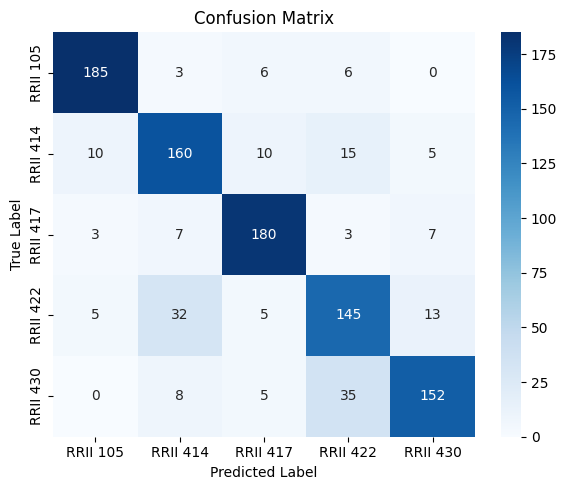

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix

# Example: if you already have y_true and y_pred with integer encodings 0–4
# y_true = ...
# y_pred = ...

# Or directly define the matrix (from your figure) if needed:
cm = np.array([
    [185,  3,  6,  6,  0],
    [ 10, 160, 10, 15,  5],
    [  3,  7, 180,  3,  7],
    [  5, 32,  5, 145, 13],
    [  0,  8,  5, 35, 152]
])

# Class labels in the order of encodings 0–4
class_names = ['RRII 105', 'RRII 414', 'RRII 417', 'RRII 422', 'RRII 430']

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)

plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()